In [1]:
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
%matplotlib inline  


/Users/chronowanderer/anaconda3/envs/tensorflow/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
%store -r numSeries
%store -r numPredict
%store -r TRAIN_SIZE
%store -r EFFECTIVE_COEFFICIENT
%store -r EFFECTIVE_LOC
%store -r tmax
%store -r h
%store -r lentmax

%store -r norm
%store -r a
%store -r sigma
%store -r tau
%store -r Target
%store -r Response
%store -r Error
%store -r RTloc
%store -r Dat


In [3]:
FORECAST_MAX = 32
TIME_STEPS = 32
HIDDEN_UNITS = 64
SECOND_HIDDEN_UNITS = 32
INPUT_UNITS = 2
OUTPUT_UNITS = 2
BATCH_SIZE = 4
EPOCH = 10
look_back = TIME_STEPS
T = numpy.linspace(0, tmax, lentmax, endpoint = False)
DATA_i = 0
DATA_f = lentmax - 1


In [4]:
def atan_positive(x, y):
    if (x > 0) & (y > 0):
        theta = math.atan(y / x)
    elif (x == 0) & (y > 0):
        theta = math.pi / 2
    elif (x < 0):
        theta = math.pi + math.atan(y / x)
    elif (x == 0) & (y < 0):
        theta = 3 * math.pi / 2
    elif (x > 0) & (y <= 0):
        theta = 2 * math.pi + math.atan(y / x)
    return theta

def semicircular_error(r, t):
    e = r - t
    if e >= 90:
        e = e - 180
    elif e < -90:
        e = e + 180
    return e

def quardric_dance(o, i):
    delta = o - i
    if delta >= 90:
        return o - 180
    elif delta < -90:
        return o + 180
    return o


In [5]:
Dat = numpy.array(Dat) # all data
Data = Dat[0 : numSeries, :, :] # training & testing & sequently predicting
Data_p = Dat[numSeries : numSeries + numPredict, :, :] # complete prediction

dataset, dataset_t = [], []
for i in numpy.arange(numSeries):
    for j in numpy.arange(lentmax):
        dataset.append(Data[i, j])
        dataset_t.append(Data[i, j])
dataset = numpy.array(dataset)
dataset_p = []
for i in numpy.arange(numPredict):
    for j in numpy.arange(lentmax):
        dataset_p.append(Data_p[i, j])
        dataset_t.append(Data_p[i, j])
predict = numpy.array(dataset_p)
dataset_t = numpy.array(dataset_t)

print dataset.shape, predict.shape, dataset_t.shape


(1000000, 2) (200000, 2) (1200000, 2)


In [6]:
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset_t = scaler.fit_transform(dataset_t)
dataset = dataset_t[0:numSeries*lentmax, :]
predict = dataset_t[numSeries*lentmax:(numSeries+numPredict)*lentmax, :]


In [7]:
TOTAL_TIME = Data.shape[1]

# split into train and test sets
train_size = TRAIN_SIZE
test_size = TOTAL_TIME - train_size + look_back
train, test = [], []
for k in range(numSeries):
    kk = k * TOTAL_TIME
    for t in range(kk, kk+train_size):
        train.append(dataset[t, :])
    for t in range(kk+train_size-look_back, kk+TOTAL_TIME):
        test.append(dataset[t, :])
train = numpy.array(train)
test = numpy.array(test)
        
print train.shape, test.shape, predict.shape

# use this function to prepare the train and test datasets for modeling
trainX, trainY = [], []
for k in range(numSeries):
    kk = k * train_size
    for i in range(train_size - look_back):
        temp = train[(kk + i) : (kk + i + look_back), :]
        trainX.append(temp)
        trainY.append(train[kk + i + look_back, :])
    
trainX = numpy.array(trainX)
trainY = numpy.array(trainY)

# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], look_back, trainX.shape[2]))


(50000, 2) (966000, 2) (200000, 2)


In [8]:
# create and fit the LSTM network
model = Sequential()

model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS)))
#model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS), return_sequences=True))
#model.add(LSTM(SECOND_HIDDEN_UNITS))

model.add(Dense(OUTPUT_UNITS))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs = EPOCH, batch_size = BATCH_SIZE, verbose = 2)


Epoch 1/10
 - 189s - loss: 3.0274e-04
Epoch 2/10
 - 187s - loss: 4.8120e-05
Epoch 3/10
 - 187s - loss: 4.3400e-05
Epoch 4/10
 - 187s - loss: 4.1462e-05
Epoch 5/10
 - 188s - loss: 3.9598e-05
Epoch 6/10
 - 187s - loss: 3.9489e-05
Epoch 7/10
 - 187s - loss: 3.8686e-05
Epoch 8/10
 - 187s - loss: 3.8327e-05
Epoch 9/10
 - 187s - loss: 3.7869e-05
Epoch 10/10
 - 186s - loss: 3.7534e-05


In [9]:
# prepare for the forecasting
trainPredict = model.predict(trainX)

# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform(trainY)
trainScore = math.sqrt(mean_squared_error(trainY, trainPredict))
print('Train Score: %.4f RMSE' % (trainScore))

# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(Data)
trainPredictPlot[:, :, :] = numpy.nan
for s in range(numSeries):
    for t in range(train_size - look_back):
        trainPredictPlot[s, t + look_back, :] = trainPredict[t + s * (train_size - look_back), :]


Train Score: 0.0380 RMSE


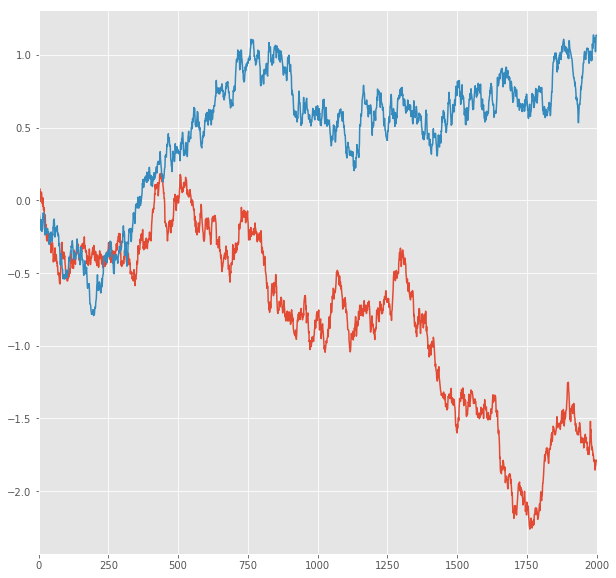

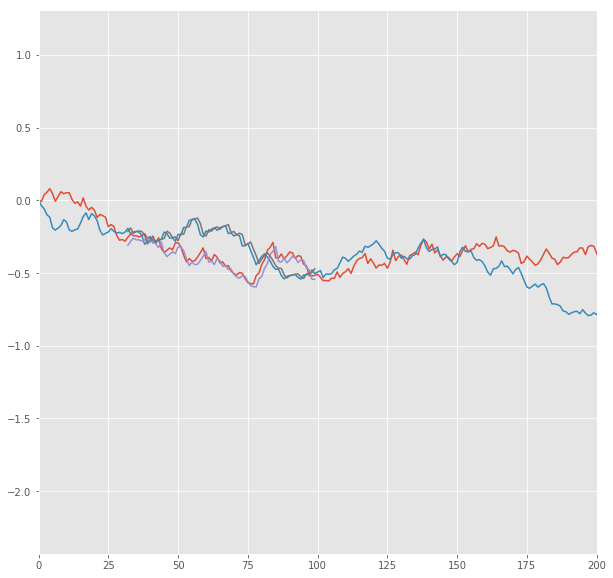

In [10]:
#lalala
plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, lentmax)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, TRAIN_SIZE + 100)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.plot(trainPredictPlot[loc, :, 0])
plt.plot(trainPredictPlot[loc, :, 1])
plt.show()


In [11]:
testX, predictX = [], []
for k in range(numSeries):
    kk = k * test_size
    for i in range(test_size - look_back):
        temp = test[(kk + i) : (kk + i + look_back), :]
        testX.append(temp)
for k in range(numPredict):
    kk = k * lentmax
    for i in range(lentmax - look_back):
        temp = predict[(kk + i) : (kk + i + look_back), :]
        predictX.append(temp)
testX = numpy.array(testX)
predictX = numpy.array(predictX)
testX = numpy.reshape(testX, (testX.shape[0], look_back, testX.shape[2]))
predictX = numpy.reshape(predictX, (predictX.shape[0], look_back, predictX.shape[2]))


1 -step(s) forecast:
Test Score for 1 -steps forecast: 0.0386 RMSE
Predict Score for 1 -steps forecast: 0.0383 RMSE
Error Test Score for 1 -steps forecast: 0.1499 RMSE
RT Test Score for 1 -steps forecast: 0.1281 RMSE
Error Test Corr for 1 -steps forecast: 0.9706
RT Test Corr for 1 -steps forecast: 0.9343


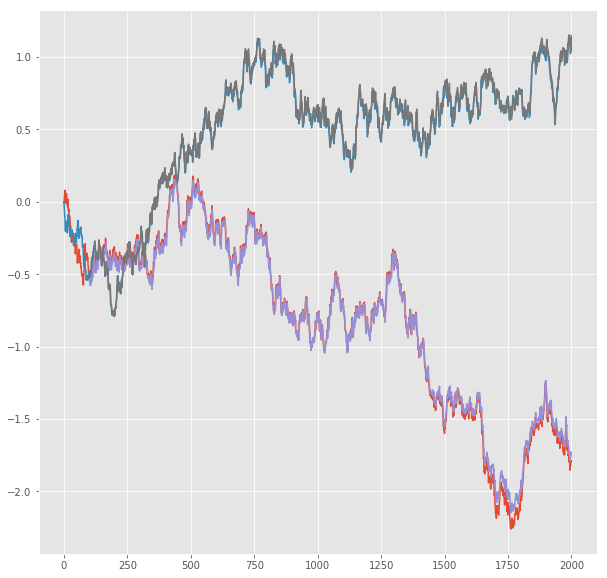

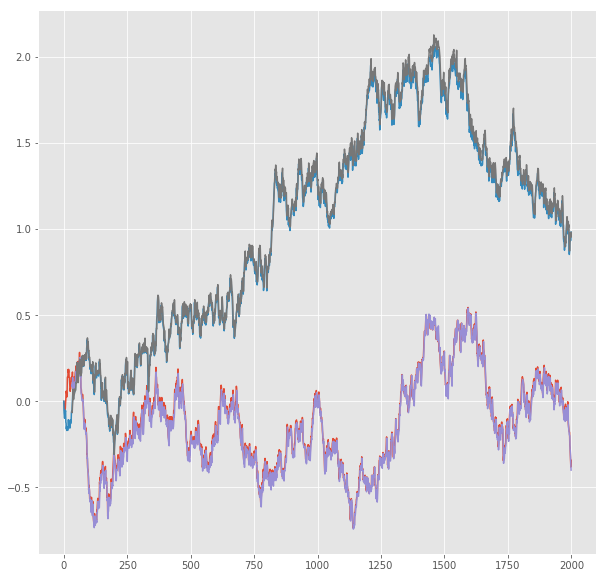

R^2 score for regression on Error: 0.9421
k = 0.9803


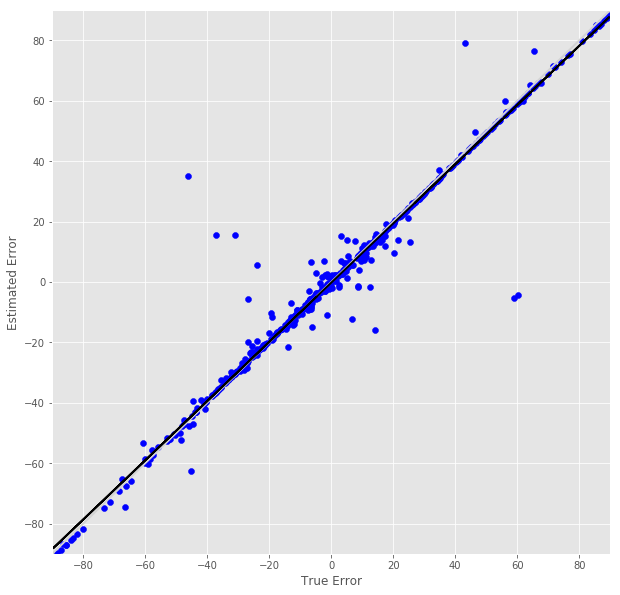

R^2 score for regression on RT: 0.8729
k = 0.9508


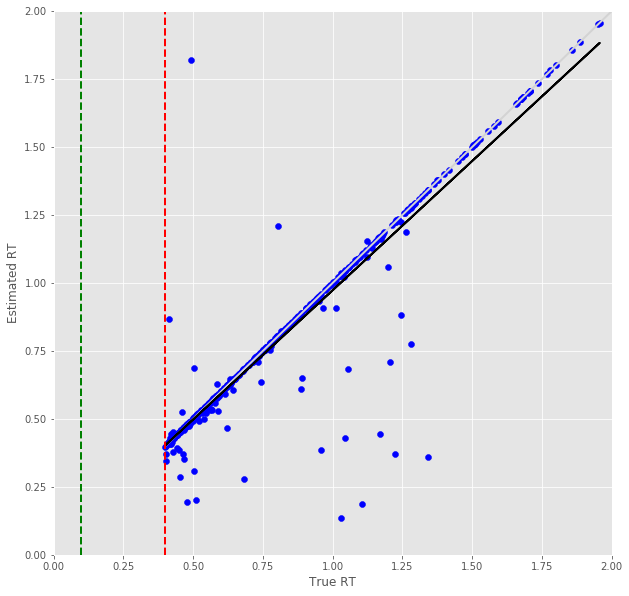

Error Prediction Score: 0.0717 RMSE
RT Prediction Score: 0.0445 RMSE
Error Prediction Corr: 0.9918
RT Prediction Corr: 0.9898
R^2 score for regression on Error: 0.9836
k = 0.9744


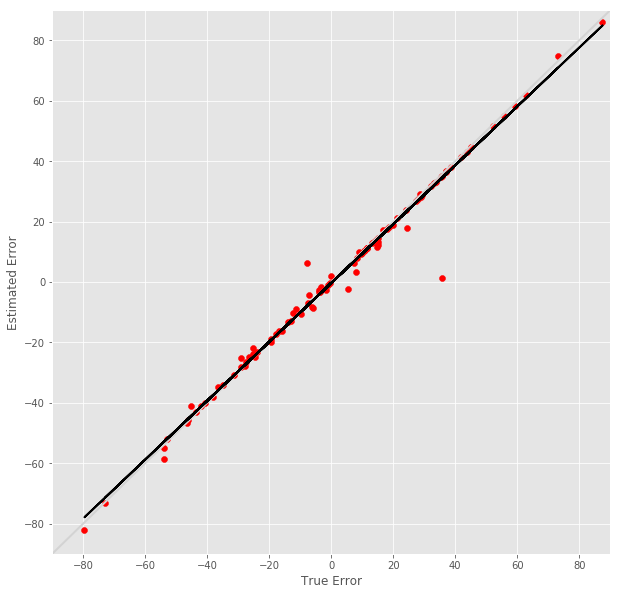

R^2 score for regression on RT: 0.9798
k = 1.0023


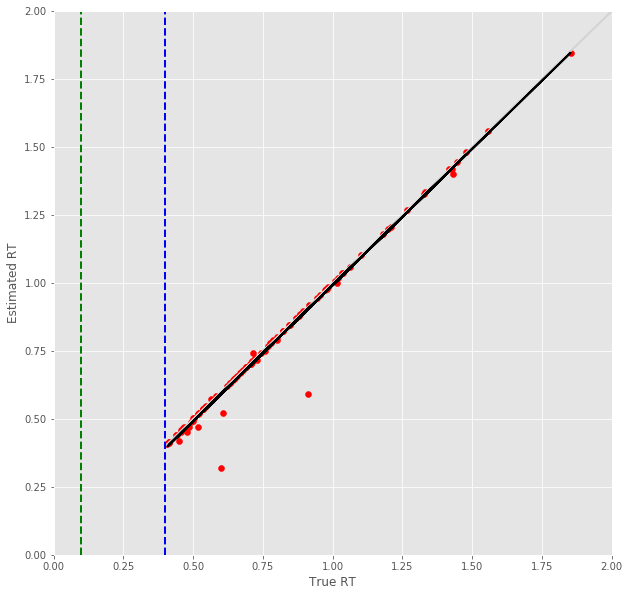

2 -step(s) forecast:
Test Score for 2 -steps forecast: 0.0628 RMSE
Predict Score for 2 -steps forecast: 0.0622 RMSE
Error Test Score for 2 -steps forecast: 0.1569 RMSE
RT Test Score for 2 -steps forecast: 0.1334 RMSE
Error Test Corr for 2 -steps forecast: 0.9672
RT Test Corr for 2 -steps forecast: 0.9296


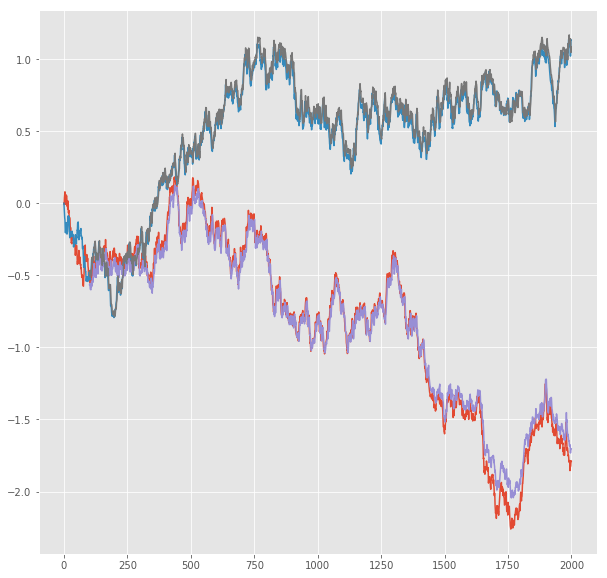

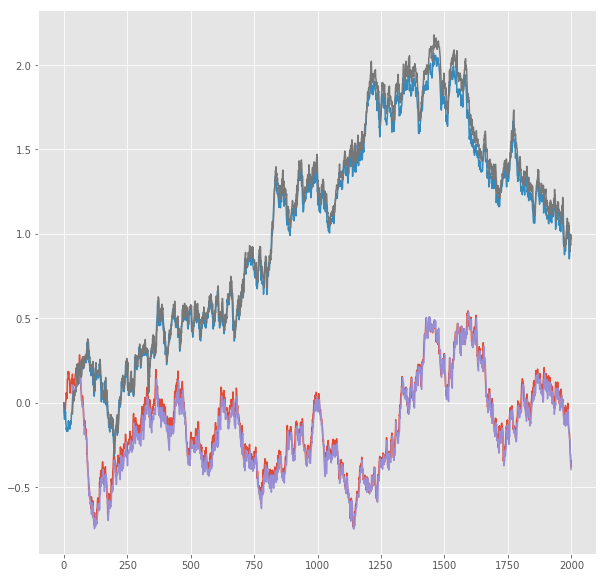

R^2 score for regression on Error: 0.9354
k = 0.9621


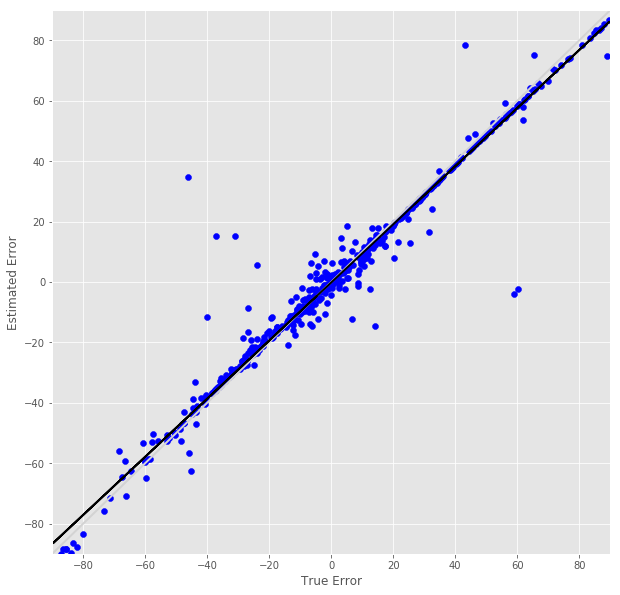

R^2 score for regression on RT: 0.8641
k = 0.9521


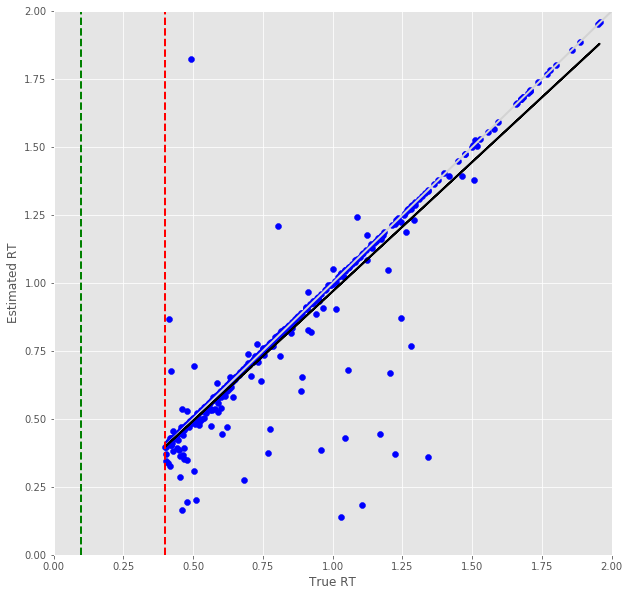

Error Prediction Score: 0.1198 RMSE
RT Prediction Score: 0.0803 RMSE
Error Prediction Corr: 0.9766
RT Prediction Corr: 0.9668
R^2 score for regression on Error: 0.9537
k = 0.9648


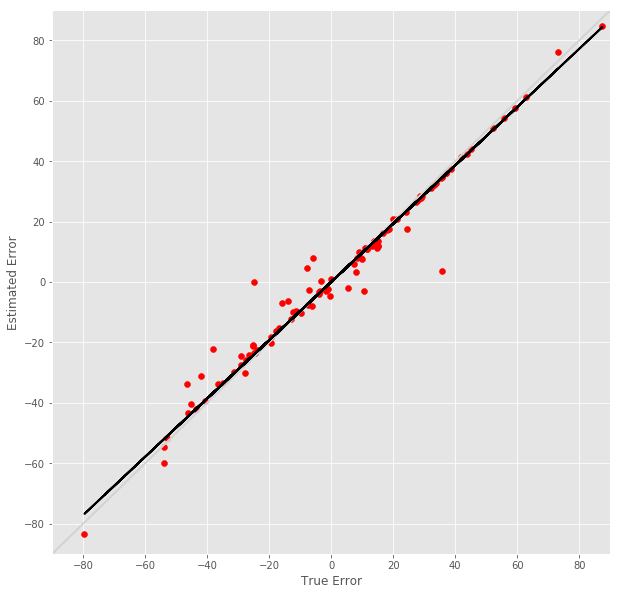

R^2 score for regression on RT: 0.9348
k = 0.9978


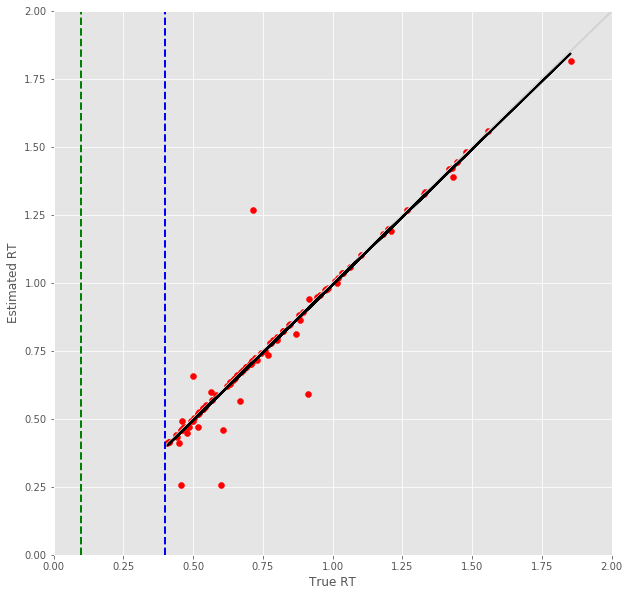

3 -step(s) forecast:
Test Score for 3 -steps forecast: 0.0856 RMSE
Predict Score for 3 -steps forecast: 0.0845 RMSE
Error Test Score for 3 -steps forecast: 0.1959 RMSE
RT Test Score for 3 -steps forecast: 0.1763 RMSE
Error Test Corr for 3 -steps forecast: 0.9485
RT Test Corr for 3 -steps forecast: 0.8801


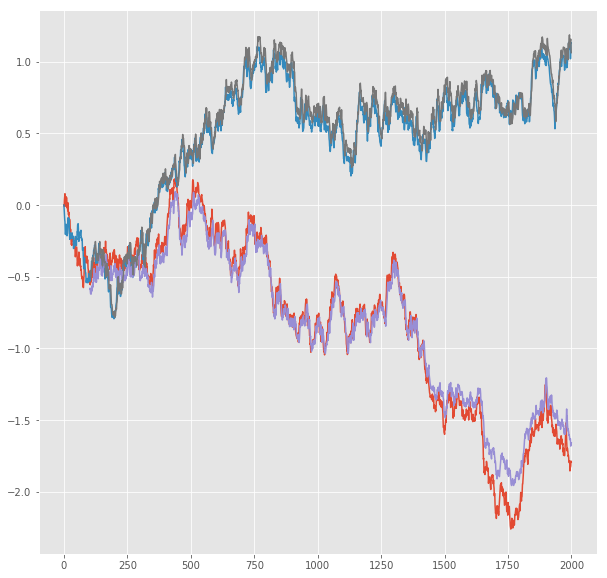

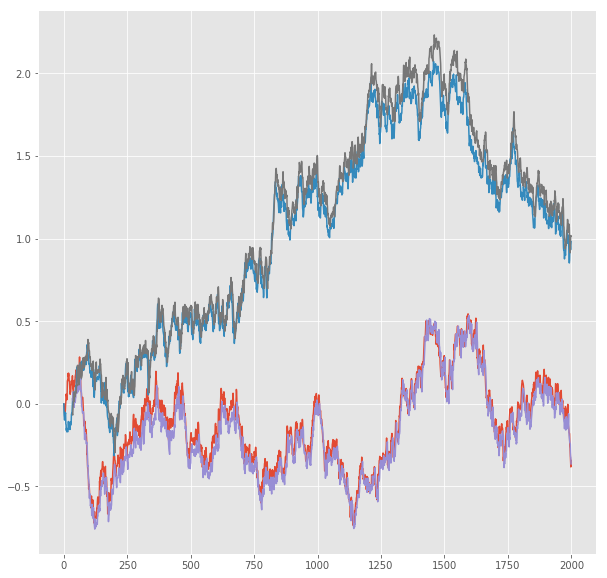

R^2 score for regression on Error: 0.8996
k = 0.9328


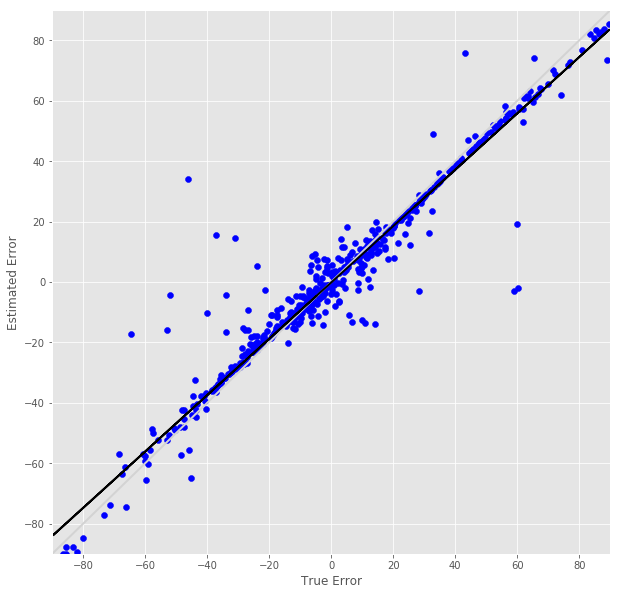

R^2 score for regression on RT: 0.7746
k = 0.9012


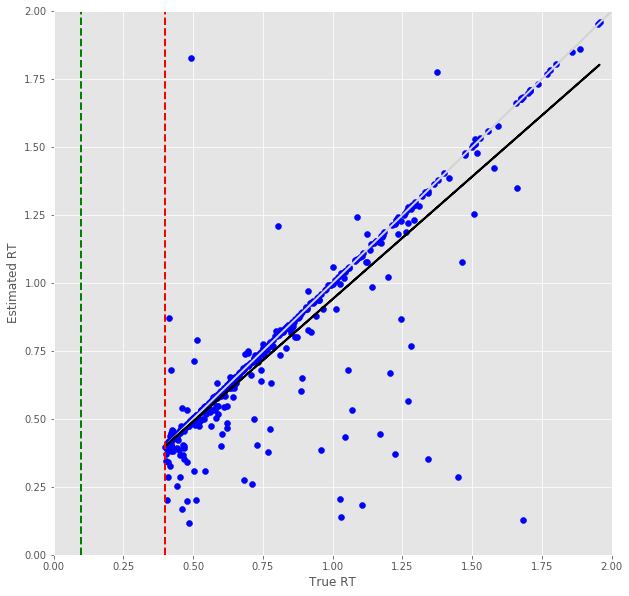

Error Prediction Score: 0.1889 RMSE
RT Prediction Score: 0.1783 RMSE
Error Prediction Corr: 0.9405
RT Prediction Corr: 0.8520
R^2 score for regression on Error: 0.8846
k = 0.8863


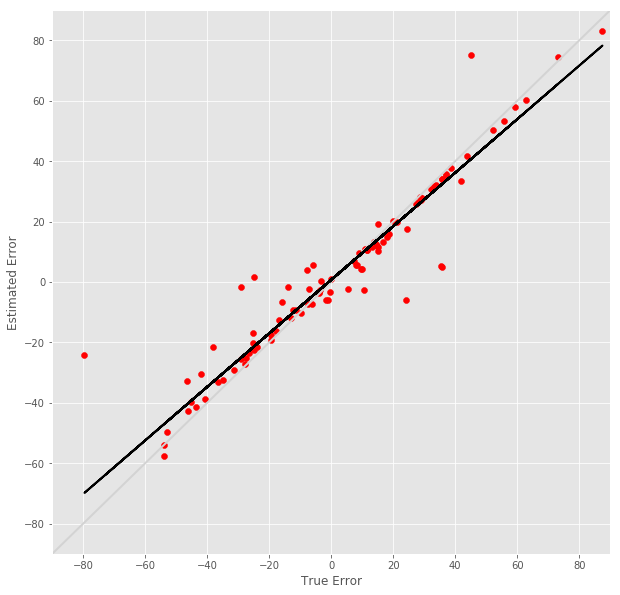

R^2 score for regression on RT: 0.7258
k = 0.9402


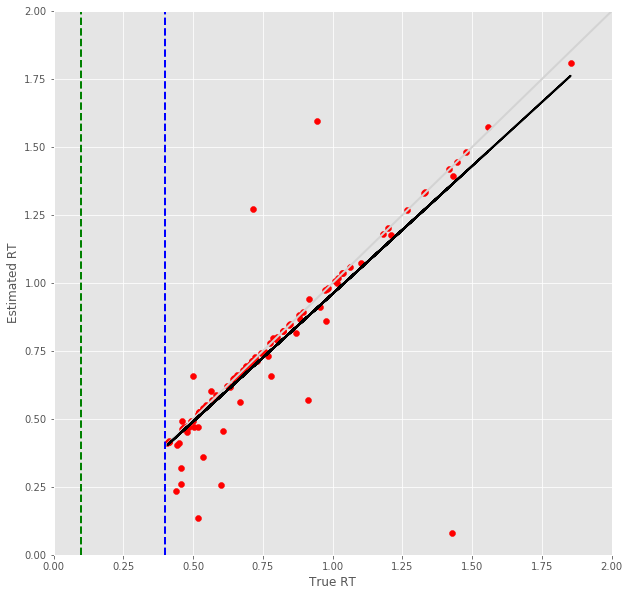

4 -step(s) forecast:
Test Score for 4 -steps forecast: 0.1076 RMSE
Predict Score for 4 -steps forecast: 0.1062 RMSE
Error Test Score for 4 -steps forecast: 0.2283 RMSE
RT Test Score for 4 -steps forecast: 0.1971 RMSE
Error Test Corr for 4 -steps forecast: 0.9292
RT Test Corr for 4 -steps forecast: 0.8565


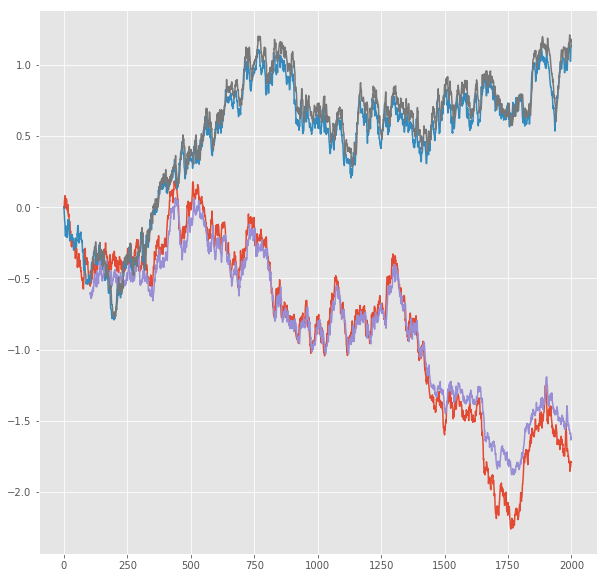

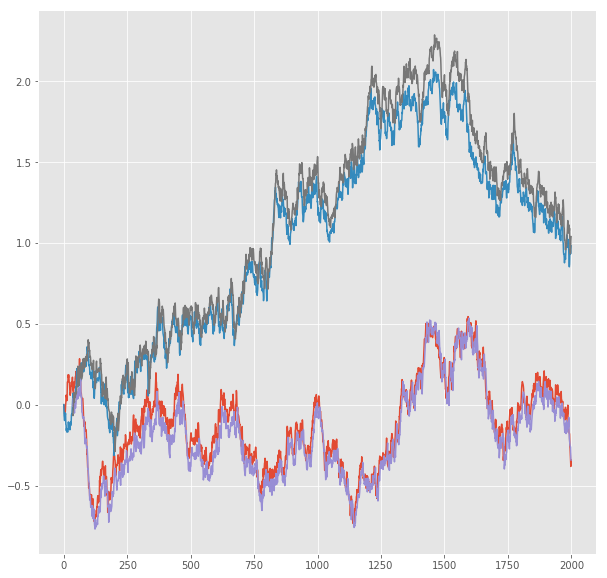

R^2 score for regression on Error: 0.8634
k = 0.8960


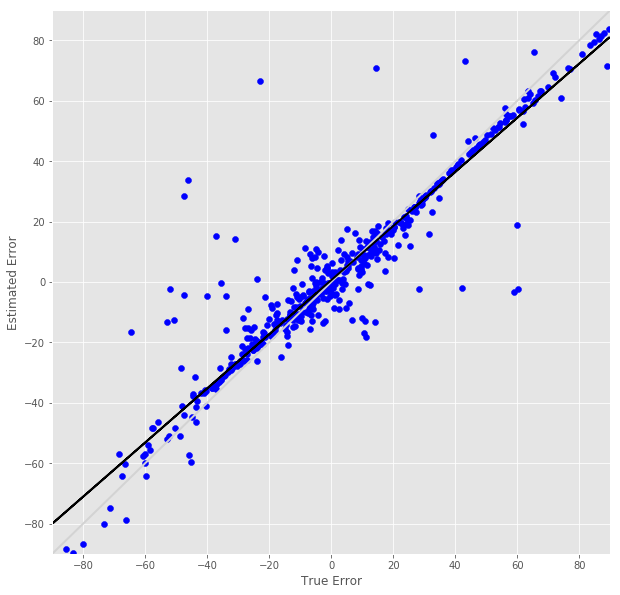

R^2 score for regression on RT: 0.7336
k = 0.9036


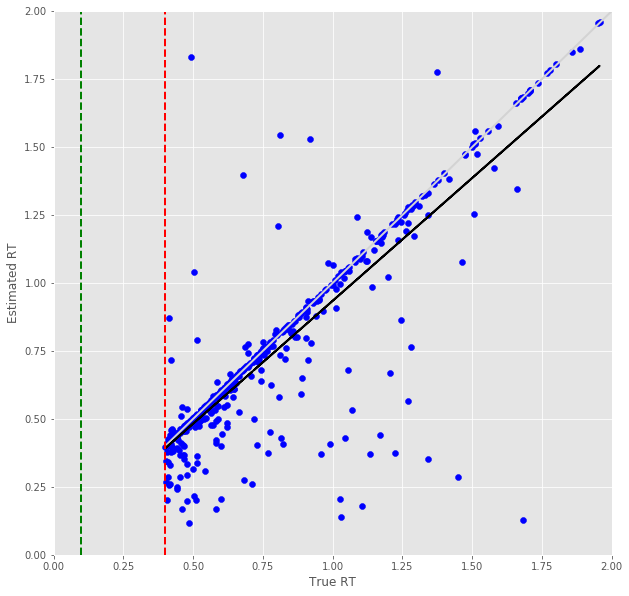

Error Prediction Score: 0.2452 RMSE
RT Prediction Score: 0.2106 RMSE
Error Prediction Corr: 0.8992
RT Prediction Corr: 0.7876
R^2 score for regression on Error: 0.8086
k = 0.8566


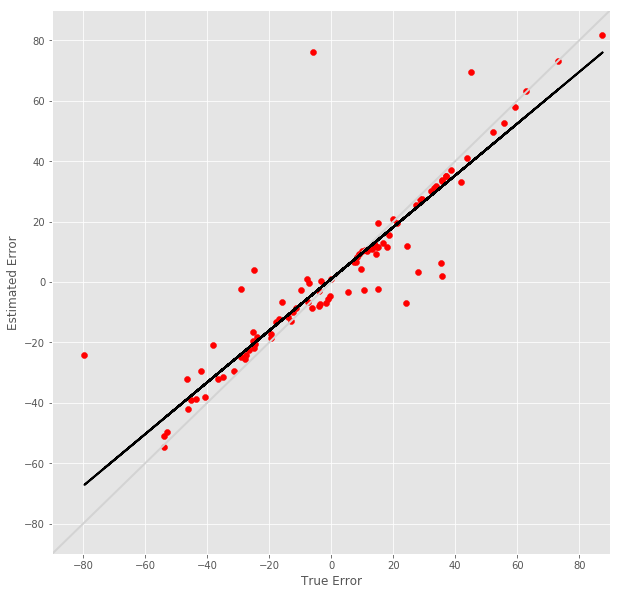

R^2 score for regression on RT: 0.6204
k = 0.8367


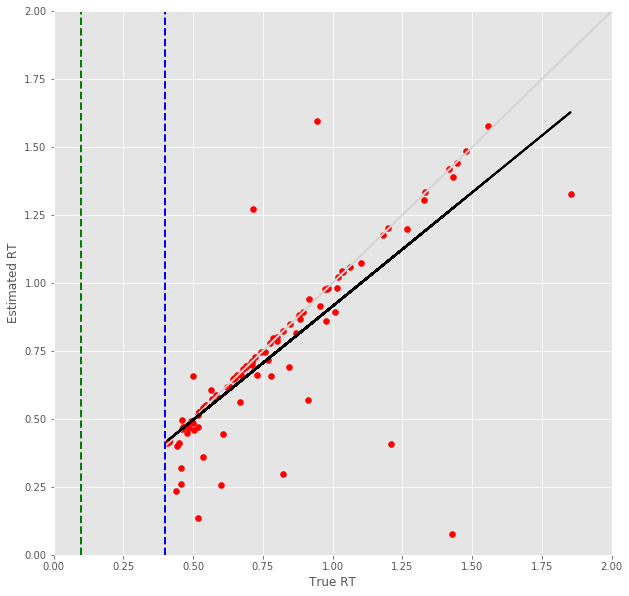

5 -step(s) forecast:
Test Score for 5 -steps forecast: 0.1292 RMSE
Predict Score for 5 -steps forecast: 0.1273 RMSE
Error Test Score for 5 -steps forecast: 0.2670 RMSE
RT Test Score for 5 -steps forecast: 0.2229 RMSE
Error Test Corr for 5 -steps forecast: 0.9029
RT Test Corr for 5 -steps forecast: 0.8212


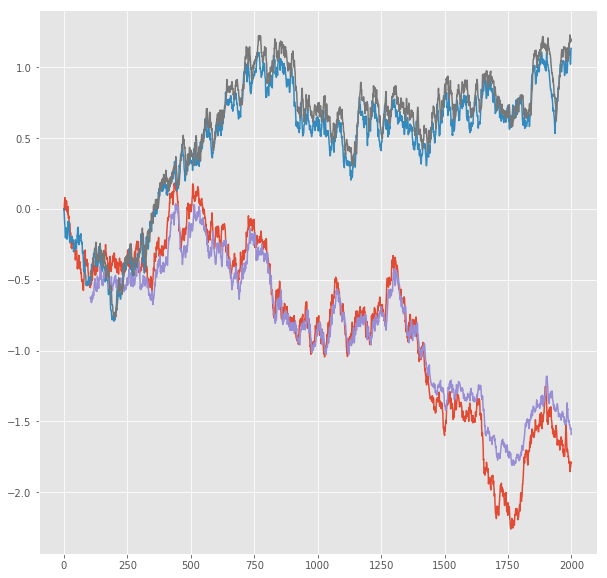

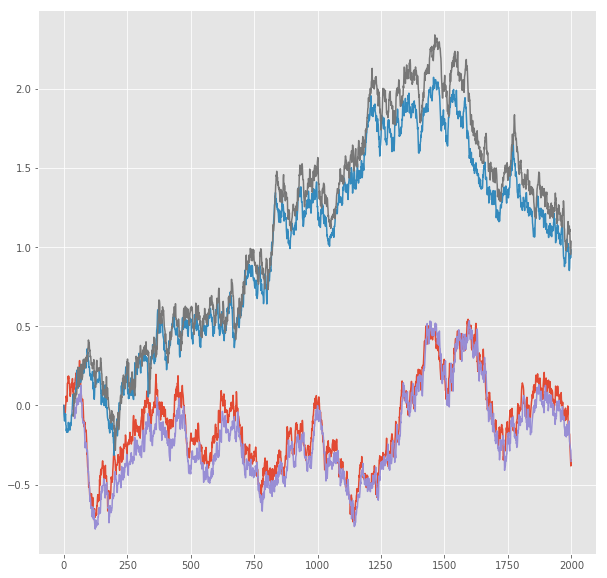

R^2 score for regression on Error: 0.8152
k = 0.8722


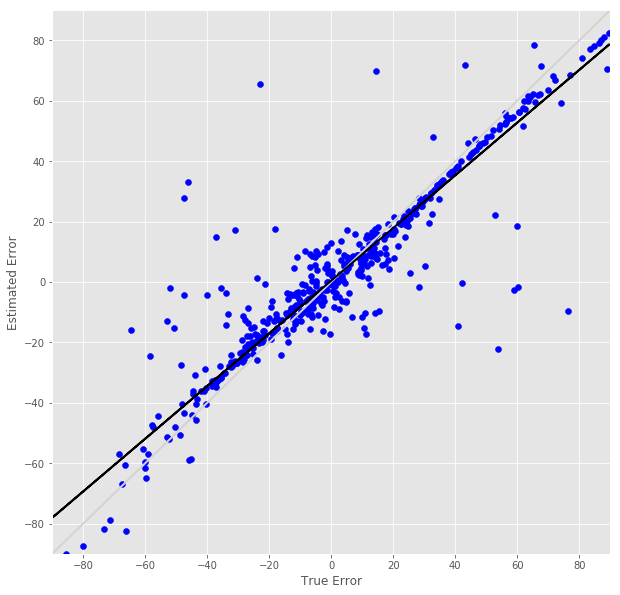

R^2 score for regression on RT: 0.6743
k = 0.8681


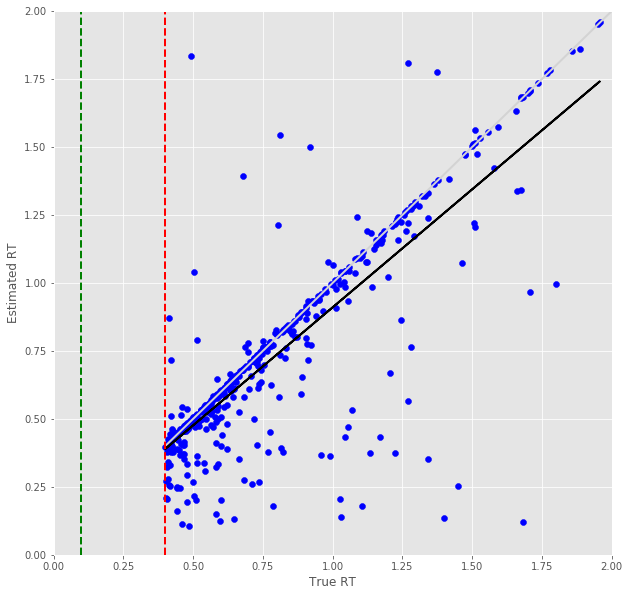

Error Prediction Score: 0.2583 RMSE
RT Prediction Score: 0.2672 RMSE
Error Prediction Corr: 0.8855
RT Prediction Corr: 0.6761
R^2 score for regression on Error: 0.7840
k = 0.8228


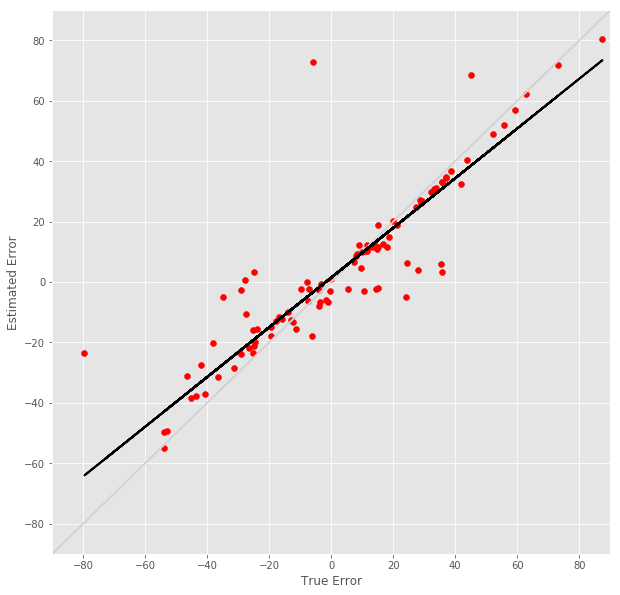

R^2 score for regression on RT: 0.4572
k = 0.7181


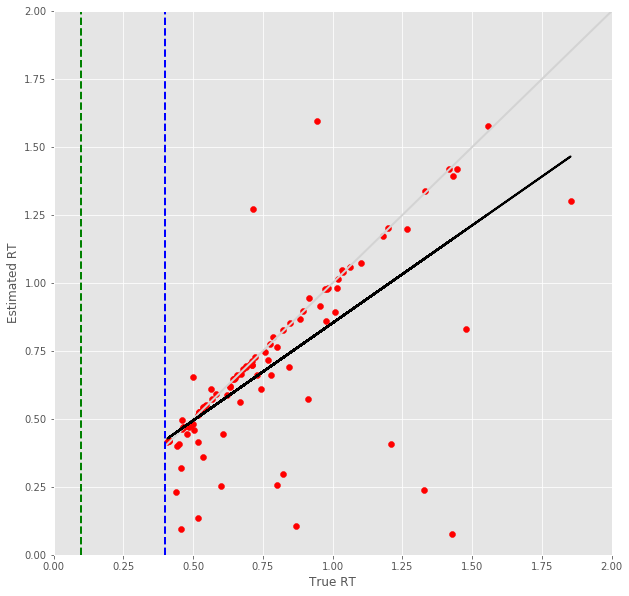

6 -step(s) forecast:
Test Score for 6 -steps forecast: 0.1503 RMSE
Predict Score for 6 -steps forecast: 0.1480 RMSE
Error Test Score for 6 -steps forecast: 0.2878 RMSE
RT Test Score for 6 -steps forecast: 0.2605 RMSE
Error Test Corr for 6 -steps forecast: 0.8854
RT Test Corr for 6 -steps forecast: 0.7607


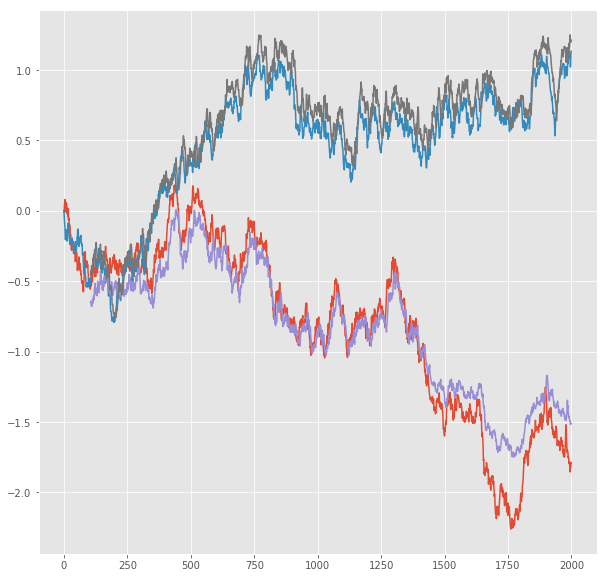

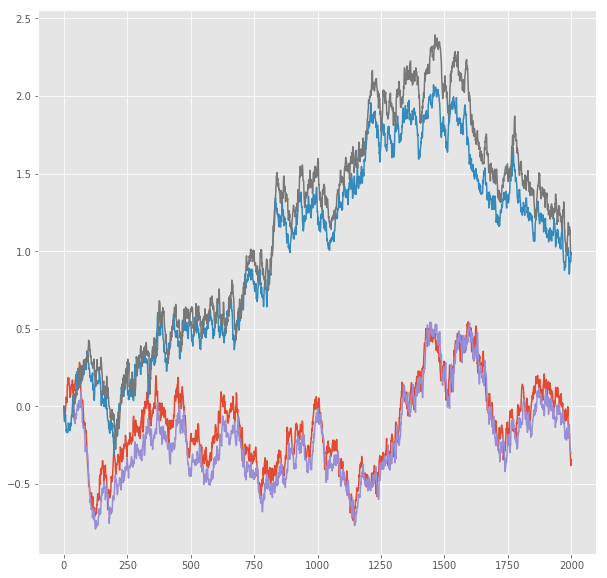

R^2 score for regression on Error: 0.7839
k = 0.8378


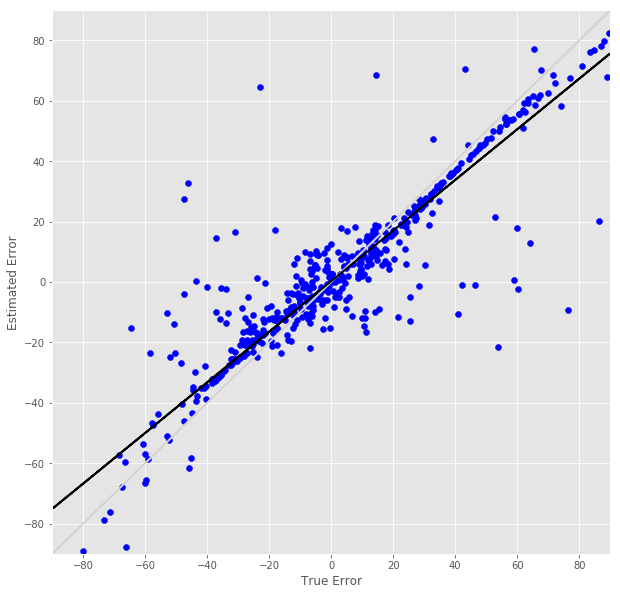

R^2 score for regression on RT: 0.5787
k = 0.7932


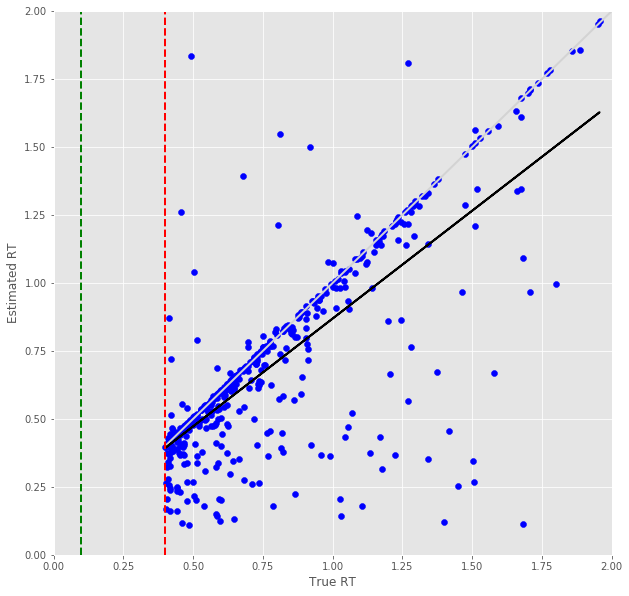

Error Prediction Score: 0.3135 RMSE
RT Prediction Score: 0.2939 RMSE
Error Prediction Corr: 0.8317
RT Prediction Corr: 0.6292
R^2 score for regression on Error: 0.6918
k = 0.7644


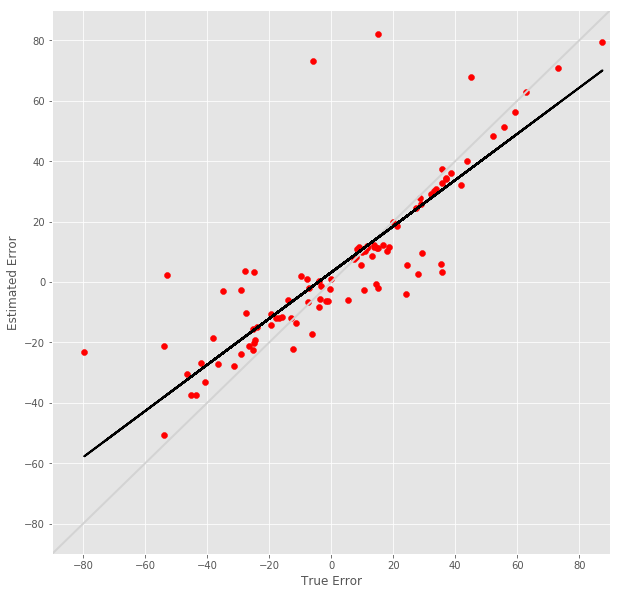

R^2 score for regression on RT: 0.3959
k = 0.6954


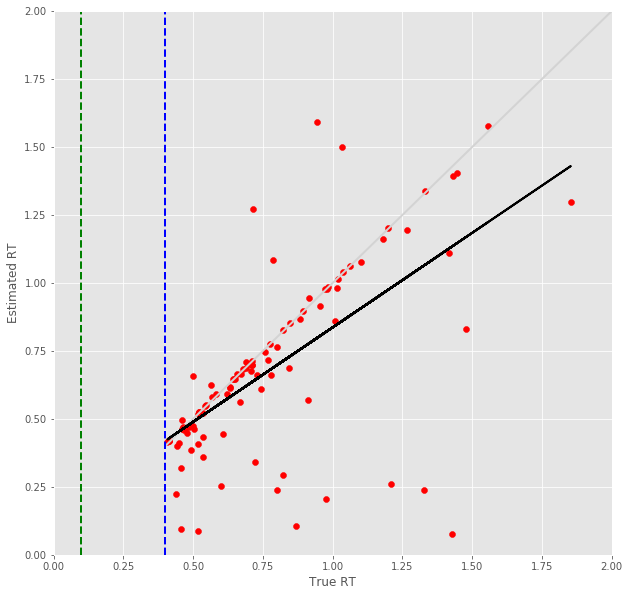

7 -step(s) forecast:
Test Score for 7 -steps forecast: 0.1712 RMSE
Predict Score for 7 -steps forecast: 0.1685 RMSE
Error Test Score for 7 -steps forecast: 0.3052 RMSE
RT Test Score for 7 -steps forecast: 0.2777 RMSE
Error Test Corr for 7 -steps forecast: 0.8708
RT Test Corr for 7 -steps forecast: 0.7367


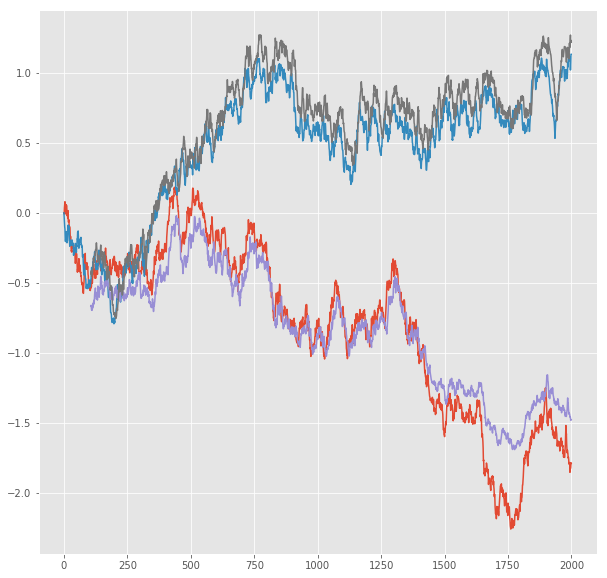

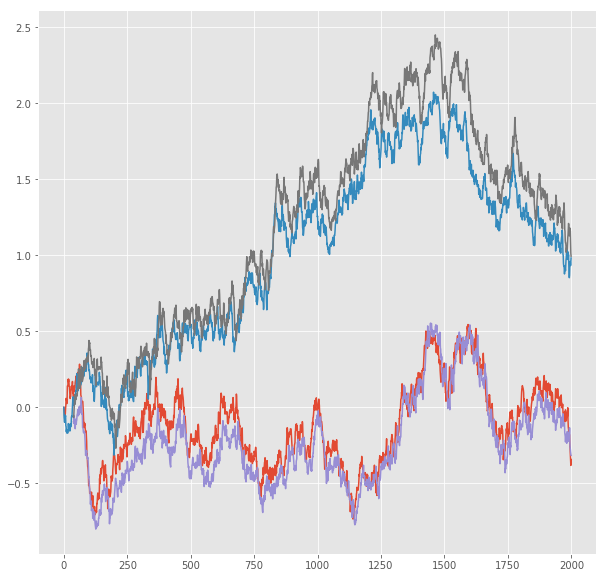

R^2 score for regression on Error: 0.7583
k = 0.8215


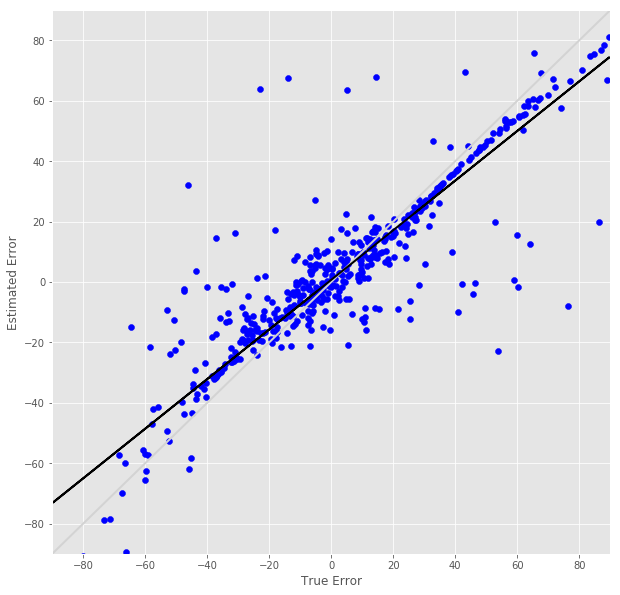

R^2 score for regression on RT: 0.5427
k = 0.7625


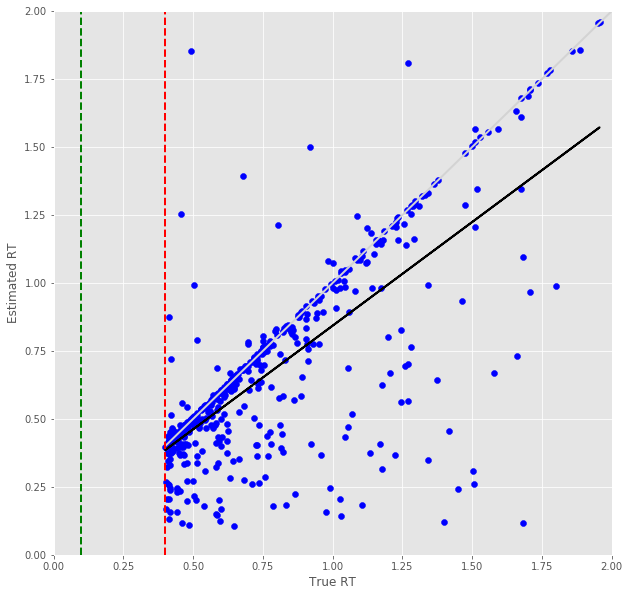

Error Prediction Score: 0.3450 RMSE
RT Prediction Score: 0.3186 RMSE
Error Prediction Corr: 0.7960
RT Prediction Corr: 0.5846
R^2 score for regression on Error: 0.6337
k = 0.7324


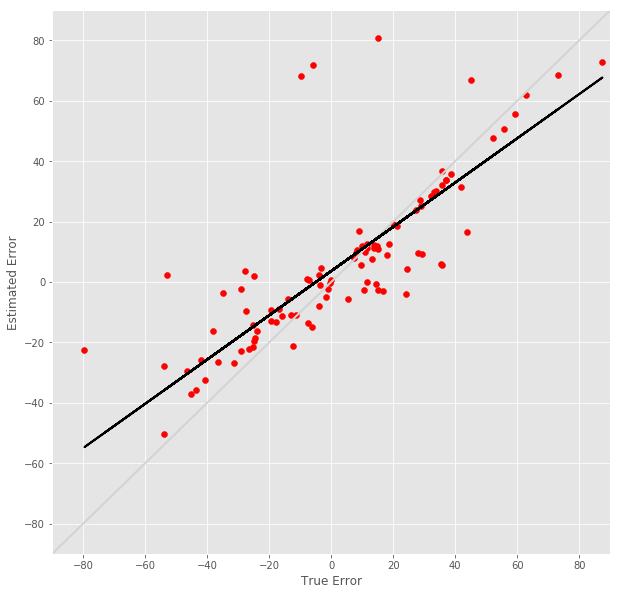

R^2 score for regression on RT: 0.3417
k = 0.6516


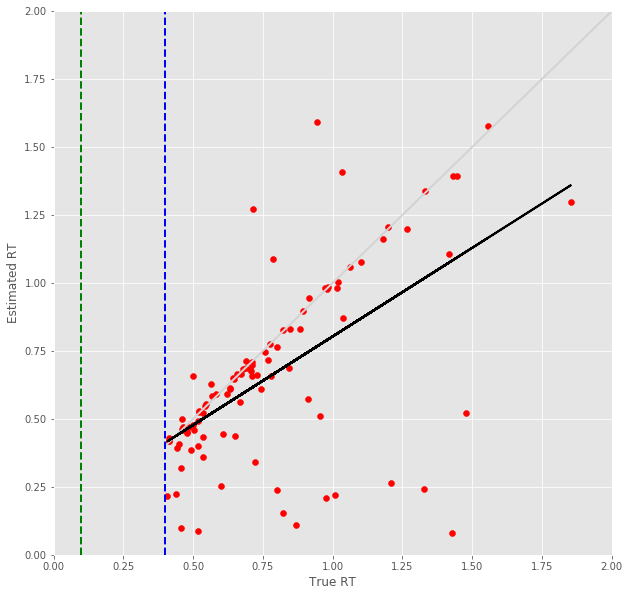

8 -step(s) forecast:
Test Score for 8 -steps forecast: 0.1919 RMSE
Predict Score for 8 -steps forecast: 0.1887 RMSE
Error Test Score for 8 -steps forecast: 0.3317 RMSE
RT Test Score for 8 -steps forecast: 0.2956 RMSE
Error Test Corr for 8 -steps forecast: 0.8465
RT Test Corr for 8 -steps forecast: 0.7184


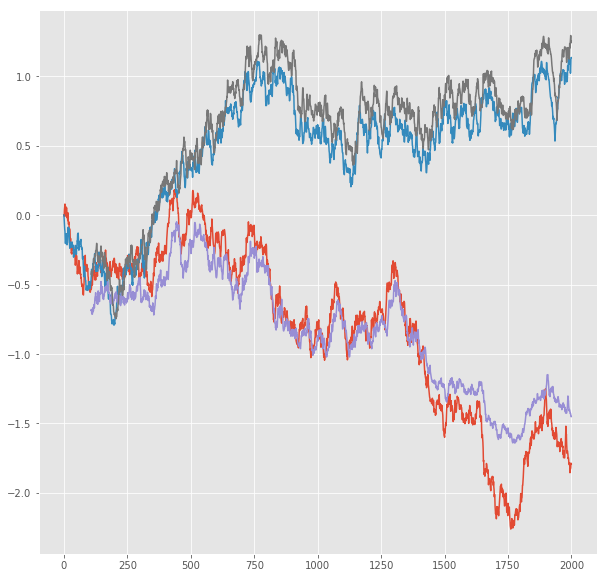

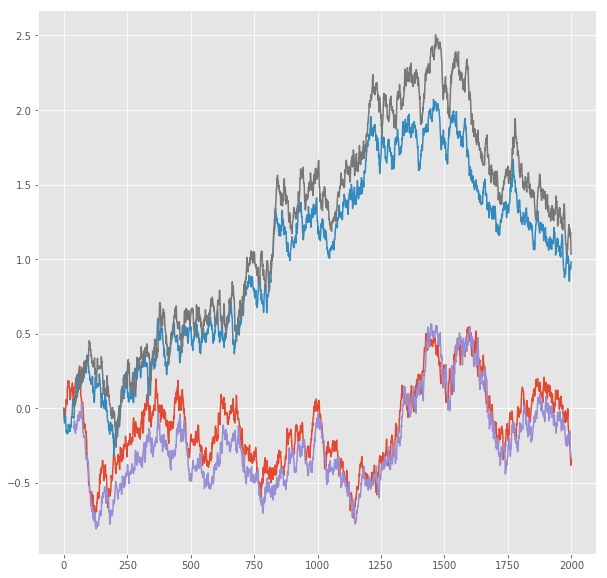

R^2 score for regression on Error: 0.7165
k = 0.7941


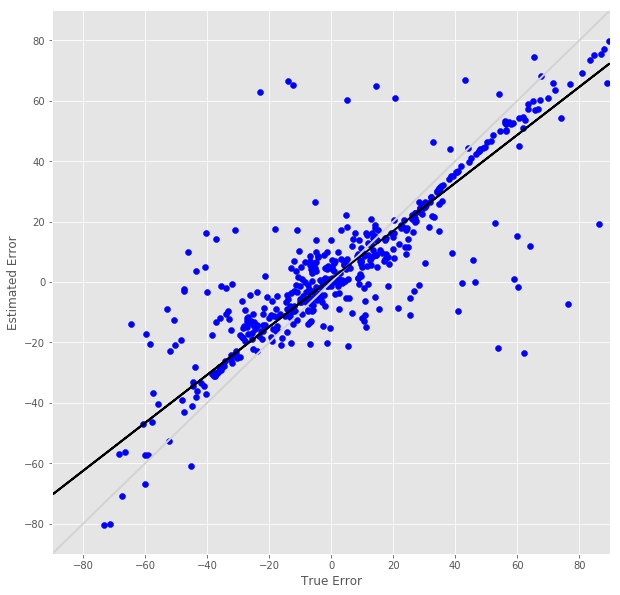

R^2 score for regression on RT: 0.5161
k = 0.7509


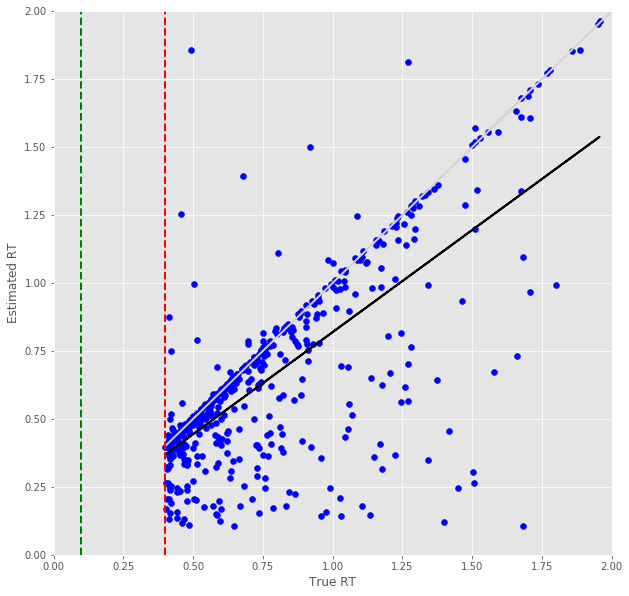

Error Prediction Score: 0.3596 RMSE
RT Prediction Score: 0.3271 RMSE
Error Prediction Corr: 0.7788
RT Prediction Corr: 0.5958
R^2 score for regression on Error: 0.6065
k = 0.7174


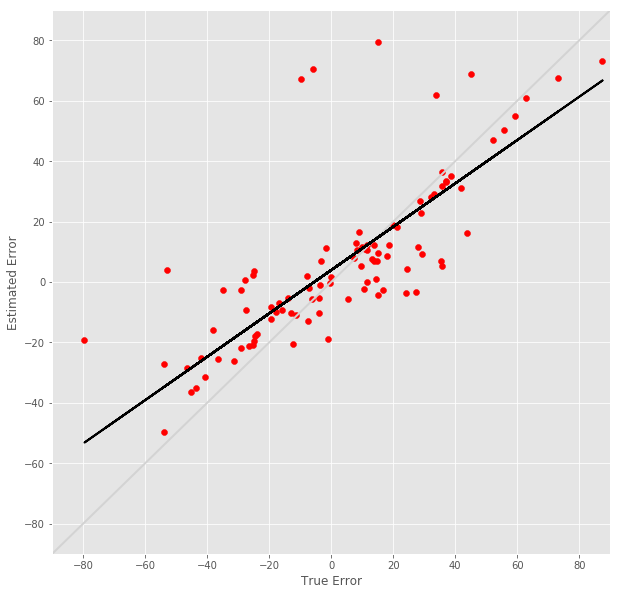

R^2 score for regression on RT: 0.3549
k = 0.6852


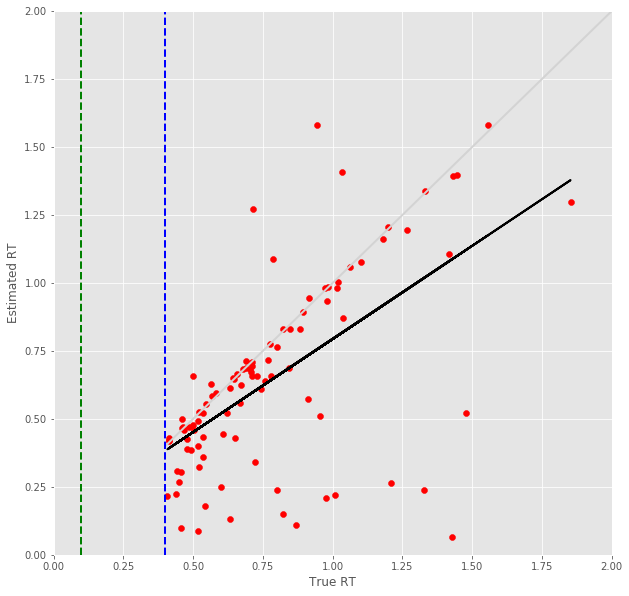

9 -step(s) forecast:
Test Score for 9 -steps forecast: 0.2123 RMSE
Predict Score for 9 -steps forecast: 0.2087 RMSE
Error Test Score for 9 -steps forecast: 0.3533 RMSE
RT Test Score for 9 -steps forecast: 0.3157 RMSE
Error Test Corr for 9 -steps forecast: 0.8246
RT Test Corr for 9 -steps forecast: 0.6865


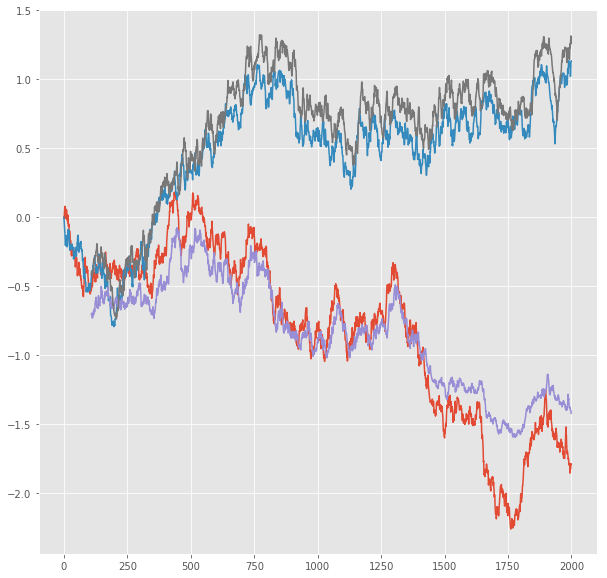

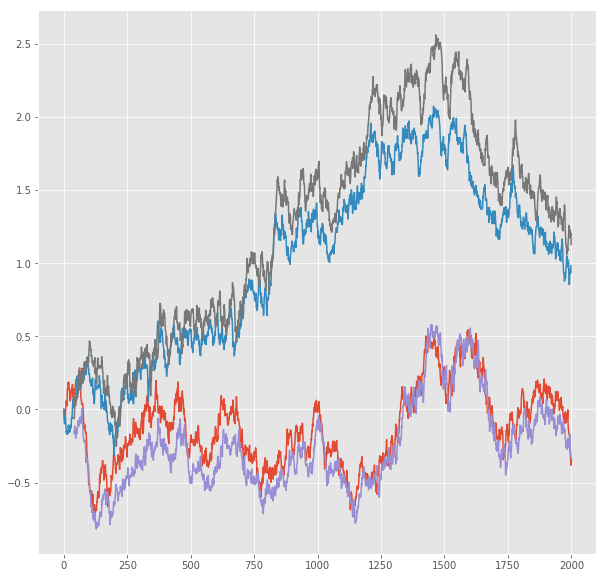

R^2 score for regression on Error: 0.6800
k = 0.7657


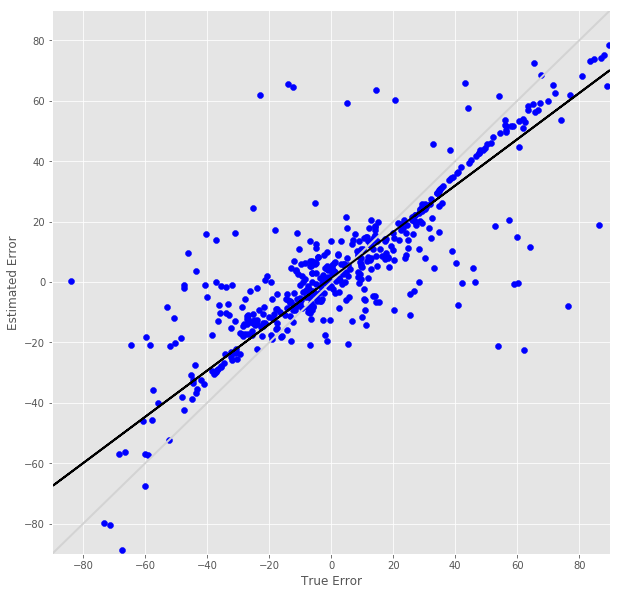

R^2 score for regression on RT: 0.4713
k = 0.7070


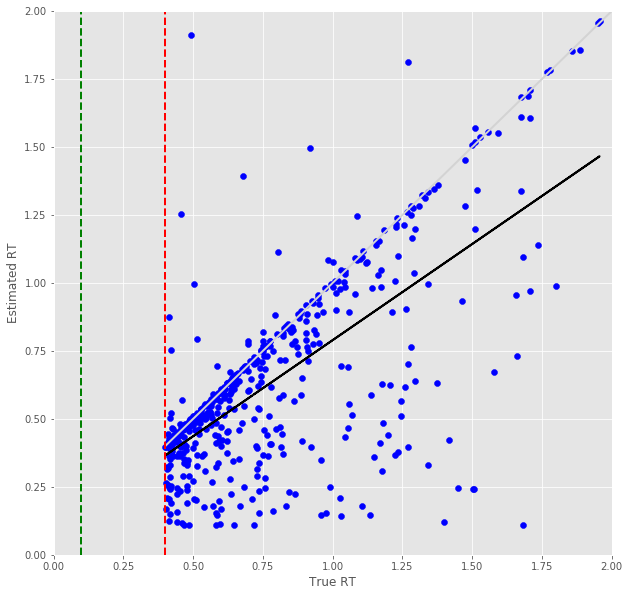

Error Prediction Score: 0.3644 RMSE
RT Prediction Score: 0.3491 RMSE
Error Prediction Corr: 0.7695
RT Prediction Corr: 0.5402
R^2 score for regression on Error: 0.5921
k = 0.6953


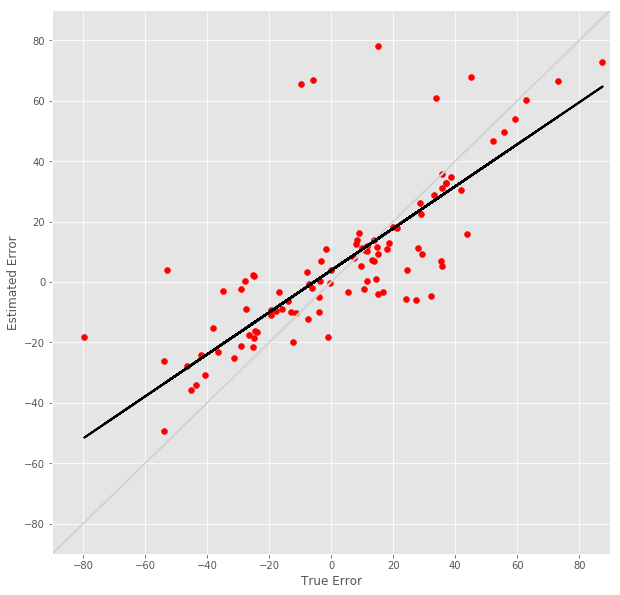

R^2 score for regression on RT: 0.2918
k = 0.6040


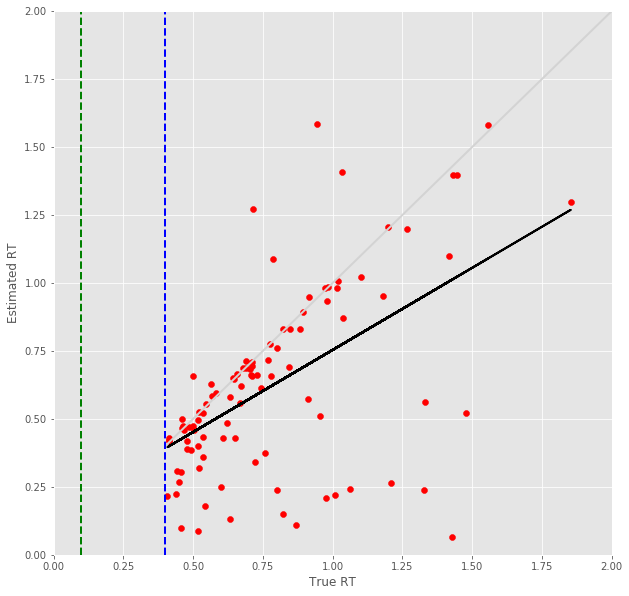

10 -step(s) forecast:
Test Score for 10 -steps forecast: 0.2325 RMSE
Predict Score for 10 -steps forecast: 0.2284 RMSE
Error Test Score for 10 -steps forecast: 0.3655 RMSE
RT Test Score for 10 -steps forecast: 0.3417 RMSE
Error Test Corr for 10 -steps forecast: 0.8072
RT Test Corr for 10 -steps forecast: 0.6373


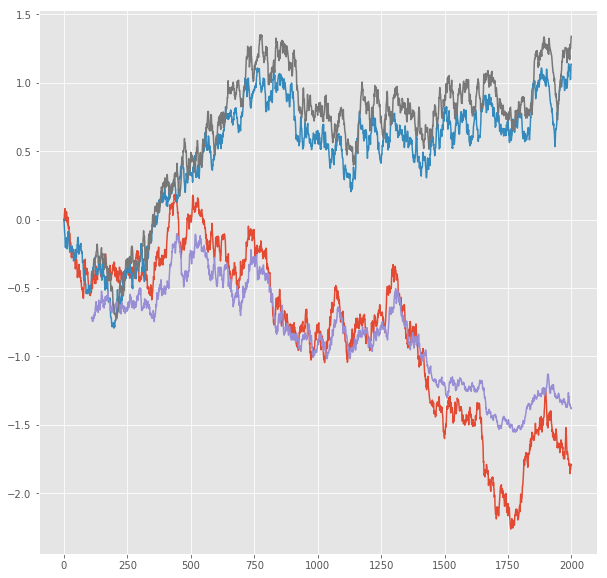

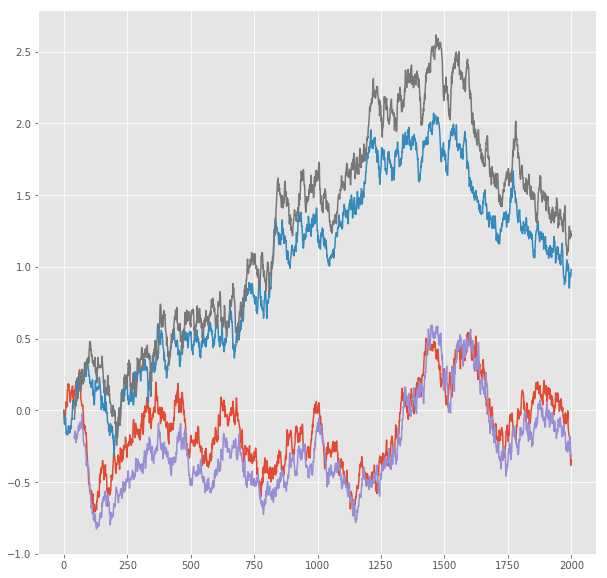

R^2 score for regression on Error: 0.6516
k = 0.7130


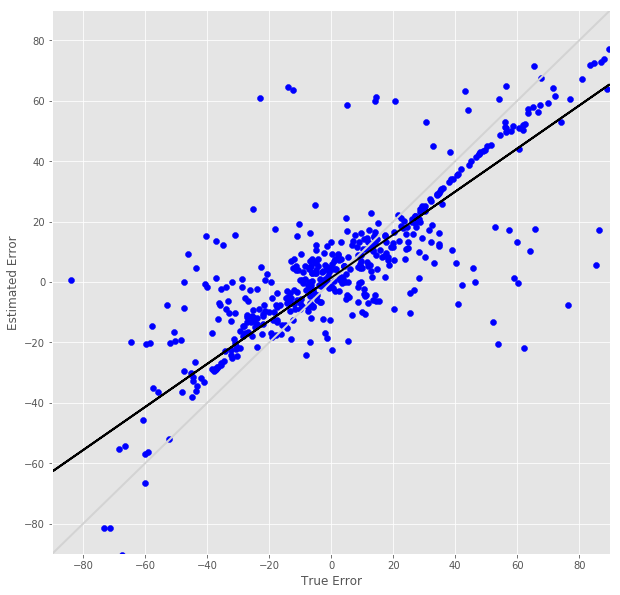

R^2 score for regression on RT: 0.4061
k = 0.6372


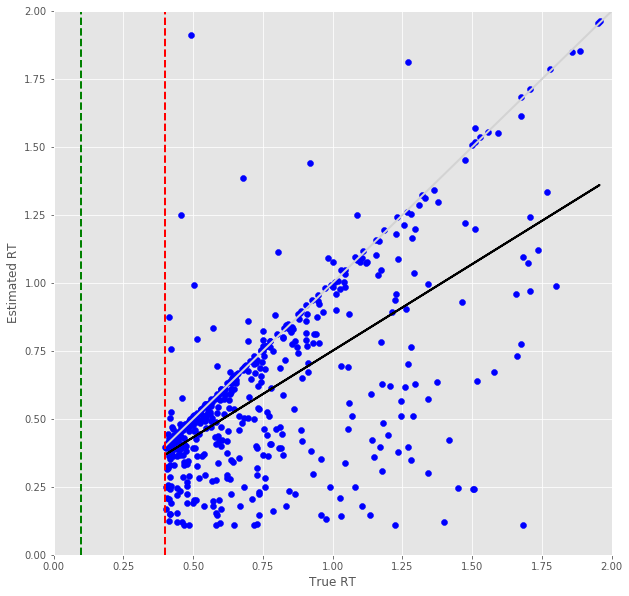

Error Prediction Score: 0.3736 RMSE
RT Prediction Score: 0.3612 RMSE
Error Prediction Corr: 0.7556
RT Prediction Corr: 0.5213
R^2 score for regression on Error: 0.5709
k = 0.6726


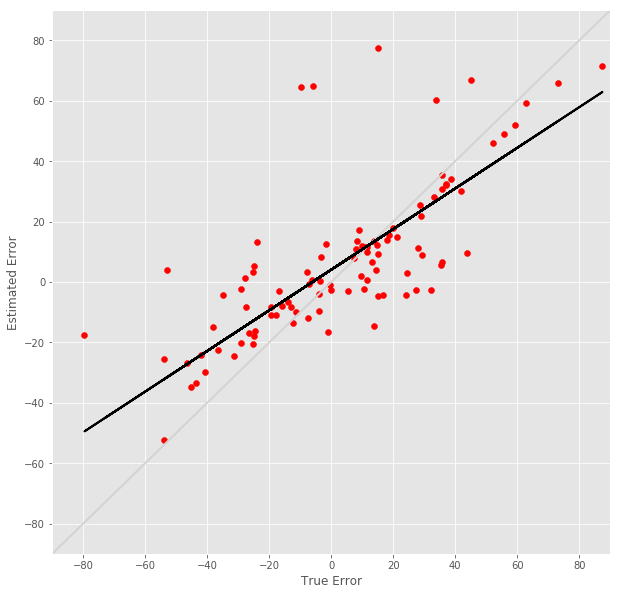

R^2 score for regression on RT: 0.2718
k = 0.5843


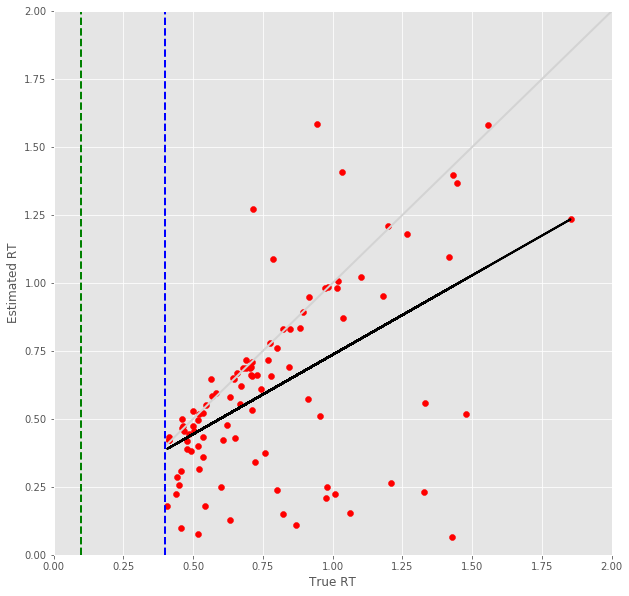

11 -step(s) forecast:
Test Score for 11 -steps forecast: 0.2525 RMSE
Predict Score for 11 -steps forecast: 0.2480 RMSE
Error Test Score for 11 -steps forecast: 0.3871 RMSE
RT Test Score for 11 -steps forecast: 0.3579 RMSE
Error Test Corr for 11 -steps forecast: 0.7847
RT Test Corr for 11 -steps forecast: 0.6044


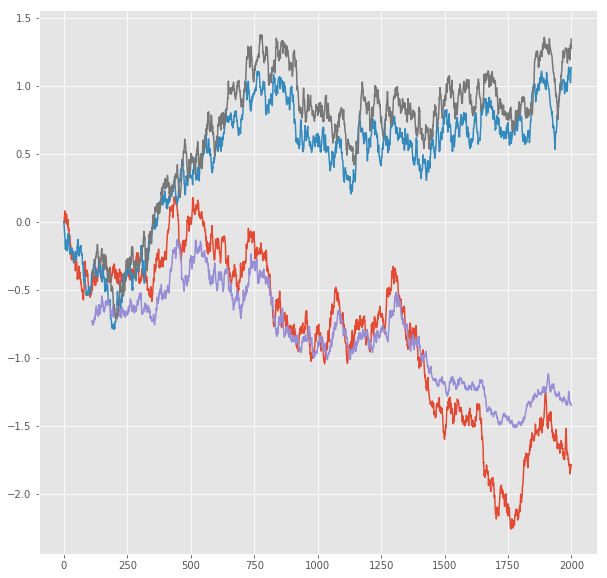

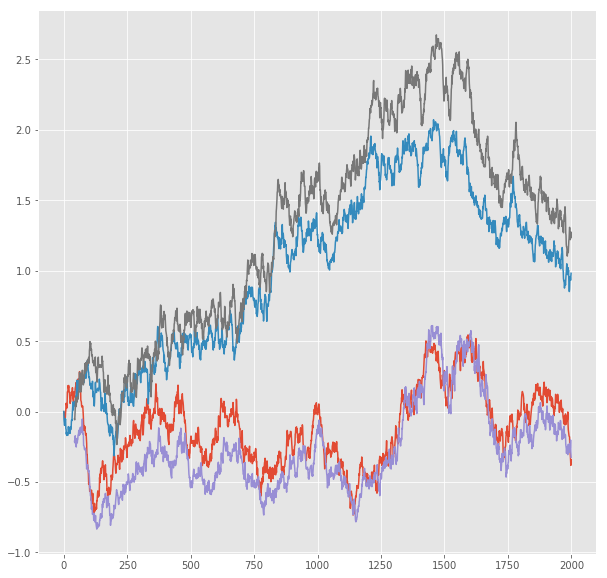

R^2 score for regression on Error: 0.6157
k = 0.7056


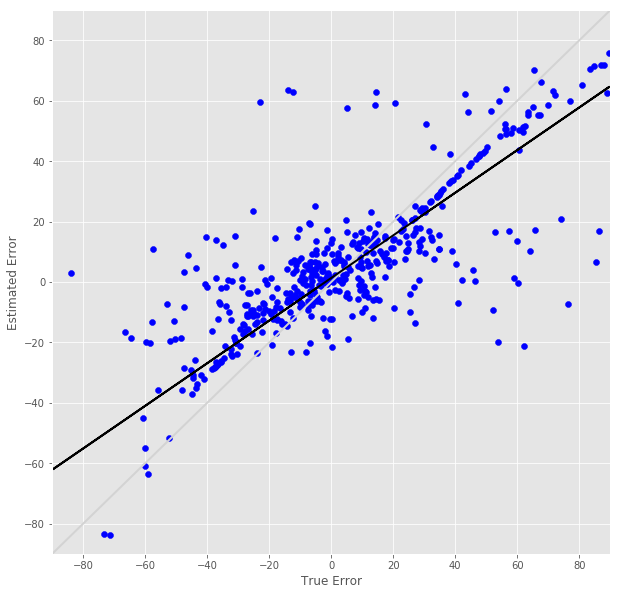

R^2 score for regression on RT: 0.3653
k = 0.6024


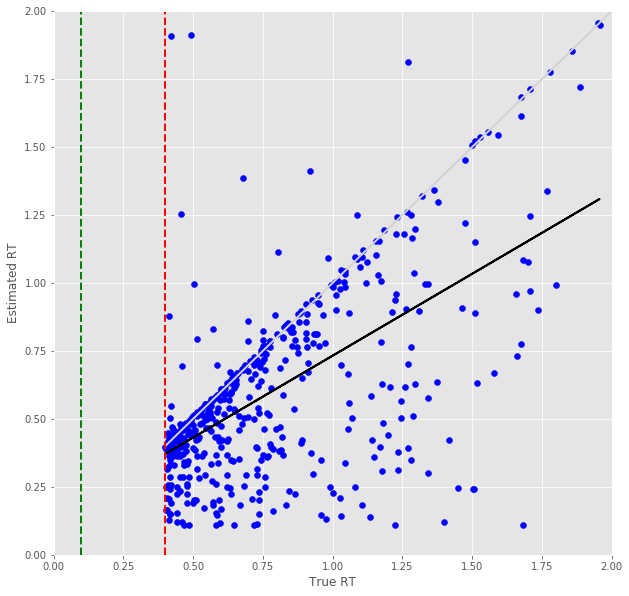

Error Prediction Score: 0.3749 RMSE
RT Prediction Score: 0.3652 RMSE
Error Prediction Corr: 0.7517
RT Prediction Corr: 0.5209
R^2 score for regression on Error: 0.5650
k = 0.6578


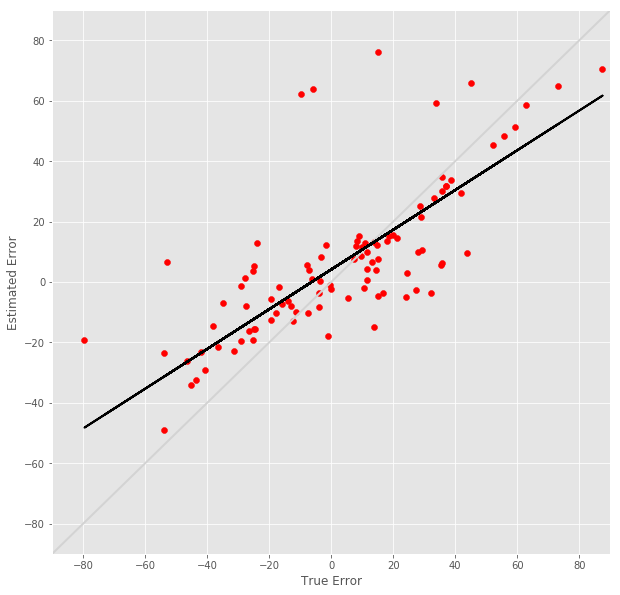

R^2 score for regression on RT: 0.2714
k = 0.5883


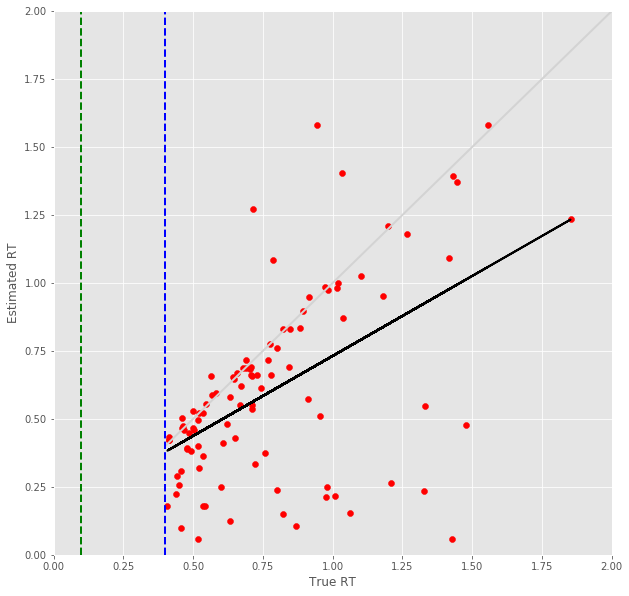

12 -step(s) forecast:
Test Score for 12 -steps forecast: 0.2724 RMSE
Predict Score for 12 -steps forecast: 0.2674 RMSE
Error Test Score for 12 -steps forecast: 0.3969 RMSE
RT Test Score for 12 -steps forecast: 0.3758 RMSE
Error Test Corr for 12 -steps forecast: 0.7721
RT Test Corr for 12 -steps forecast: 0.5803


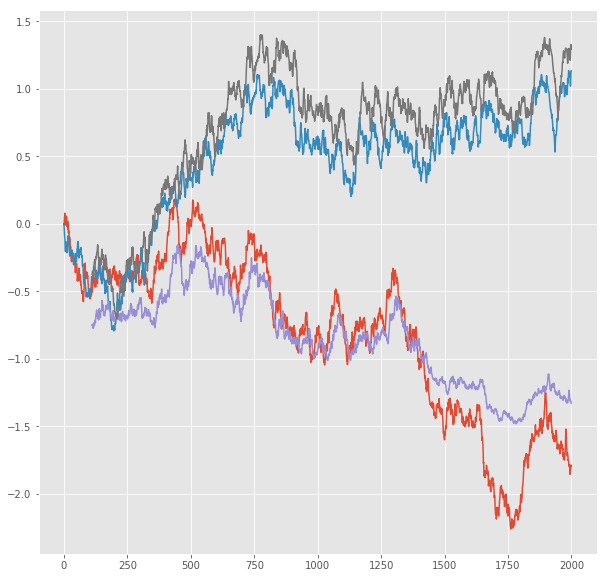

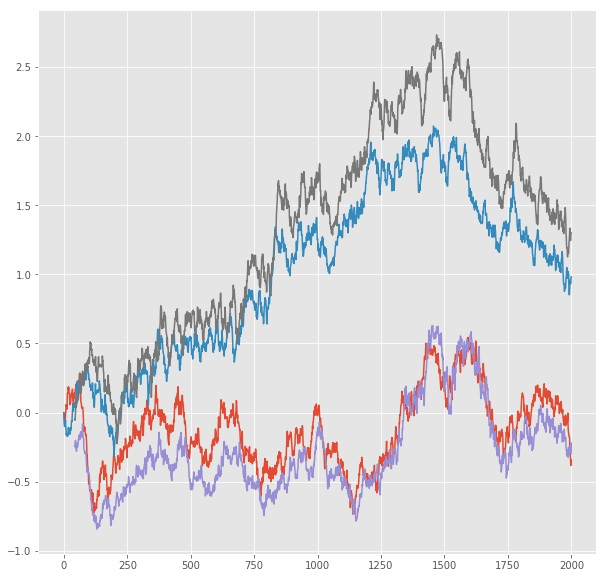

R^2 score for regression on Error: 0.5962
k = 0.6876


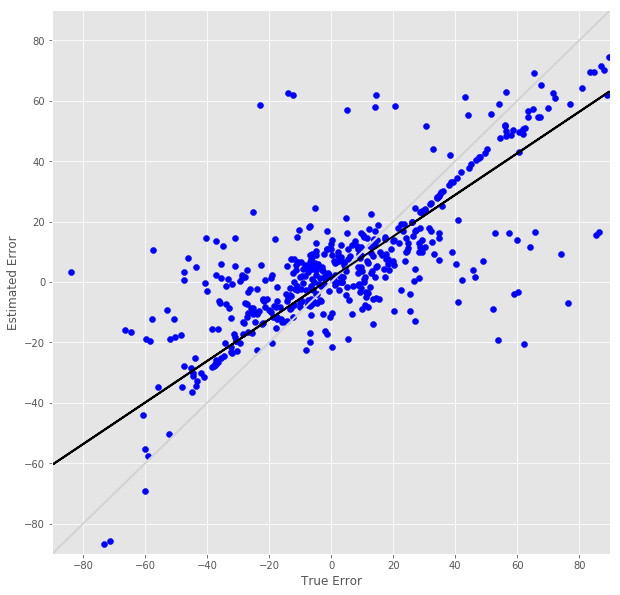

R^2 score for regression on RT: 0.3367
k = 0.5787


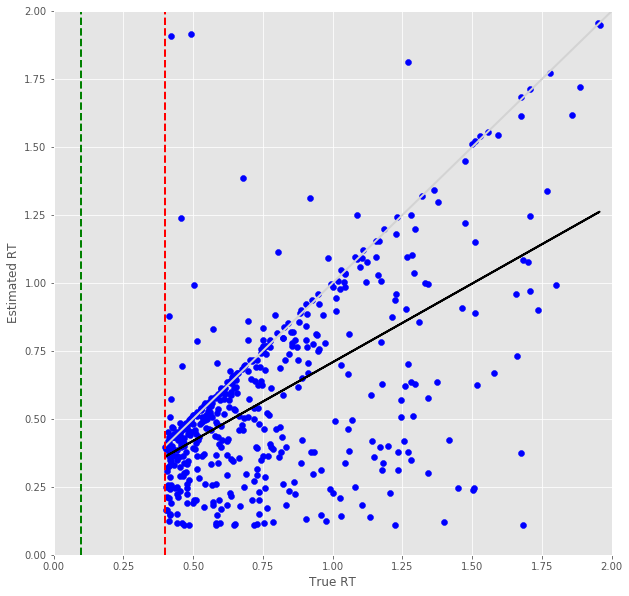

Error Prediction Score: 0.3493 RMSE
RT Prediction Score: 0.3869 RMSE
Error Prediction Corr: 0.7854
RT Prediction Corr: 0.4511
R^2 score for regression on Error: 0.6168
k = 0.7066


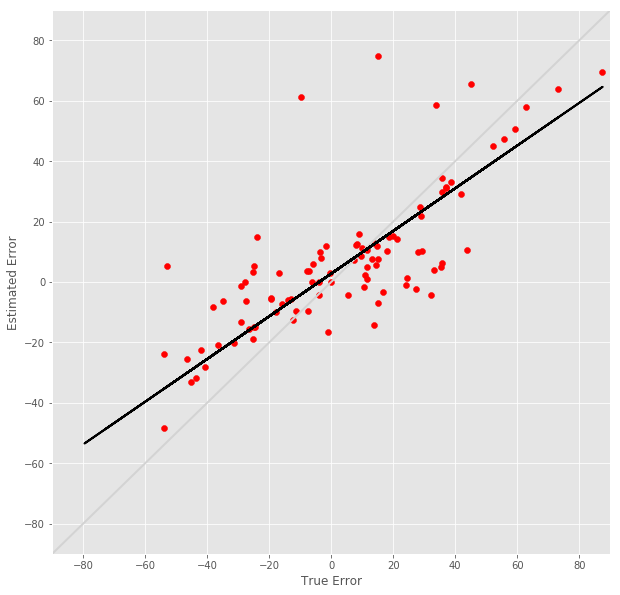

R^2 score for regression on RT: 0.2035
k = 0.4792


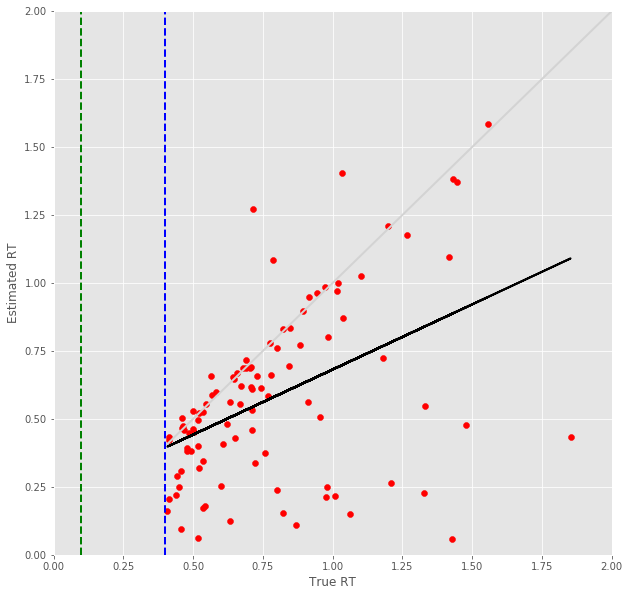

13 -step(s) forecast:
Test Score for 13 -steps forecast: 0.2922 RMSE
Predict Score for 13 -steps forecast: 0.2867 RMSE
Error Test Score for 13 -steps forecast: 0.4190 RMSE
RT Test Score for 13 -steps forecast: 0.4033 RMSE
Error Test Corr for 13 -steps forecast: 0.7464
RT Test Corr for 13 -steps forecast: 0.5323


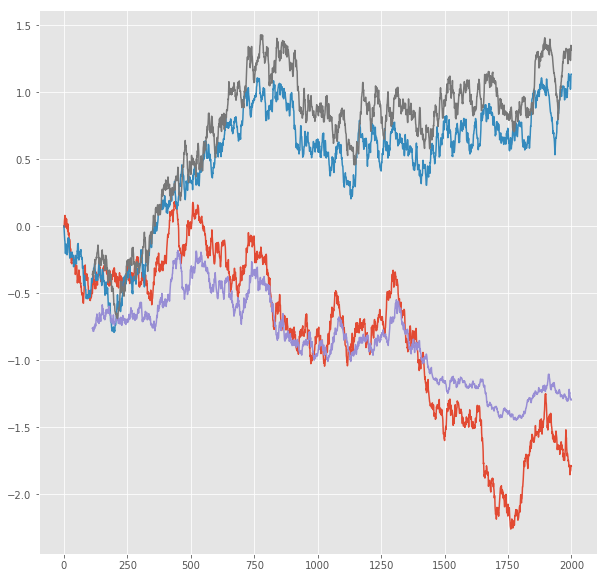

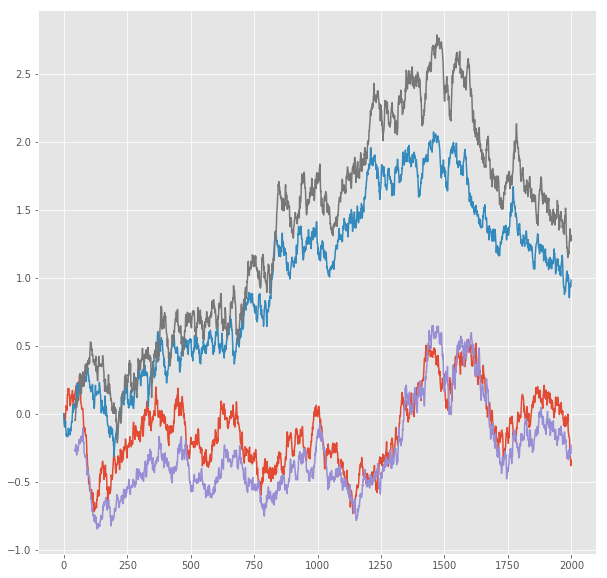

R^2 score for regression on Error: 0.5572
k = 0.6675


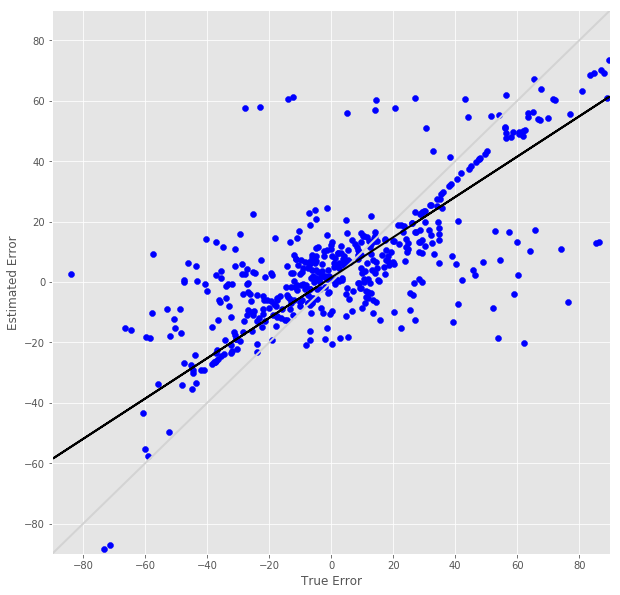

R^2 score for regression on RT: 0.2834
k = 0.5353


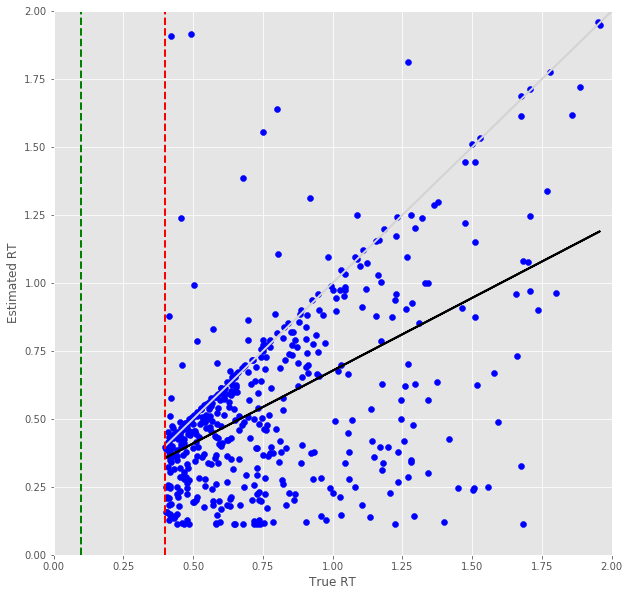

Error Prediction Score: 0.3819 RMSE
RT Prediction Score: 0.4160 RMSE
Error Prediction Corr: 0.7486
RT Prediction Corr: 0.3652
R^2 score for regression on Error: 0.5603
k = 0.6746


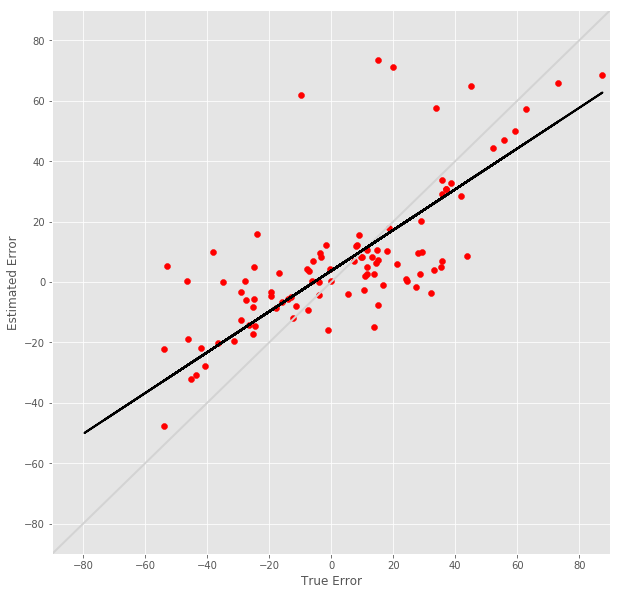

R^2 score for regression on RT: 0.1334
k = 0.3705


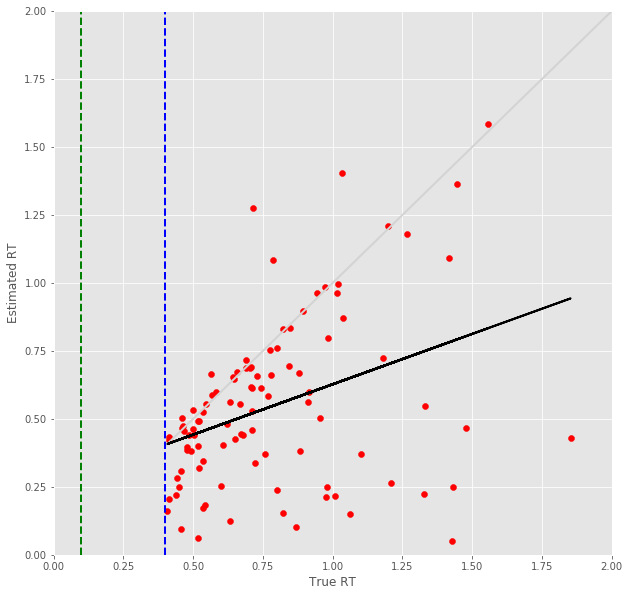

14 -step(s) forecast:
Test Score for 14 -steps forecast: 0.3117 RMSE
Predict Score for 14 -steps forecast: 0.3058 RMSE
Error Test Score for 14 -steps forecast: 0.4374 RMSE
RT Test Score for 14 -steps forecast: 0.4146 RMSE
Error Test Corr for 14 -steps forecast: 0.7251
RT Test Corr for 14 -steps forecast: 0.5131


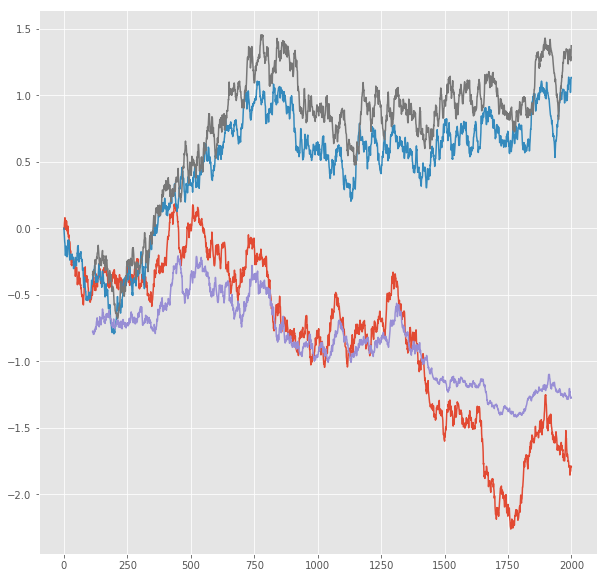

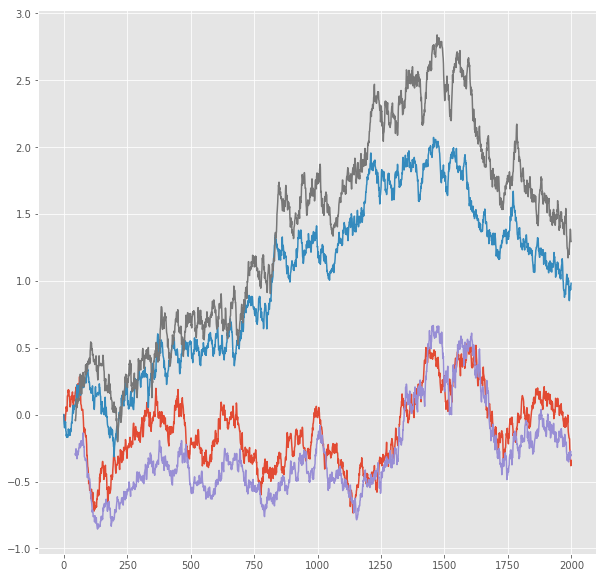

R^2 score for regression on Error: 0.5258
k = 0.6551


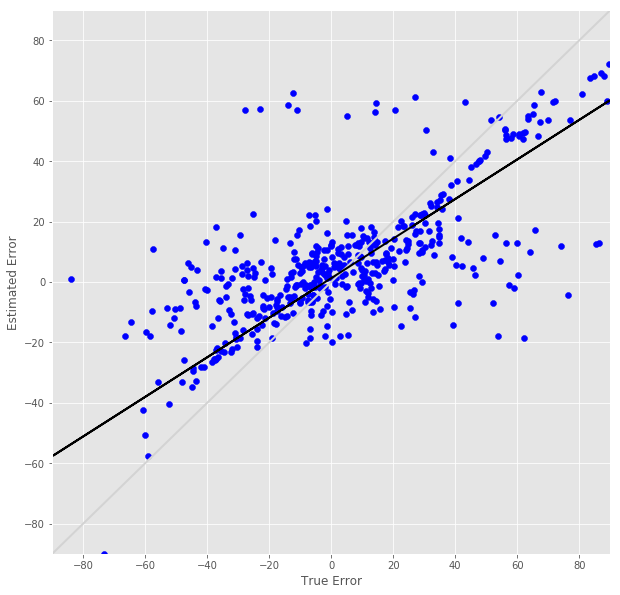

R^2 score for regression on RT: 0.2632
k = 0.5018


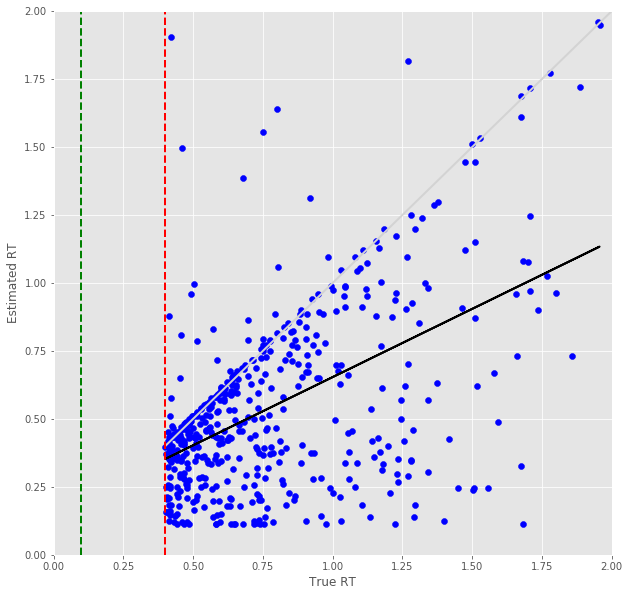

Error Prediction Score: 0.3842 RMSE
RT Prediction Score: 0.4228 RMSE
Error Prediction Corr: 0.7424
RT Prediction Corr: 0.3675
R^2 score for regression on Error: 0.5511
k = 0.6593


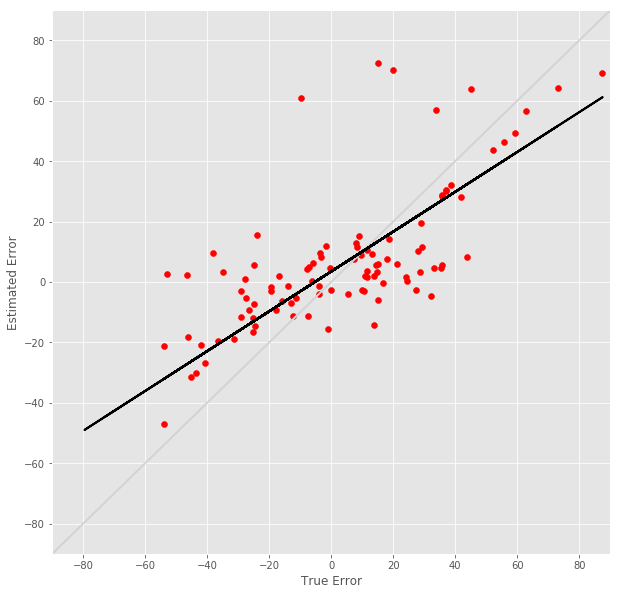

R^2 score for regression on RT: 0.1350
k = 0.3758


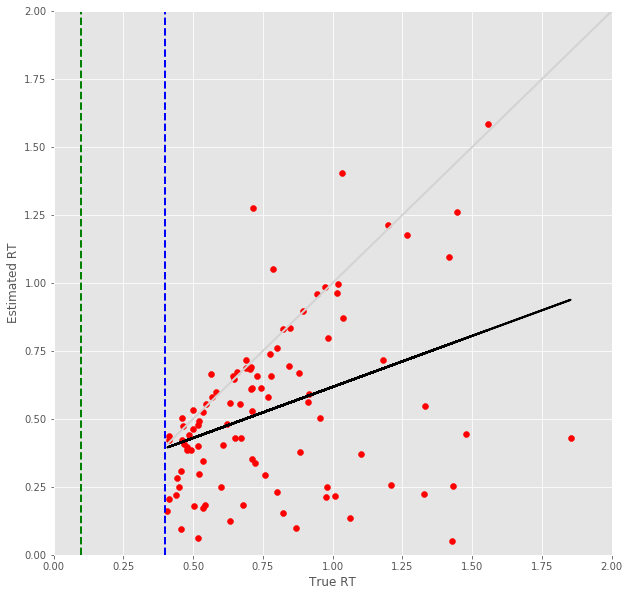

15 -step(s) forecast:
Test Score for 15 -steps forecast: 0.3312 RMSE
Predict Score for 15 -steps forecast: 0.3247 RMSE
Error Test Score for 15 -steps forecast: 0.4554 RMSE
RT Test Score for 15 -steps forecast: 0.4336 RMSE
Error Test Corr for 15 -steps forecast: 0.7096
RT Test Corr for 15 -steps forecast: 0.4774


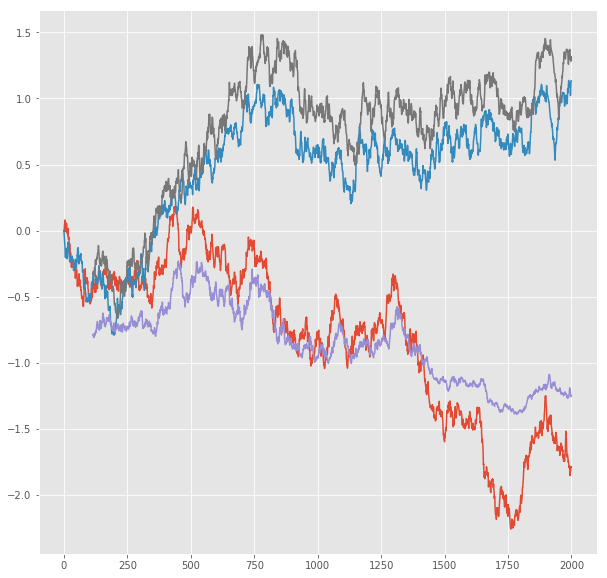

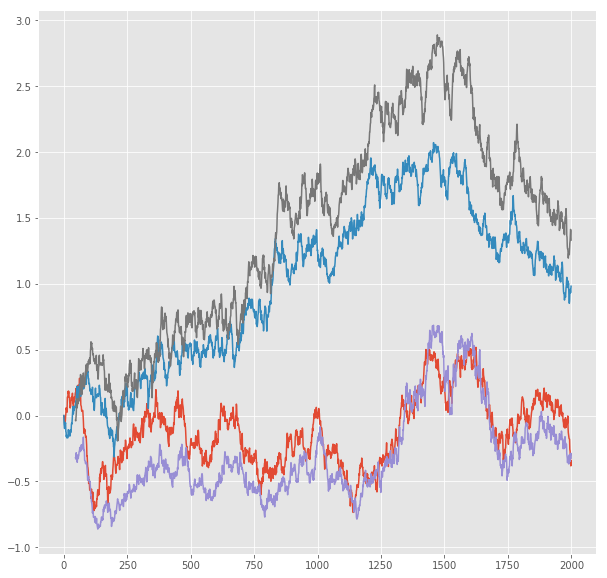

R^2 score for regression on Error: 0.5035
k = 0.6627


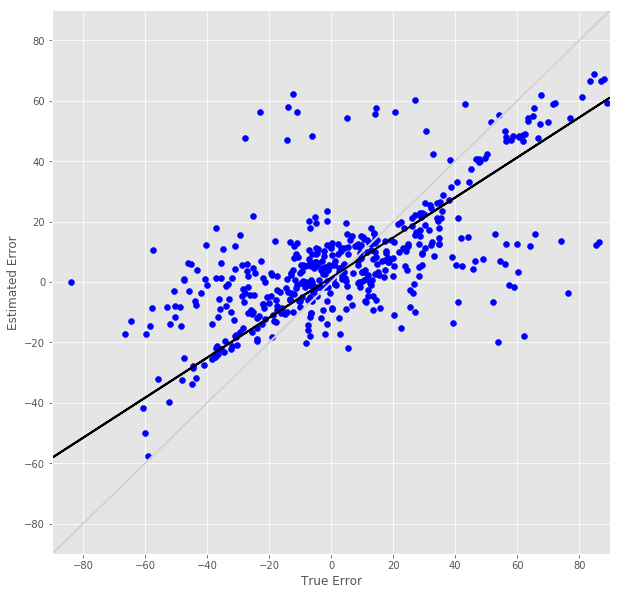

R^2 score for regression on RT: 0.2280
k = 0.4555


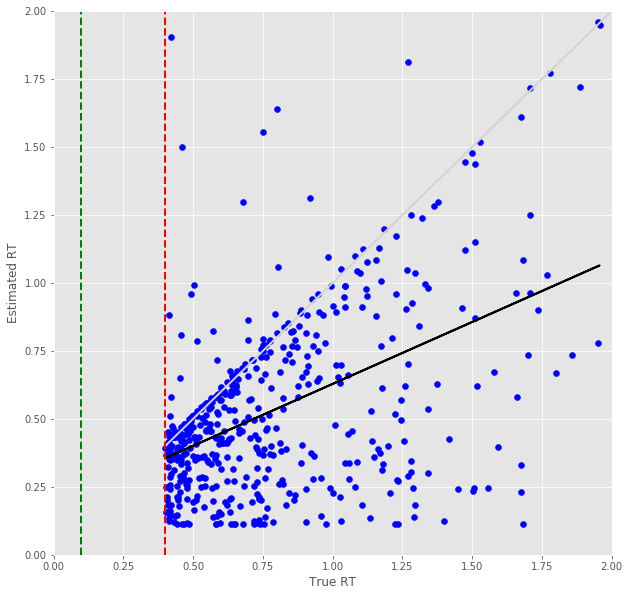

Error Prediction Score: 0.4029 RMSE
RT Prediction Score: 0.4300 RMSE
Error Prediction Corr: 0.7215
RT Prediction Corr: 0.3539
R^2 score for regression on Error: 0.5205
k = 0.6475


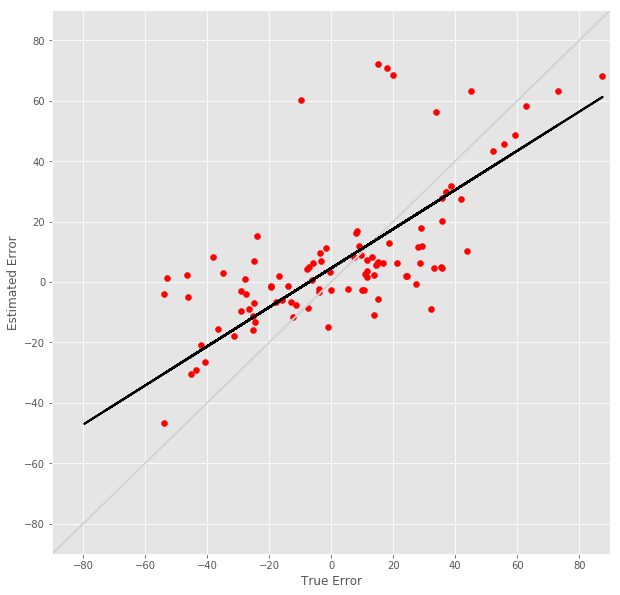

R^2 score for regression on RT: 0.1252
k = 0.3448


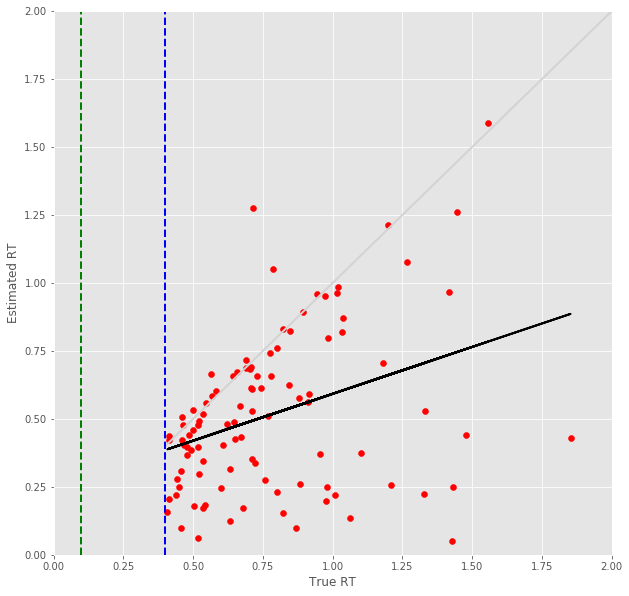

16 -step(s) forecast:
Test Score for 16 -steps forecast: 0.3505 RMSE
Predict Score for 16 -steps forecast: 0.3435 RMSE
Error Test Score for 16 -steps forecast: 0.4635 RMSE
RT Test Score for 16 -steps forecast: 0.4579 RMSE
Error Test Corr for 16 -steps forecast: 0.6989
RT Test Corr for 16 -steps forecast: 0.4291


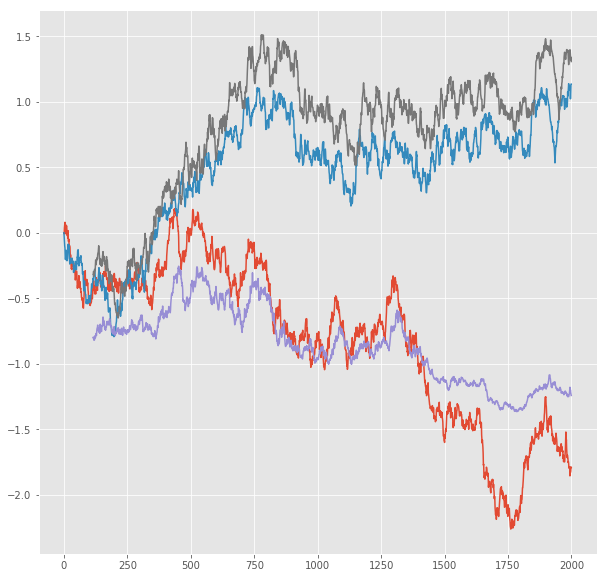

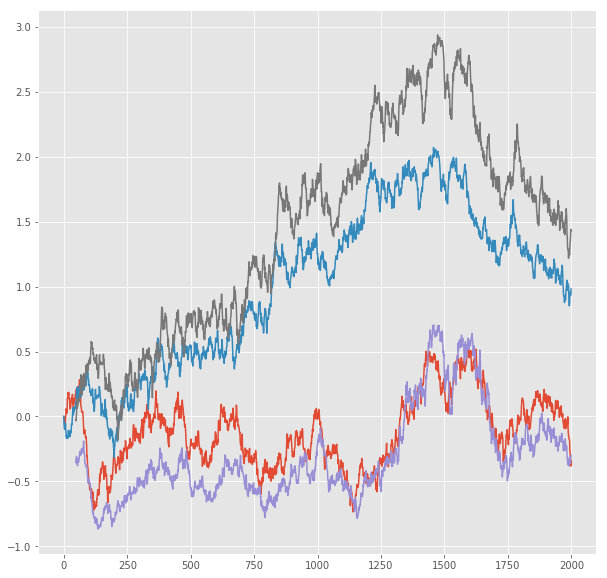

R^2 score for regression on Error: 0.4884
k = 0.6520


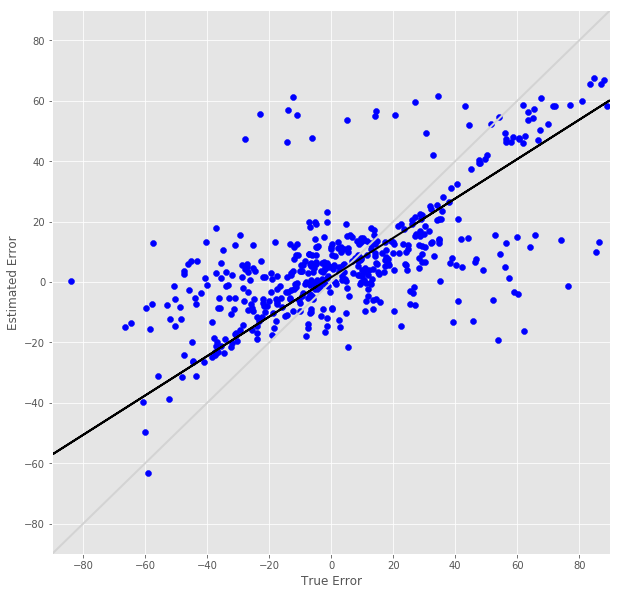

R^2 score for regression on RT: 0.1842
k = 0.4082


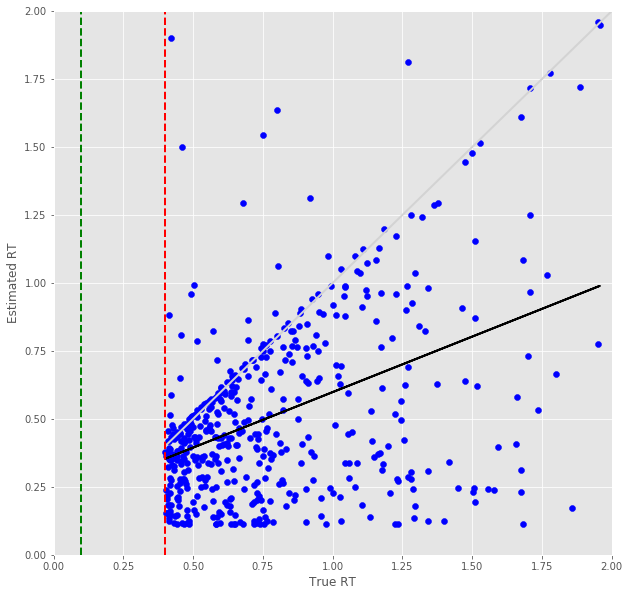

Error Prediction Score: 0.4132 RMSE
RT Prediction Score: 0.4531 RMSE
Error Prediction Corr: 0.7023
RT Prediction Corr: 0.2628
R^2 score for regression on Error: 0.4933
k = 0.6171


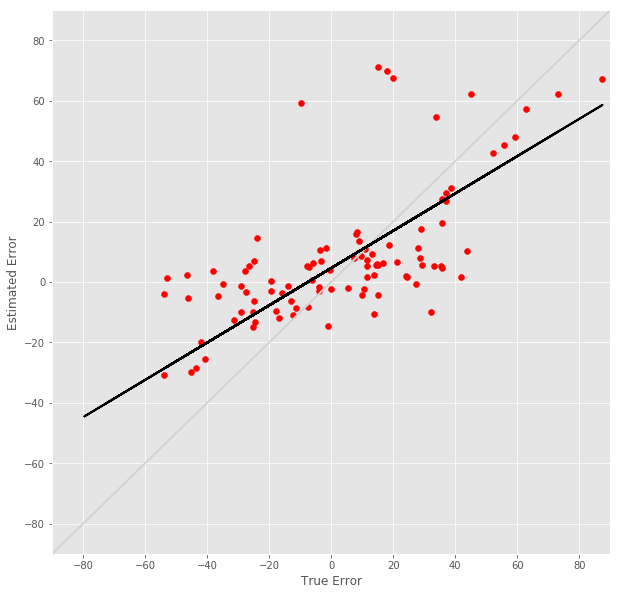

R^2 score for regression on RT: 0.0691
k = 0.2405


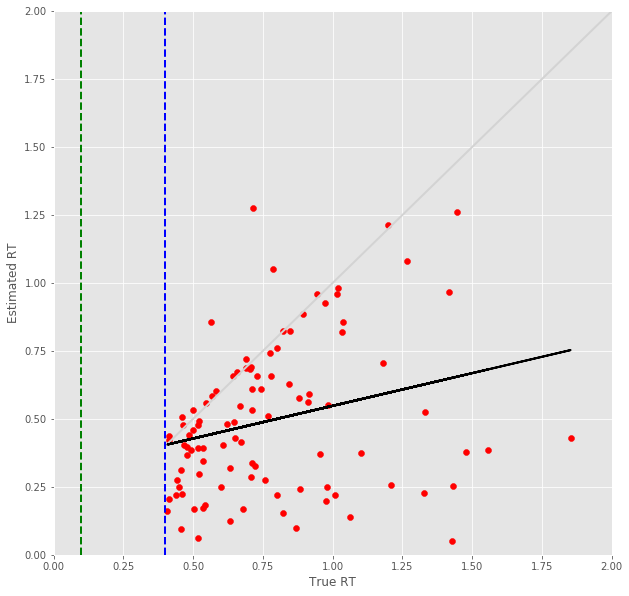

17 -step(s) forecast:
Test Score for 17 -steps forecast: 0.3697 RMSE
Predict Score for 17 -steps forecast: 0.3622 RMSE
Error Test Score for 17 -steps forecast: 0.4722 RMSE
RT Test Score for 17 -steps forecast: 0.4784 RMSE
Error Test Corr for 17 -steps forecast: 0.6757
RT Test Corr for 17 -steps forecast: 0.3761


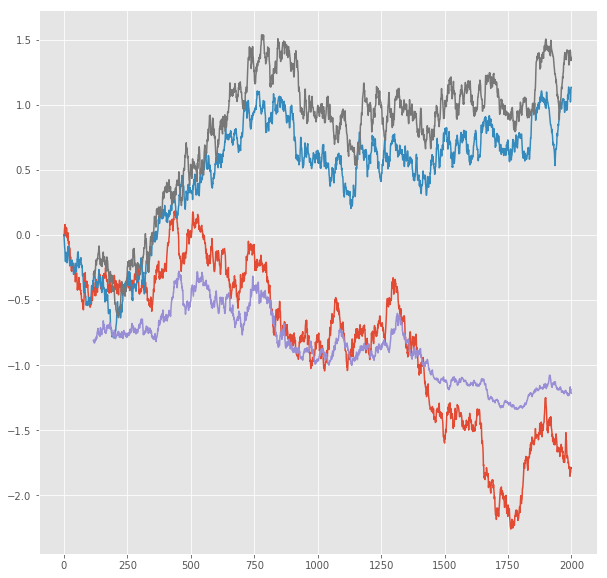

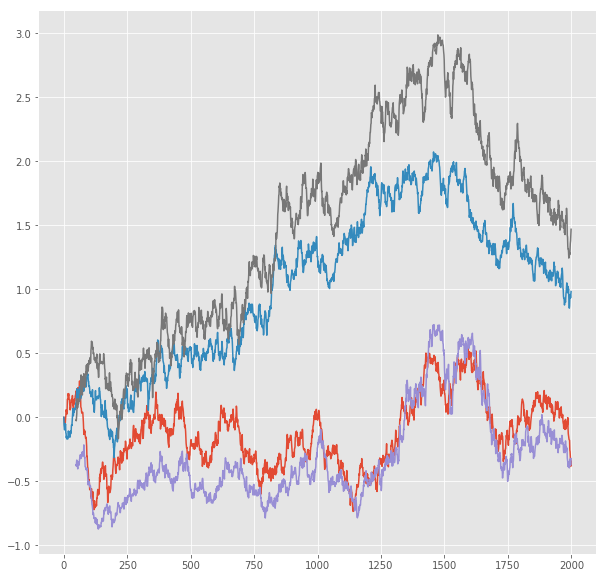

R^2 score for regression on Error: 0.4566
k = 0.5998


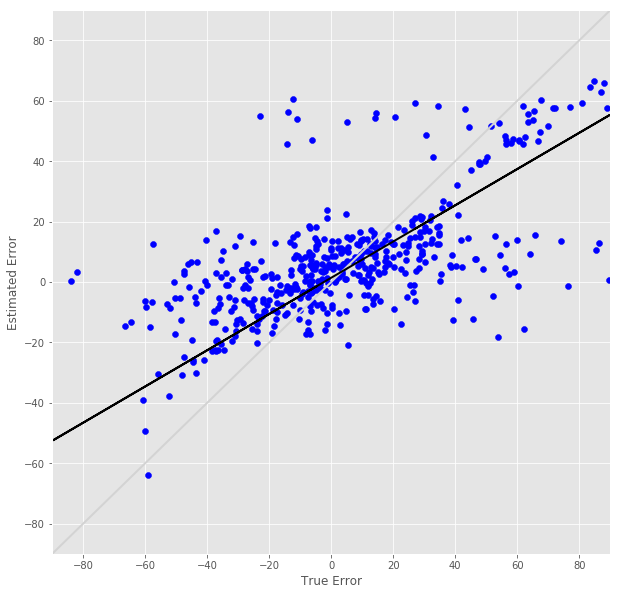

R^2 score for regression on RT: 0.1414
k = 0.3415


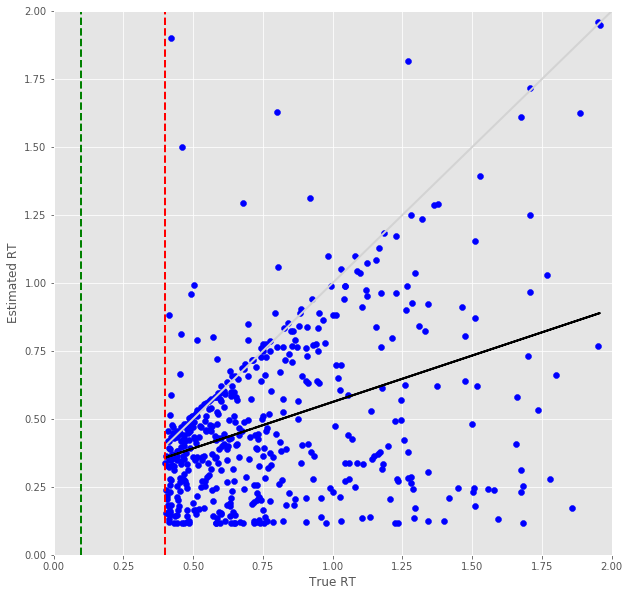

Error Prediction Score: 0.4148 RMSE
RT Prediction Score: 0.4618 RMSE
Error Prediction Corr: 0.6976
RT Prediction Corr: 0.2575
R^2 score for regression on Error: 0.4867
k = 0.6030


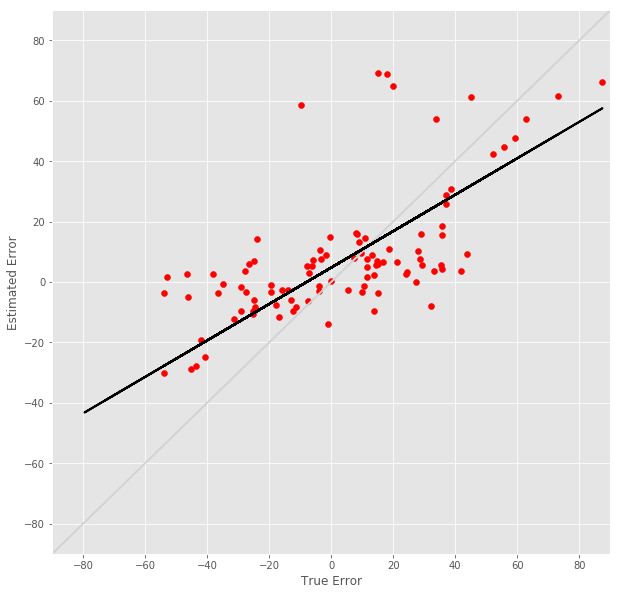

R^2 score for regression on RT: 0.0663
k = 0.2383


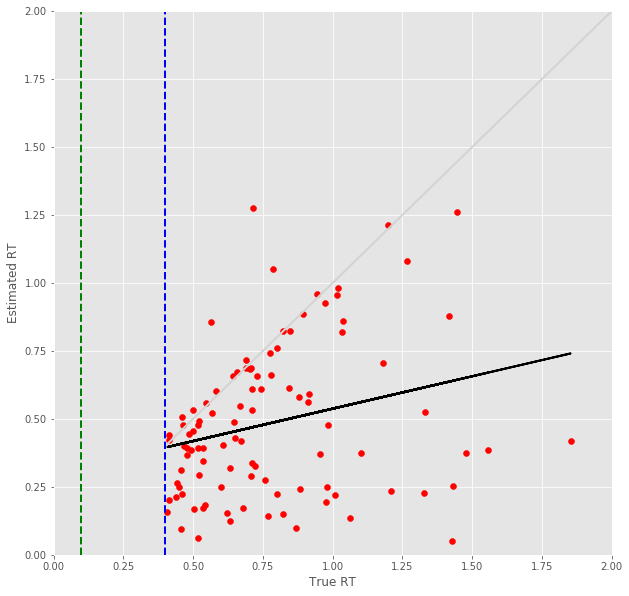

18 -step(s) forecast:
Test Score for 18 -steps forecast: 0.3887 RMSE
Predict Score for 18 -steps forecast: 0.3808 RMSE
Error Test Score for 18 -steps forecast: 0.4769 RMSE
RT Test Score for 18 -steps forecast: 0.4890 RMSE
Error Test Corr for 18 -steps forecast: 0.6651
RT Test Corr for 18 -steps forecast: 0.3624


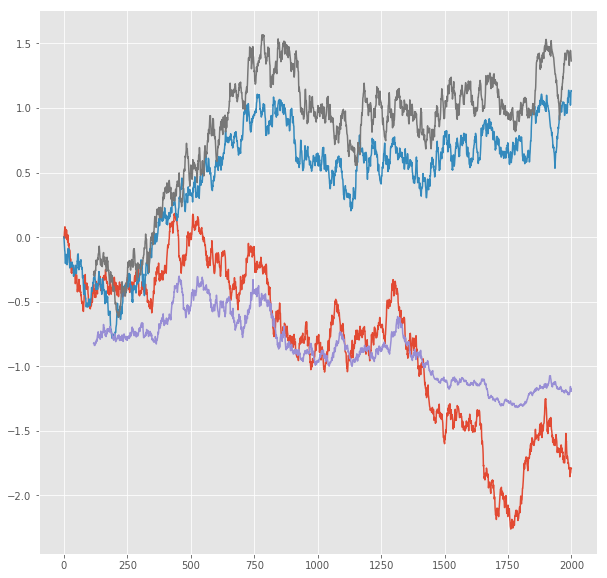

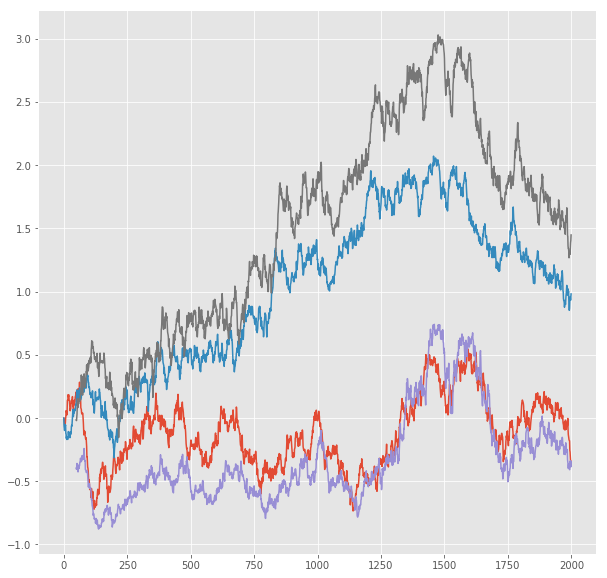

R^2 score for regression on Error: 0.4424
k = 0.5796


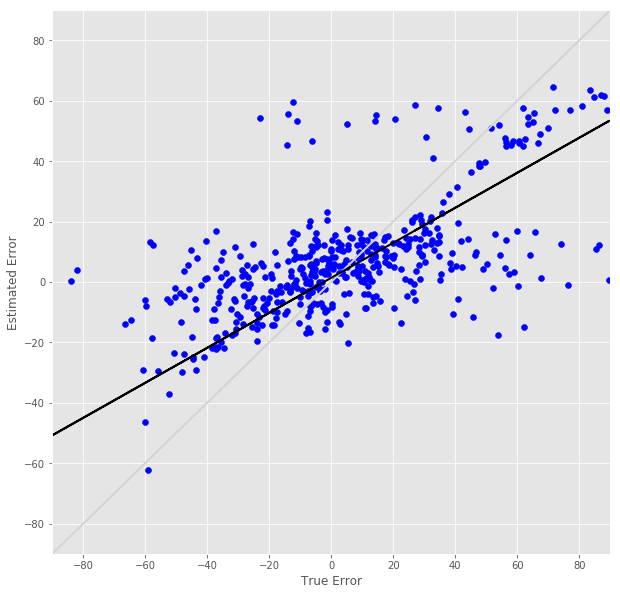

R^2 score for regression on RT: 0.1313
k = 0.3163


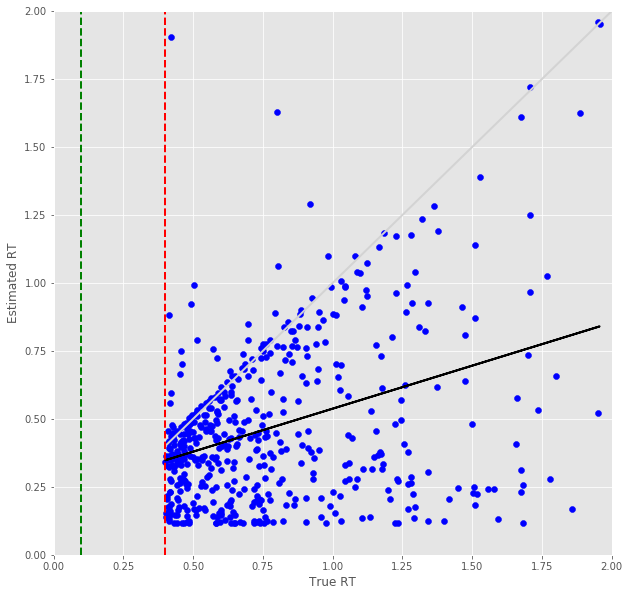

Error Prediction Score: 0.4198 RMSE
RT Prediction Score: 0.4760 RMSE
Error Prediction Corr: 0.6898
RT Prediction Corr: 0.2671
R^2 score for regression on Error: 0.4758
k = 0.5854


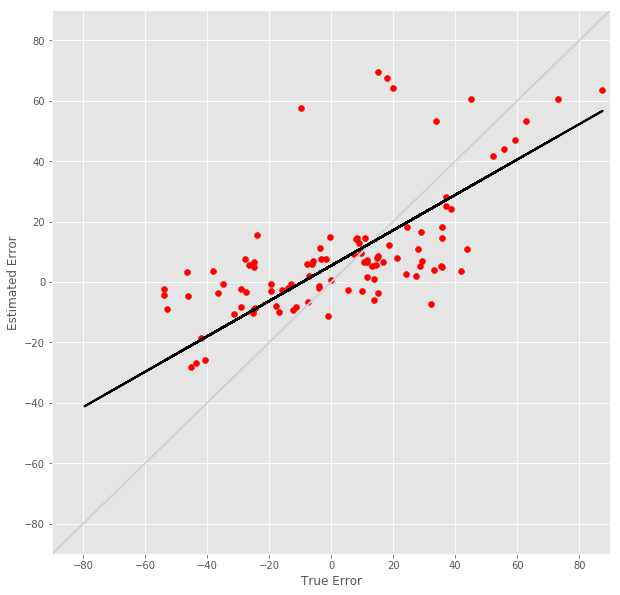

R^2 score for regression on RT: 0.0713
k = 0.2388


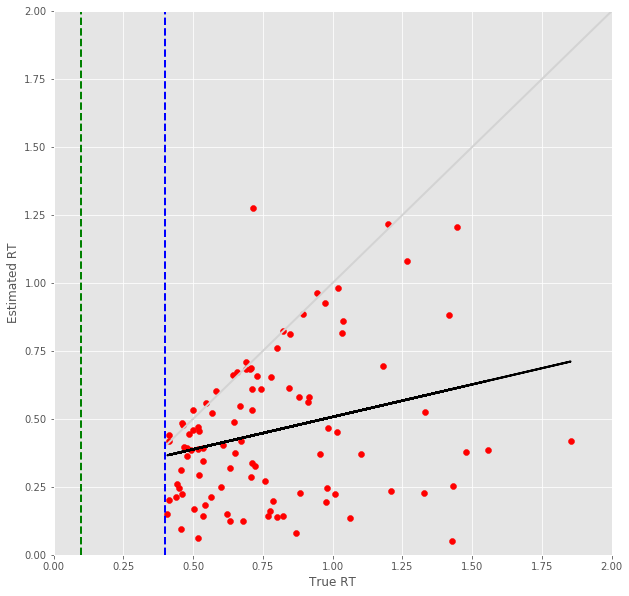

19 -step(s) forecast:
Test Score for 19 -steps forecast: 0.4077 RMSE
Predict Score for 19 -steps forecast: 0.3992 RMSE
Error Test Score for 19 -steps forecast: 0.4961 RMSE
RT Test Score for 19 -steps forecast: 0.5131 RMSE
Error Test Corr for 19 -steps forecast: 0.6492
RT Test Corr for 19 -steps forecast: 0.3006


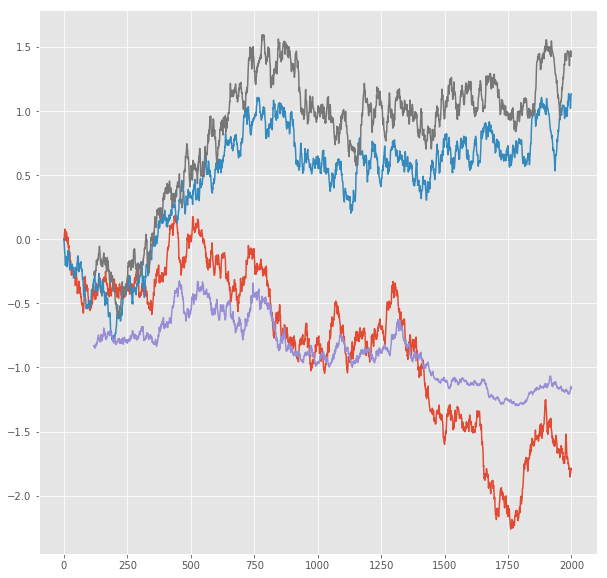

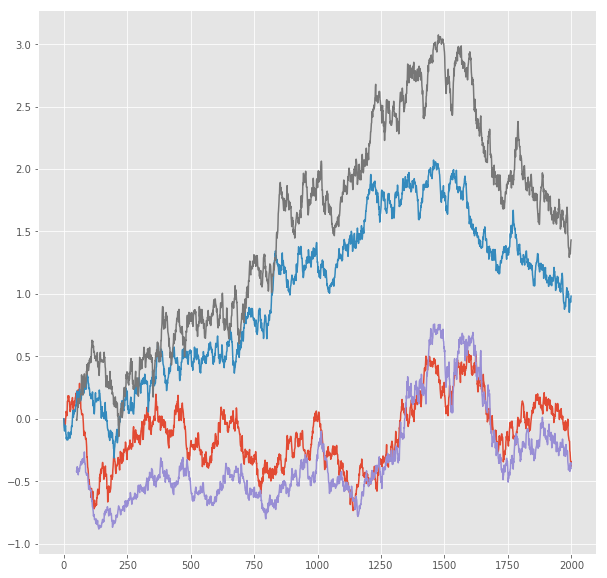

R^2 score for regression on Error: 0.4215
k = 0.5948


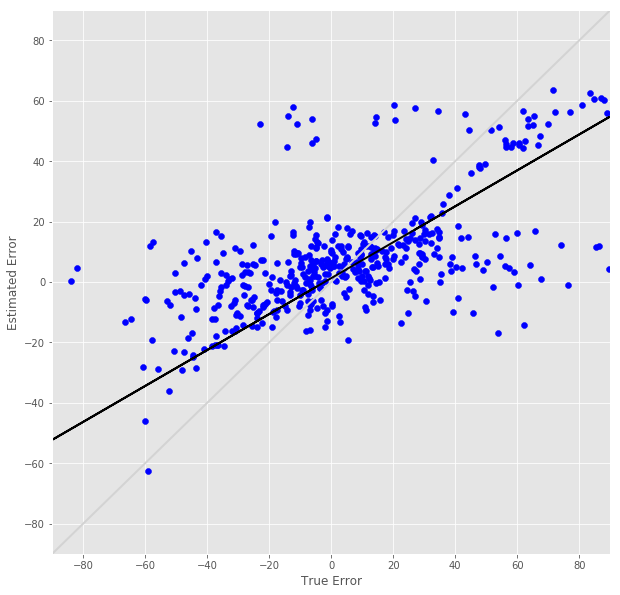

R^2 score for regression on RT: 0.0903
k = 0.2510


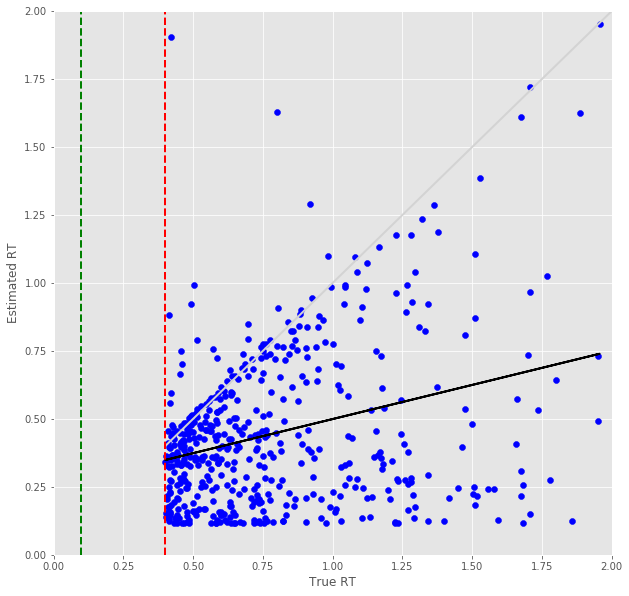

Error Prediction Score: 0.4197 RMSE
RT Prediction Score: 0.4833 RMSE
Error Prediction Corr: 0.6888
RT Prediction Corr: 0.2602
R^2 score for regression on Error: 0.4744
k = 0.5794


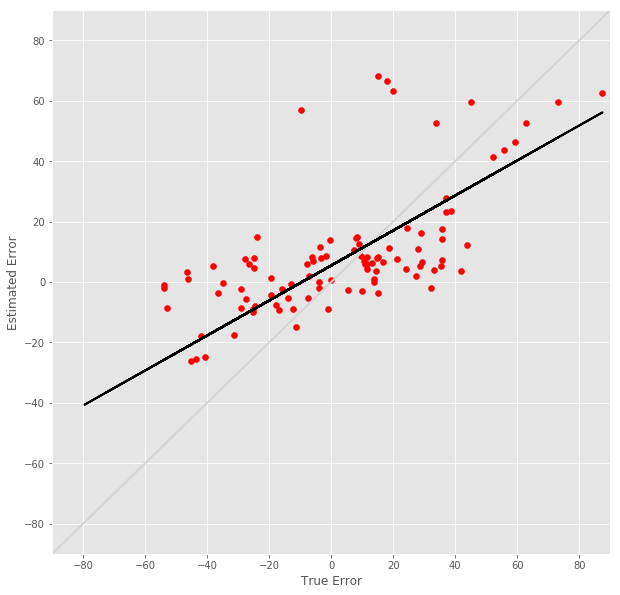

R^2 score for regression on RT: 0.0677
k = 0.2330


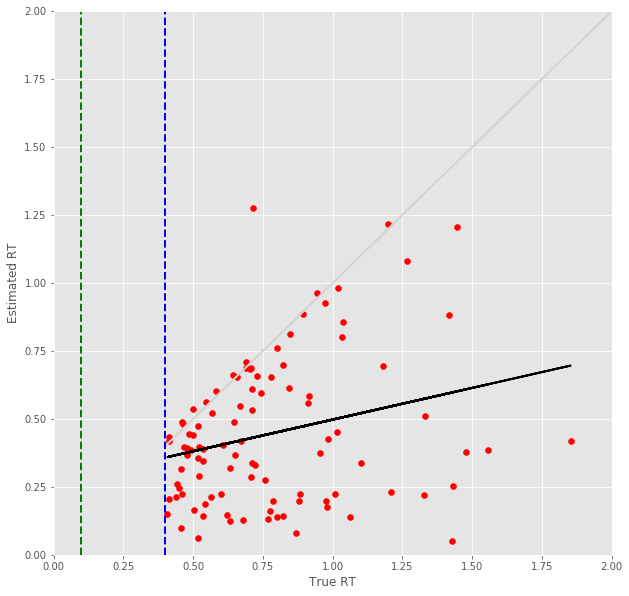

20 -step(s) forecast:
Test Score for 20 -steps forecast: 0.4265 RMSE
Predict Score for 20 -steps forecast: 0.4176 RMSE
Error Test Score for 20 -steps forecast: 0.5043 RMSE
RT Test Score for 20 -steps forecast: 0.5180 RMSE
Error Test Corr for 20 -steps forecast: 0.6368
RT Test Corr for 20 -steps forecast: 0.2999


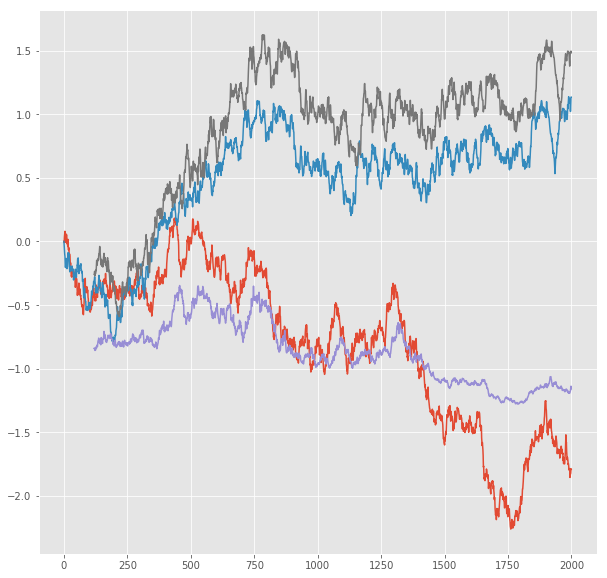

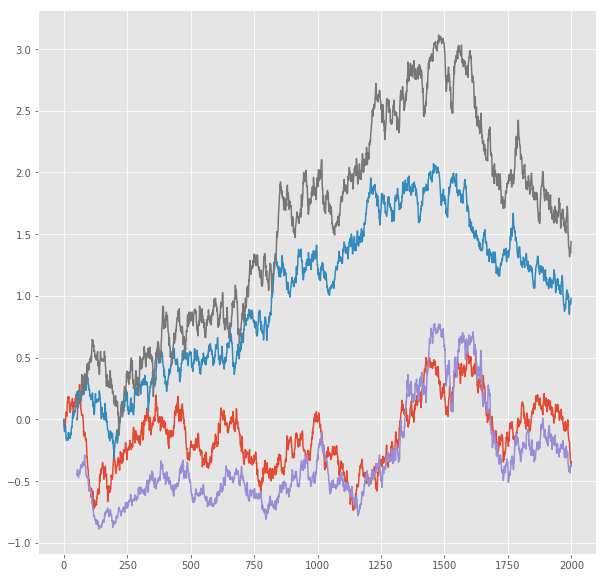

R^2 score for regression on Error: 0.4055
k = 0.5812


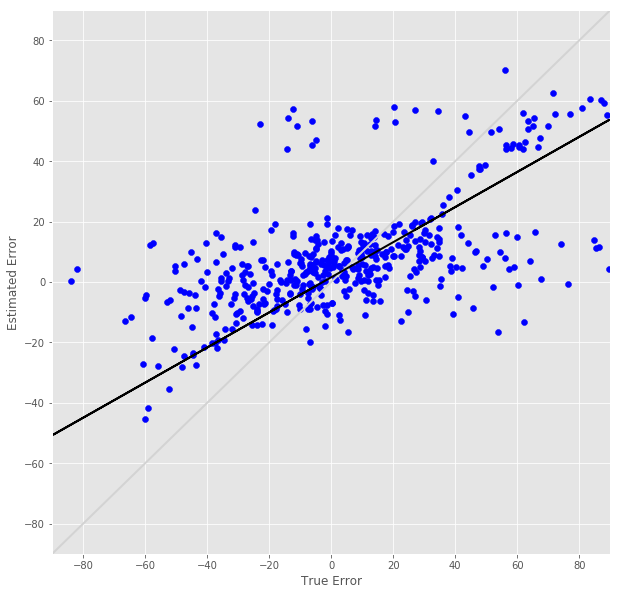

R^2 score for regression on RT: 0.0899
k = 0.2489


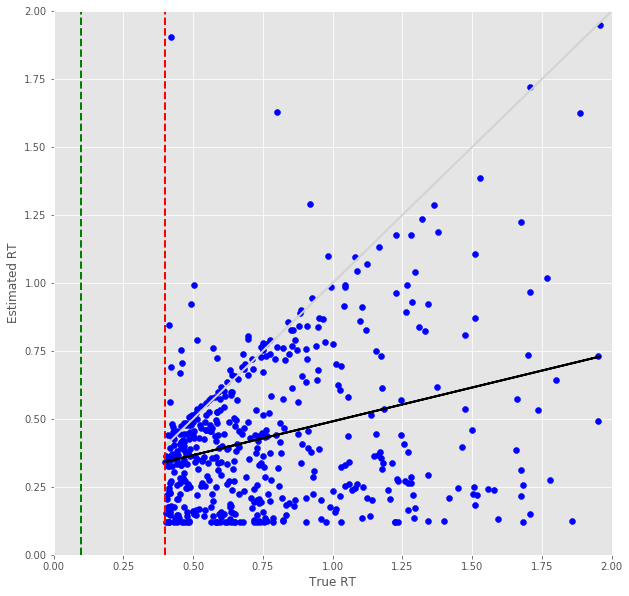

Error Prediction Score: 0.4352 RMSE
RT Prediction Score: 0.4982 RMSE
Error Prediction Corr: 0.6733
RT Prediction Corr: 0.2589
R^2 score for regression on Error: 0.4533
k = 0.5785


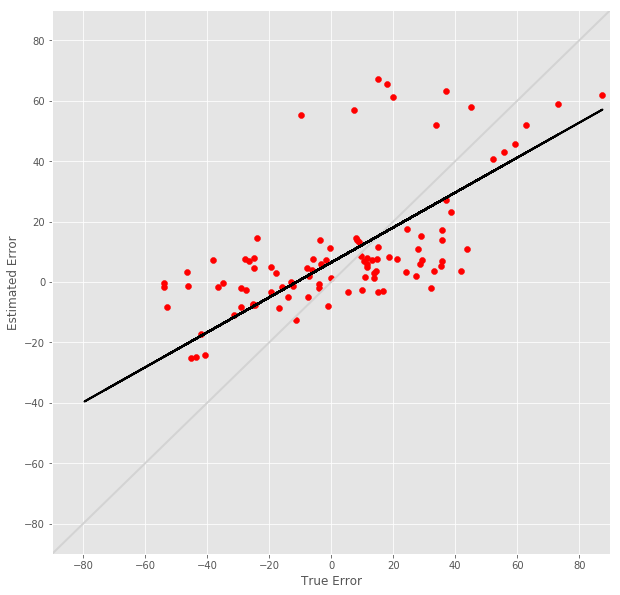

R^2 score for regression on RT: 0.0670
k = 0.2305


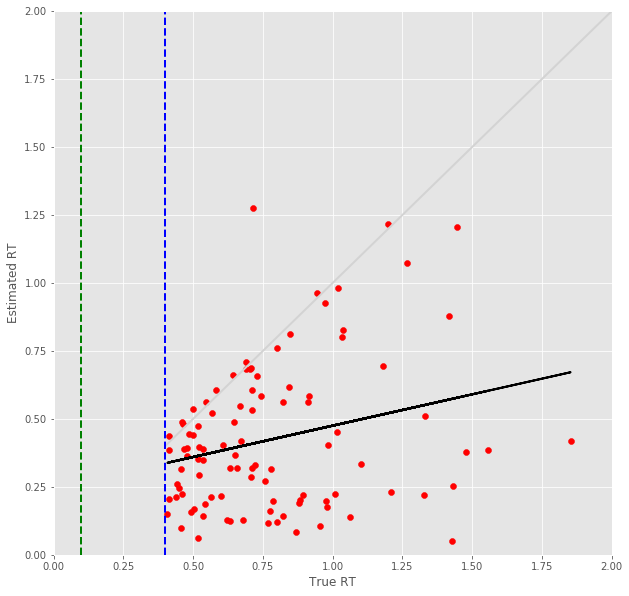

21 -step(s) forecast:
Test Score for 21 -steps forecast: 0.4453 RMSE
Predict Score for 21 -steps forecast: 0.4358 RMSE
Error Test Score for 21 -steps forecast: 0.5207 RMSE
RT Test Score for 21 -steps forecast: 0.5331 RMSE
Error Test Corr for 21 -steps forecast: 0.6254
RT Test Corr for 21 -steps forecast: 0.2848


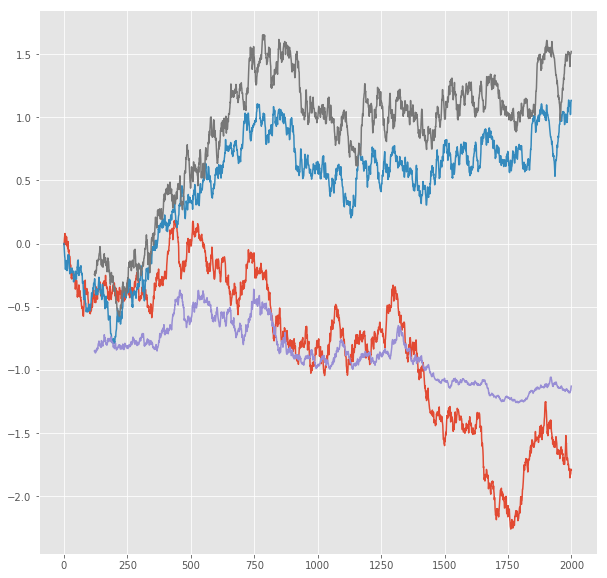

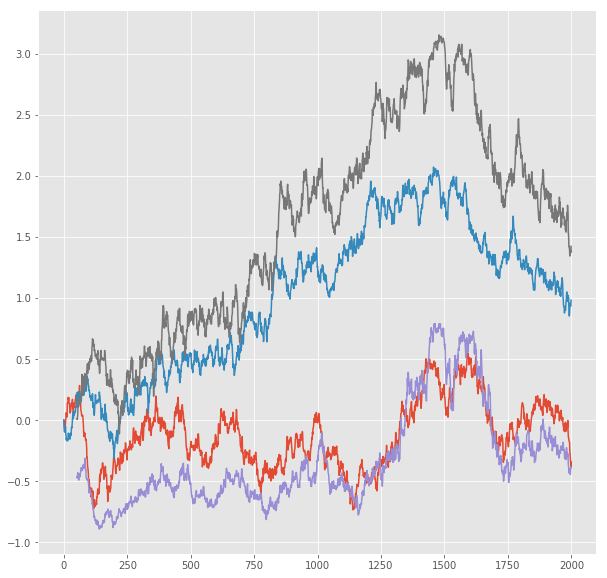

R^2 score for regression on Error: 0.3911
k = 0.5925


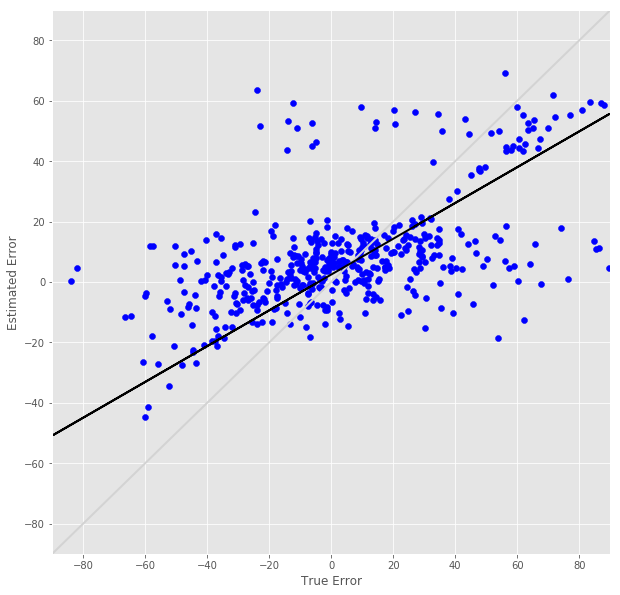

R^2 score for regression on RT: 0.0811
k = 0.2322


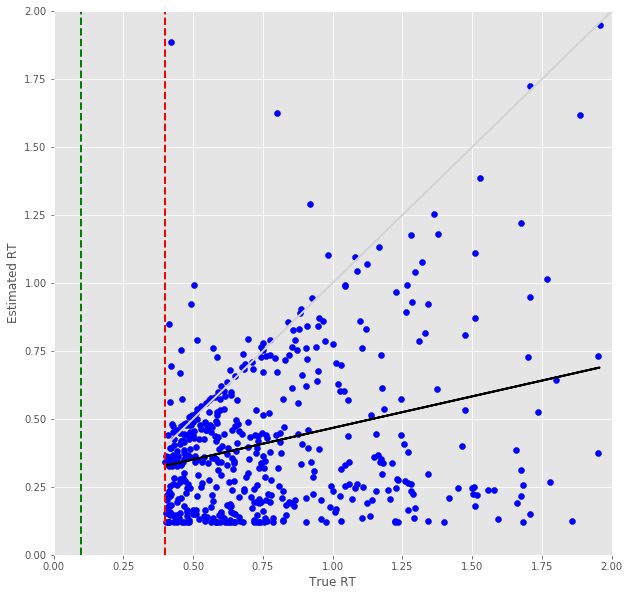

Error Prediction Score: 0.4643 RMSE
RT Prediction Score: 0.5063 RMSE
Error Prediction Corr: 0.6118
RT Prediction Corr: 0.2634
R^2 score for regression on Error: 0.3743
k = 0.4668


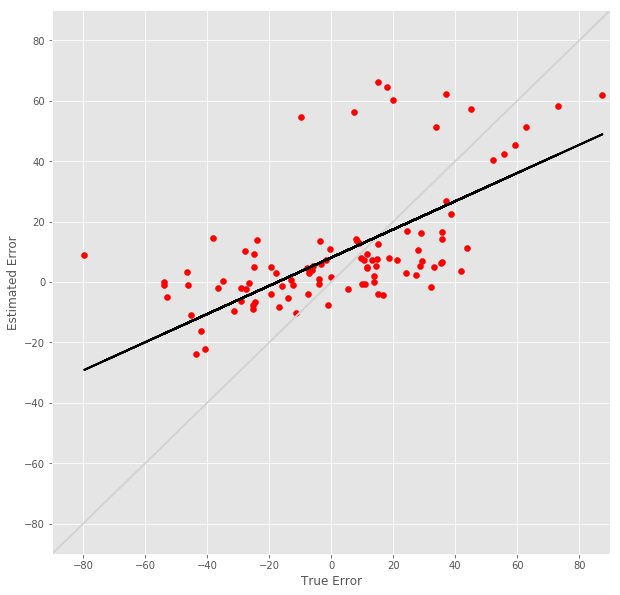

R^2 score for regression on RT: 0.0694
k = 0.2323


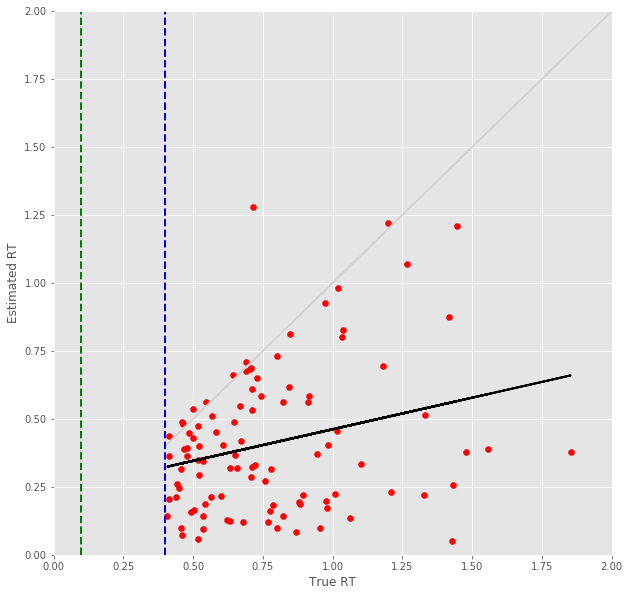

22 -step(s) forecast:
Test Score for 22 -steps forecast: 0.4639 RMSE
Predict Score for 22 -steps forecast: 0.4540 RMSE
Error Test Score for 22 -steps forecast: 0.5293 RMSE
RT Test Score for 22 -steps forecast: 0.5420 RMSE
Error Test Corr for 22 -steps forecast: 0.6094
RT Test Corr for 22 -steps forecast: 0.2720


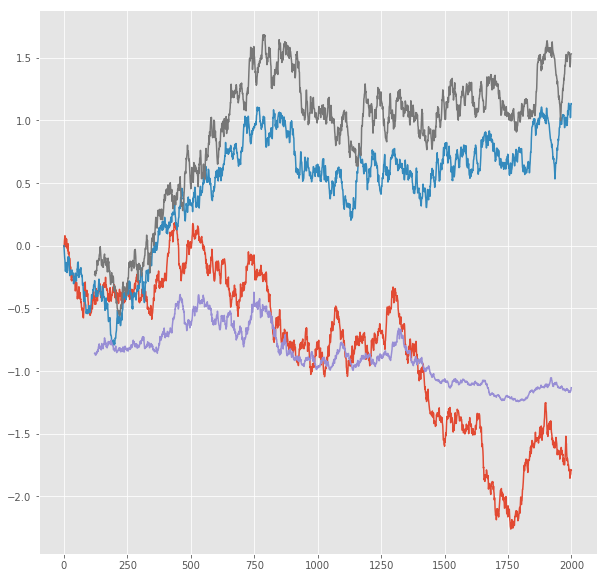

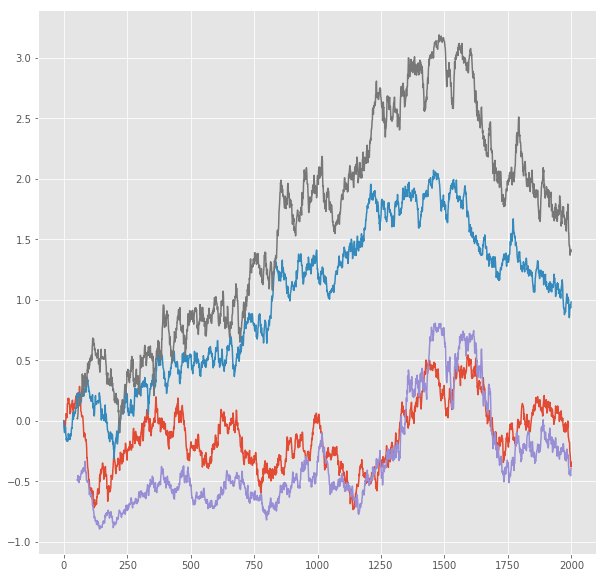

R^2 score for regression on Error: 0.3714
k = 0.5702


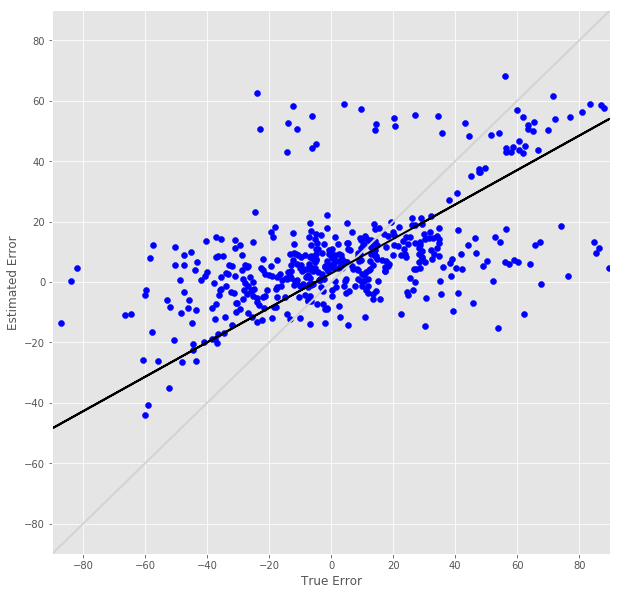

R^2 score for regression on RT: 0.0740
k = 0.2194


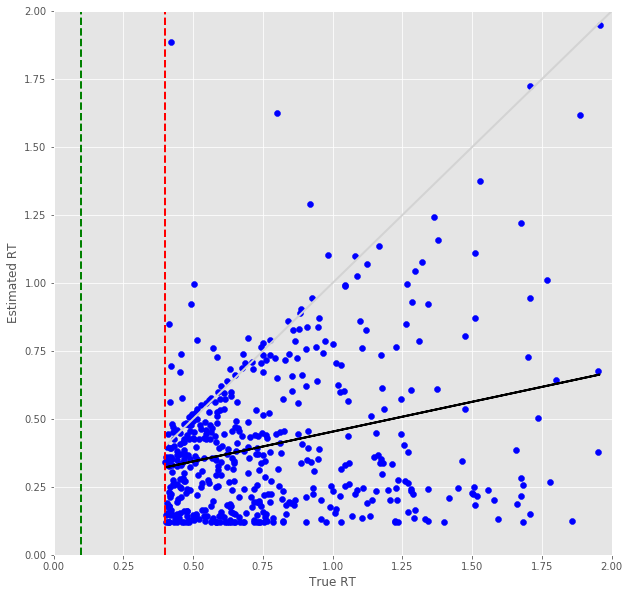

Error Prediction Score: 0.4792 RMSE
RT Prediction Score: 0.5126 RMSE
Error Prediction Corr: 0.5892
RT Prediction Corr: 0.2781
R^2 score for regression on Error: 0.3472
k = 0.4504


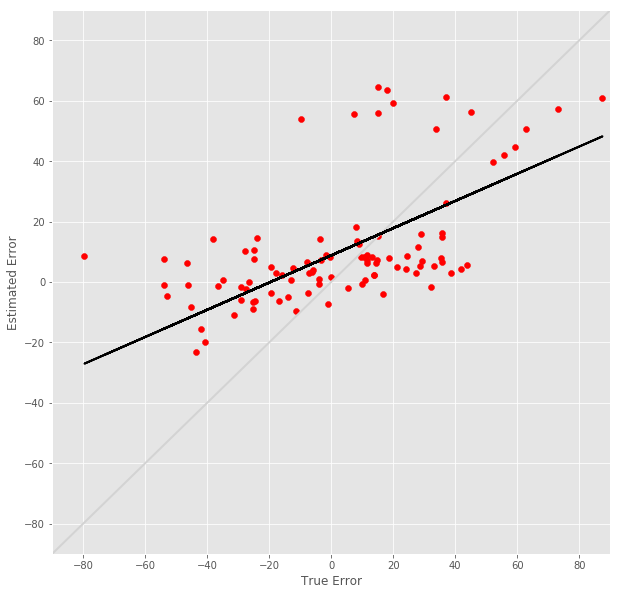

R^2 score for regression on RT: 0.0773
k = 0.2447


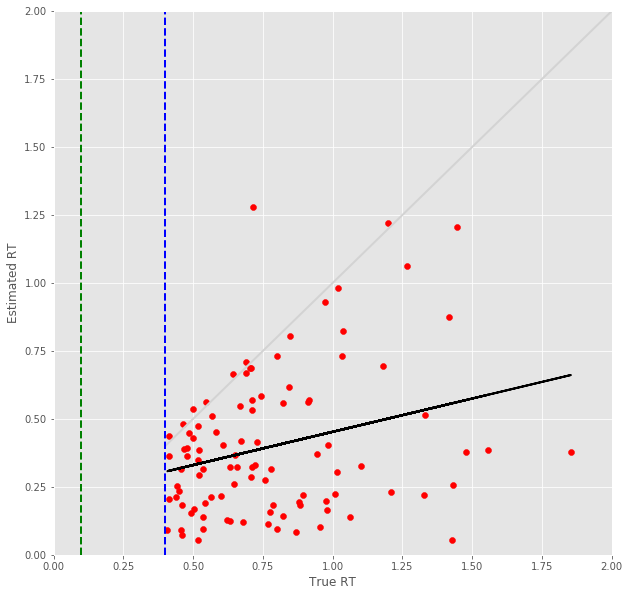

23 -step(s) forecast:
Test Score for 23 -steps forecast: 0.4825 RMSE
Predict Score for 23 -steps forecast: 0.4720 RMSE
Error Test Score for 23 -steps forecast: 0.5387 RMSE
RT Test Score for 23 -steps forecast: 0.5539 RMSE
Error Test Corr for 23 -steps forecast: 0.5875
RT Test Corr for 23 -steps forecast: 0.2472


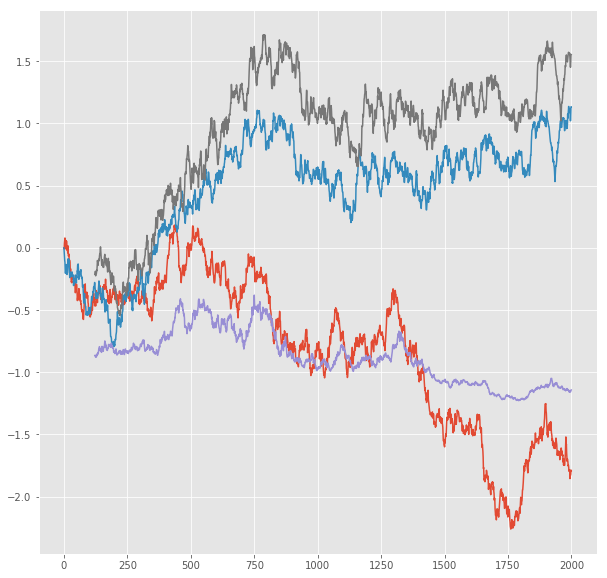

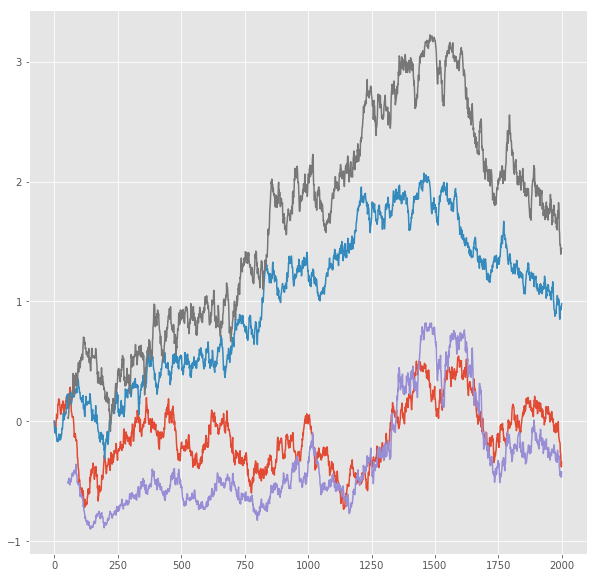

R^2 score for regression on Error: 0.3451
k = 0.5343


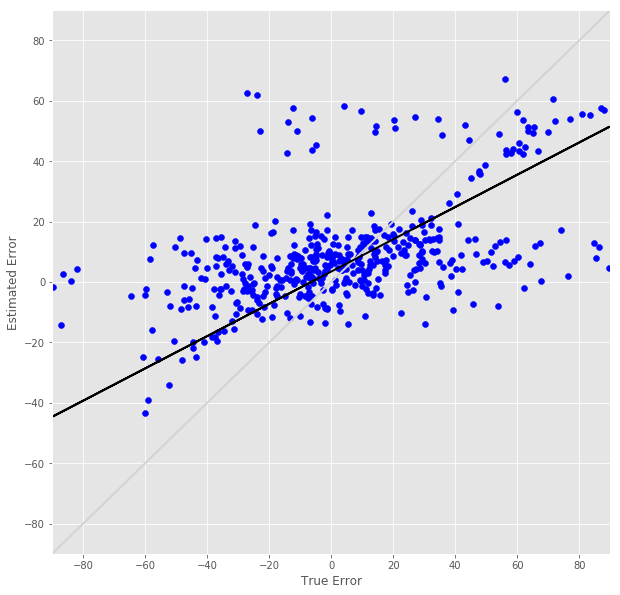

R^2 score for regression on RT: 0.0611
k = 0.1824


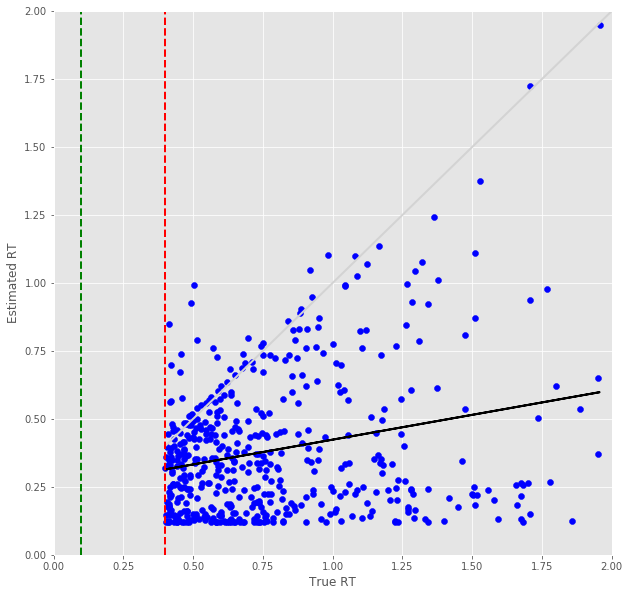

Error Prediction Score: 0.4806 RMSE
RT Prediction Score: 0.5170 RMSE
Error Prediction Corr: 0.5857
RT Prediction Corr: 0.2717
R^2 score for regression on Error: 0.3430
k = 0.4429


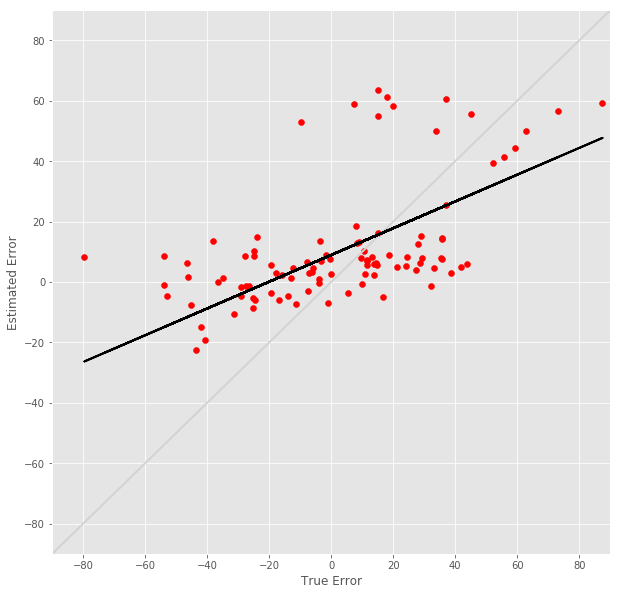

R^2 score for regression on RT: 0.0738
k = 0.2403


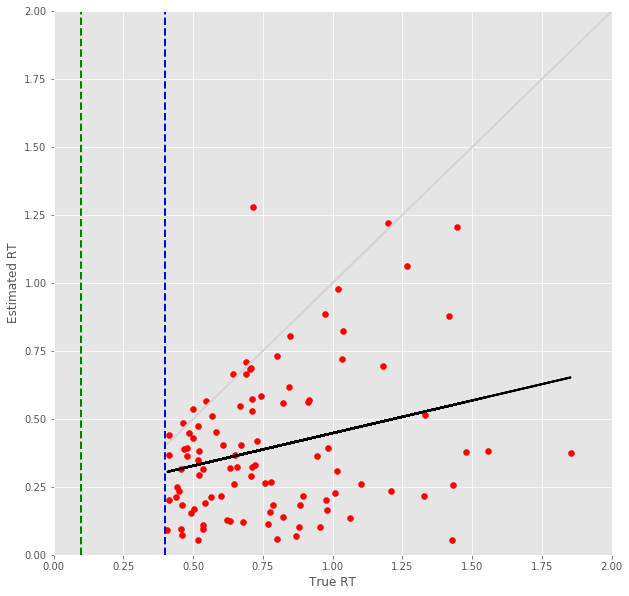

24 -step(s) forecast:
Test Score for 24 -steps forecast: 0.5010 RMSE
Predict Score for 24 -steps forecast: 0.4900 RMSE
Error Test Score for 24 -steps forecast: 0.5472 RMSE
RT Test Score for 24 -steps forecast: 0.5608 RMSE
Error Test Corr for 24 -steps forecast: 0.5686
RT Test Corr for 24 -steps forecast: 0.2481


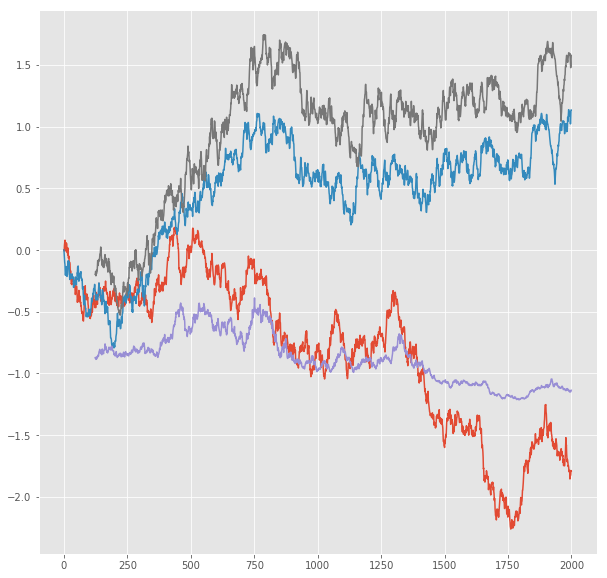

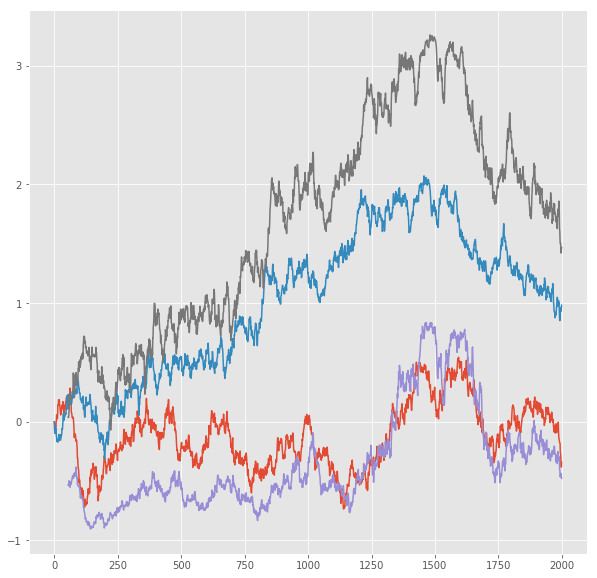

R^2 score for regression on Error: 0.3233
k = 0.5069


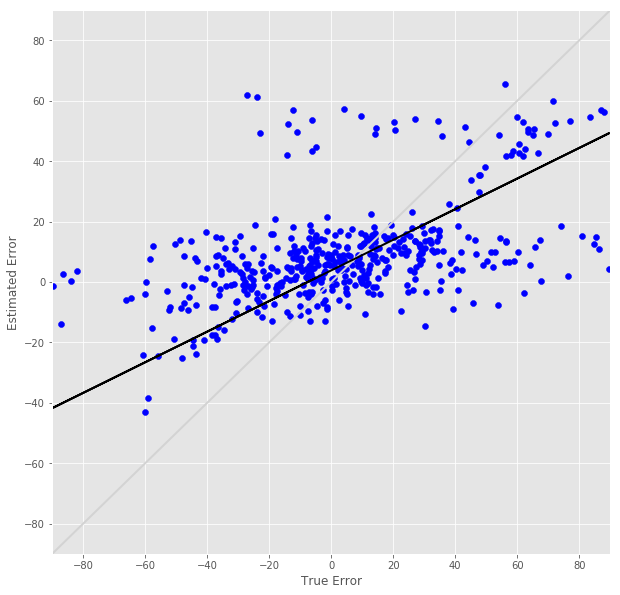

R^2 score for regression on RT: 0.0616
k = 0.1795


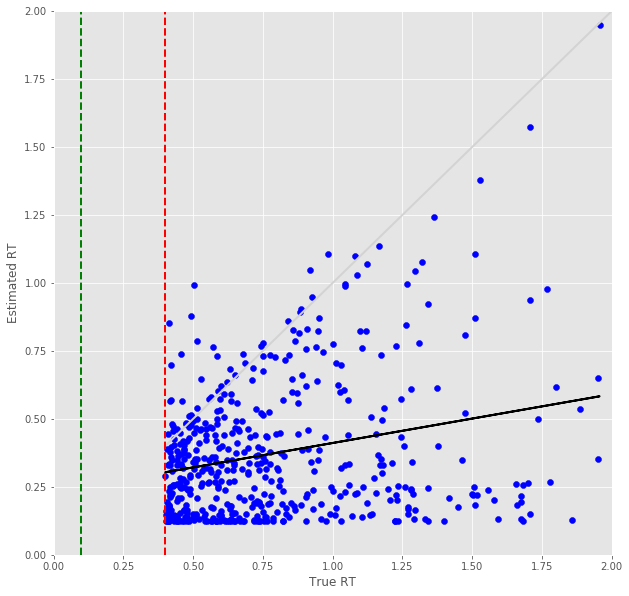

Error Prediction Score: 0.4868 RMSE
RT Prediction Score: 0.5221 RMSE
Error Prediction Corr: 0.5712
RT Prediction Corr: 0.2963
R^2 score for regression on Error: 0.3263
k = 0.4153


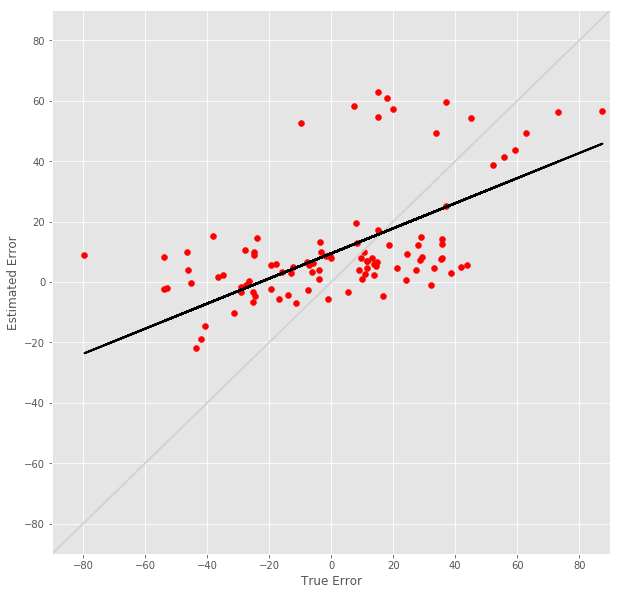

R^2 score for regression on RT: 0.0878
k = 0.2475


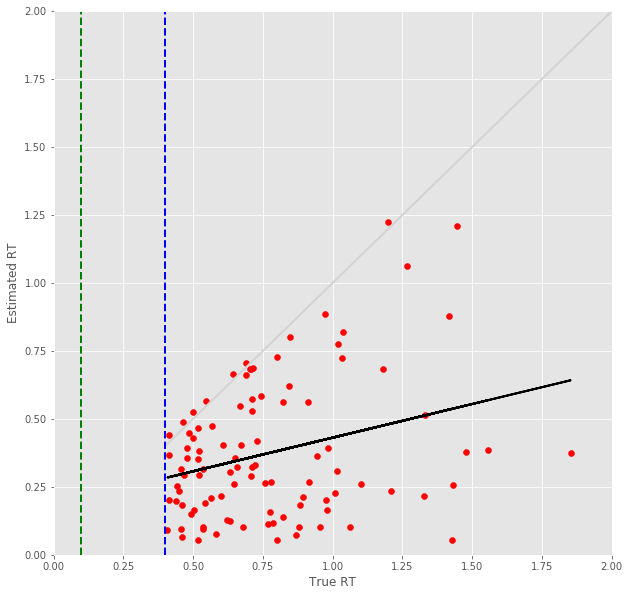

25 -step(s) forecast:
Test Score for 25 -steps forecast: 0.5194 RMSE
Predict Score for 25 -steps forecast: 0.5079 RMSE
Error Test Score for 25 -steps forecast: 0.5656 RMSE
RT Test Score for 25 -steps forecast: 0.5762 RMSE
Error Test Corr for 25 -steps forecast: 0.5436
RT Test Corr for 25 -steps forecast: 0.2072


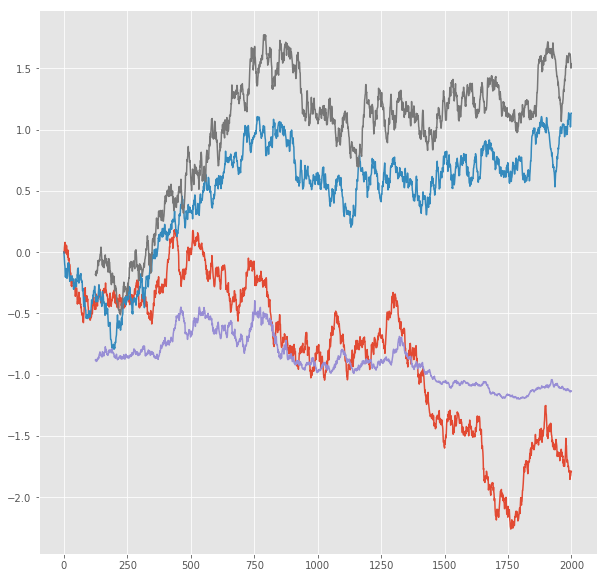

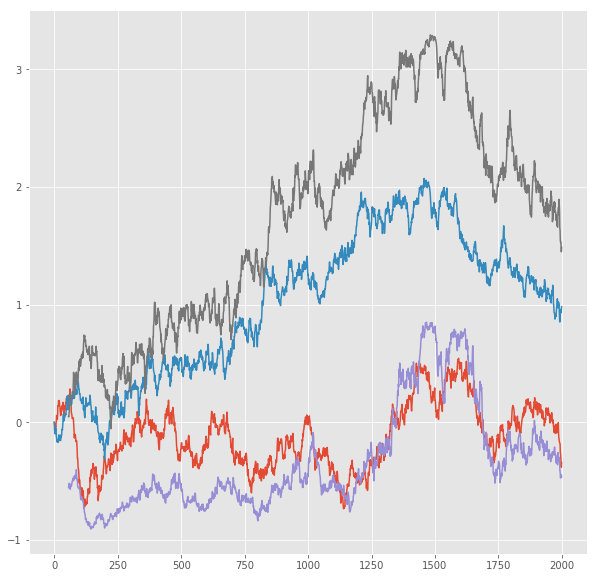

R^2 score for regression on Error: 0.2955
k = 0.4914


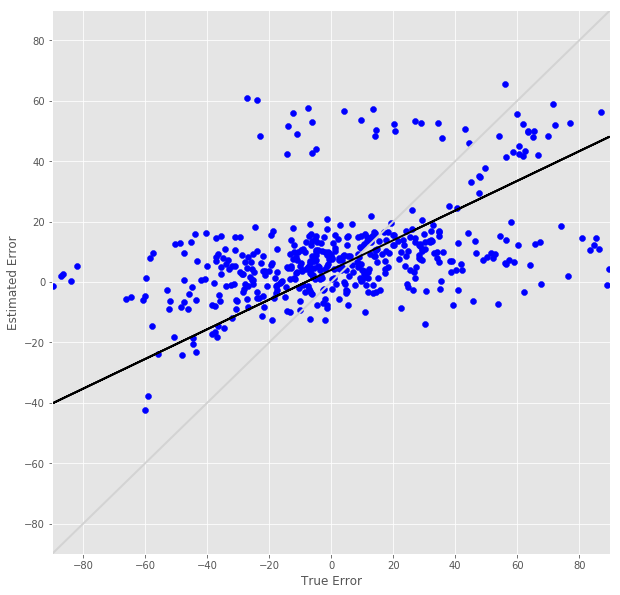

R^2 score for regression on RT: 0.0429
k = 0.1408


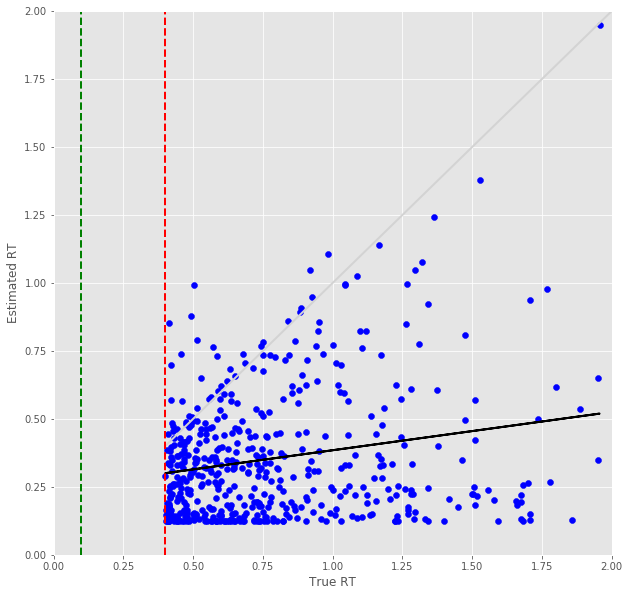

Error Prediction Score: 0.4877 RMSE
RT Prediction Score: 0.5373 RMSE
Error Prediction Corr: 0.5772
RT Prediction Corr: 0.2749
R^2 score for regression on Error: 0.3331
k = 0.4123


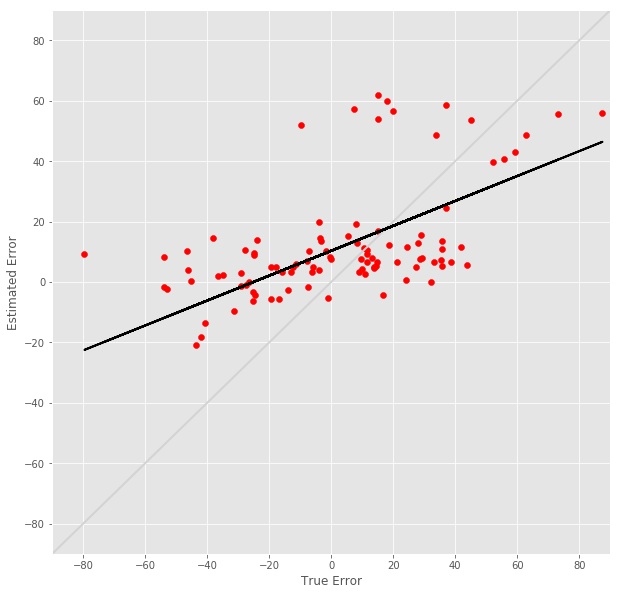

R^2 score for regression on RT: 0.0755
k = 0.2265


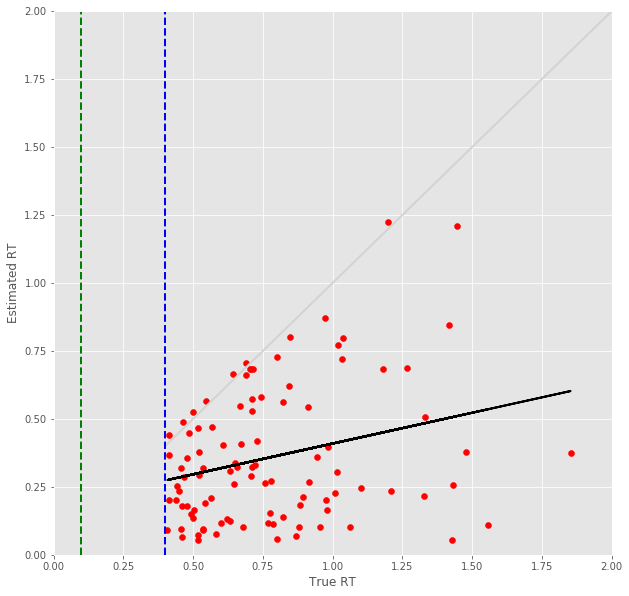

26 -step(s) forecast:
Test Score for 26 -steps forecast: 0.5377 RMSE
Predict Score for 26 -steps forecast: 0.5258 RMSE
Error Test Score for 26 -steps forecast: 0.5719 RMSE
RT Test Score for 26 -steps forecast: 0.5844 RMSE
Error Test Corr for 26 -steps forecast: 0.5590
RT Test Corr for 26 -steps forecast: 0.2040


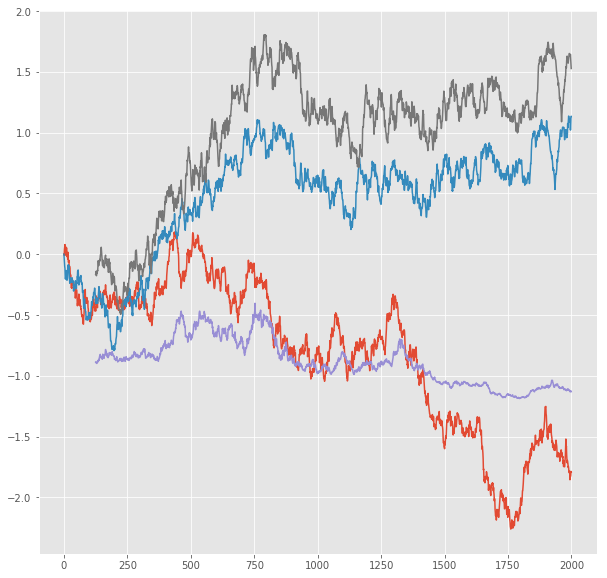

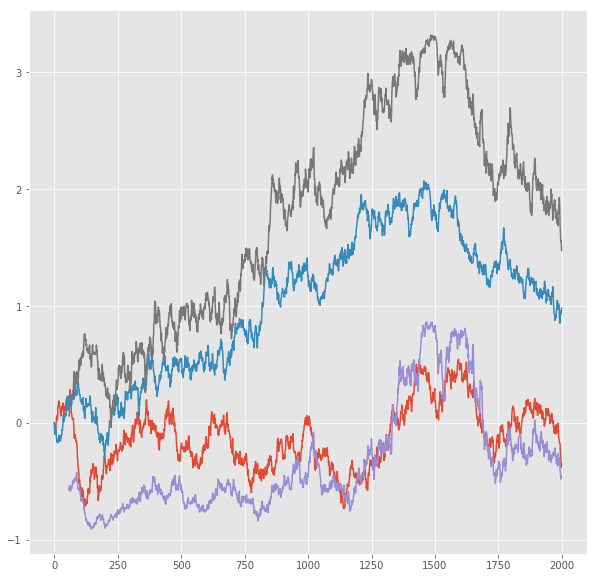

R^2 score for regression on Error: 0.3124
k = 0.5407


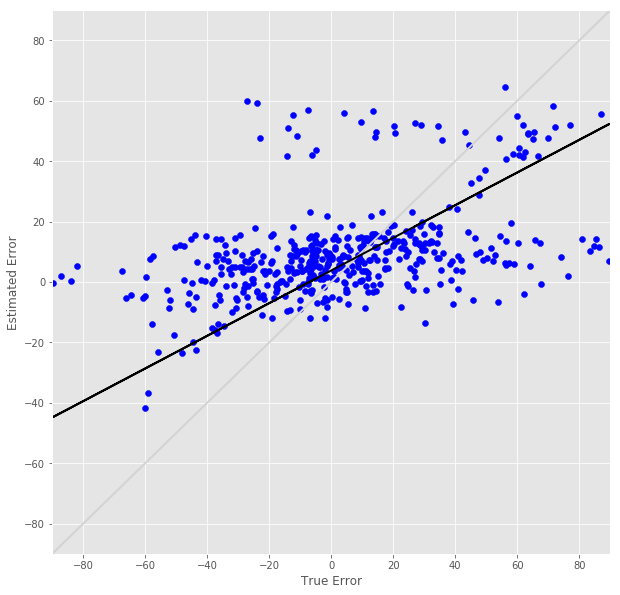

R^2 score for regression on RT: 0.0416
k = 0.1360


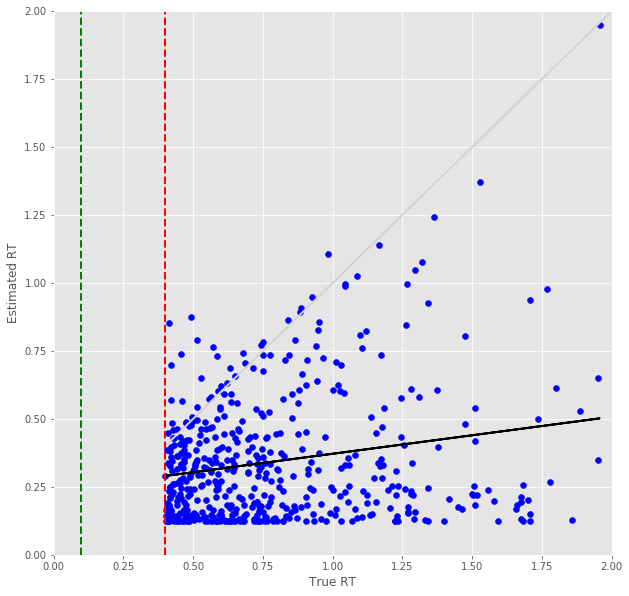

Error Prediction Score: 0.4902 RMSE
RT Prediction Score: 0.5390 RMSE
Error Prediction Corr: 0.5732
RT Prediction Corr: 0.2791
R^2 score for regression on Error: 0.3285
k = 0.4039


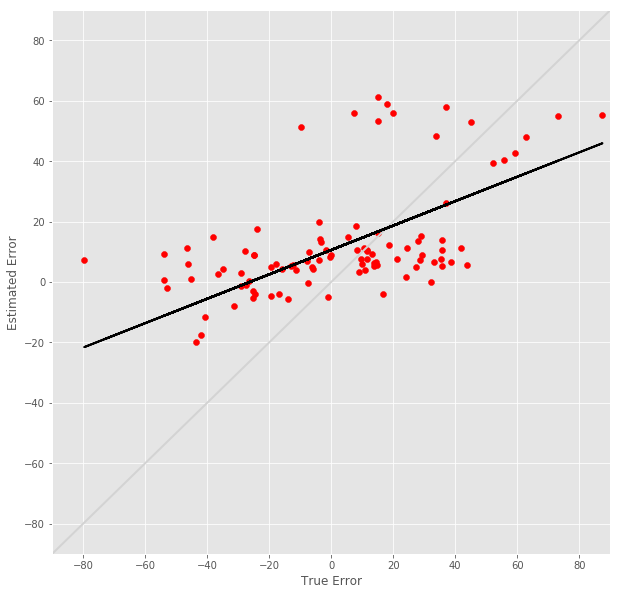

R^2 score for regression on RT: 0.0779
k = 0.2306


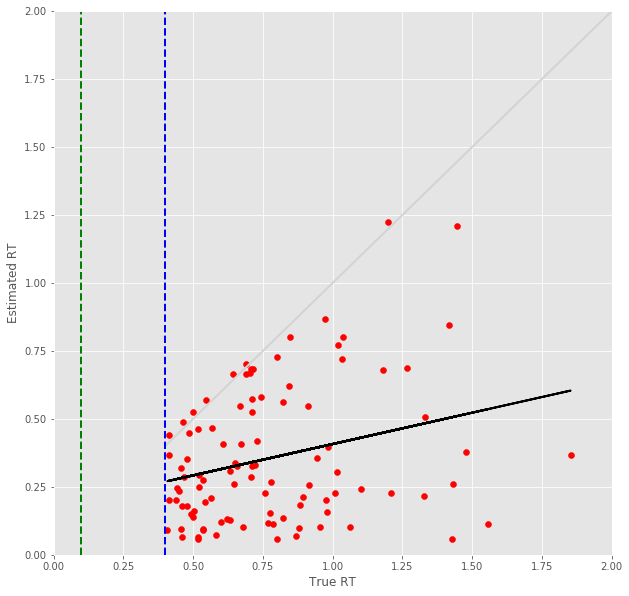

27 -step(s) forecast:
Test Score for 27 -steps forecast: 0.5559 RMSE
Predict Score for 27 -steps forecast: 0.5436 RMSE
Error Test Score for 27 -steps forecast: 0.5778 RMSE
RT Test Score for 27 -steps forecast: 0.5967 RMSE
Error Test Corr for 27 -steps forecast: 0.5542
RT Test Corr for 27 -steps forecast: 0.1807


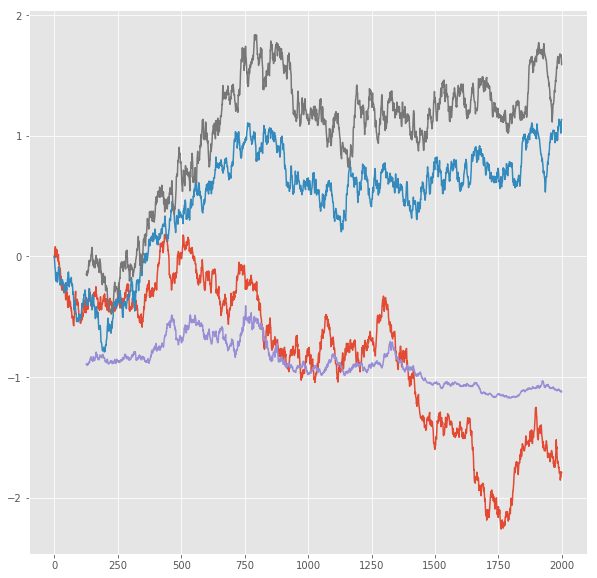

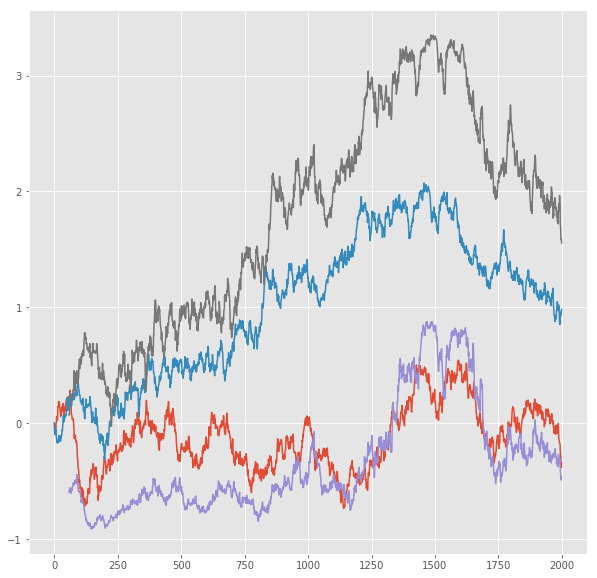

R^2 score for regression on Error: 0.3071
k = 0.5410


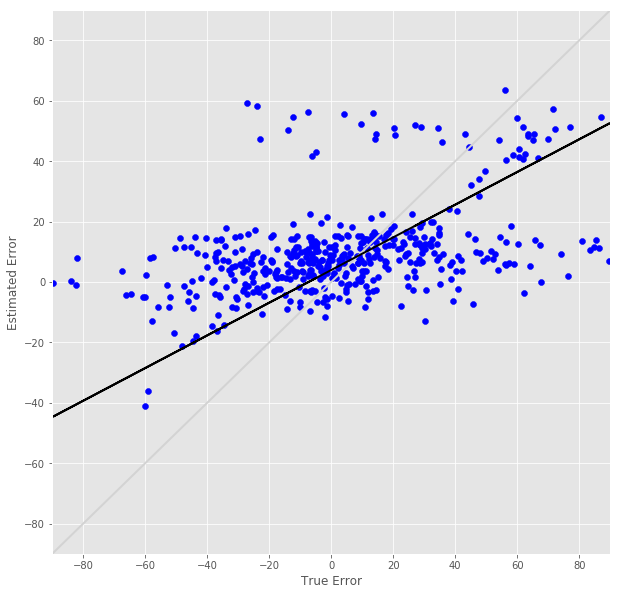

R^2 score for regression on RT: 0.0326
k = 0.1160


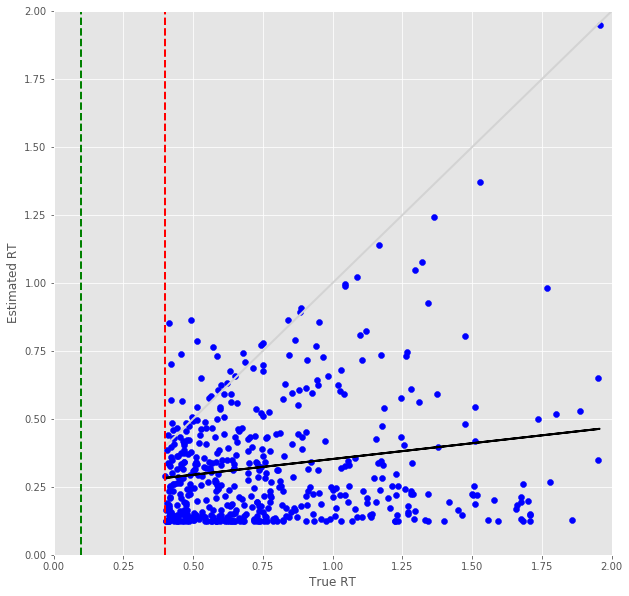

Error Prediction Score: 0.4893 RMSE
RT Prediction Score: 0.5554 RMSE
Error Prediction Corr: 0.5739
RT Prediction Corr: 0.2523
R^2 score for regression on Error: 0.3293
k = 0.3990


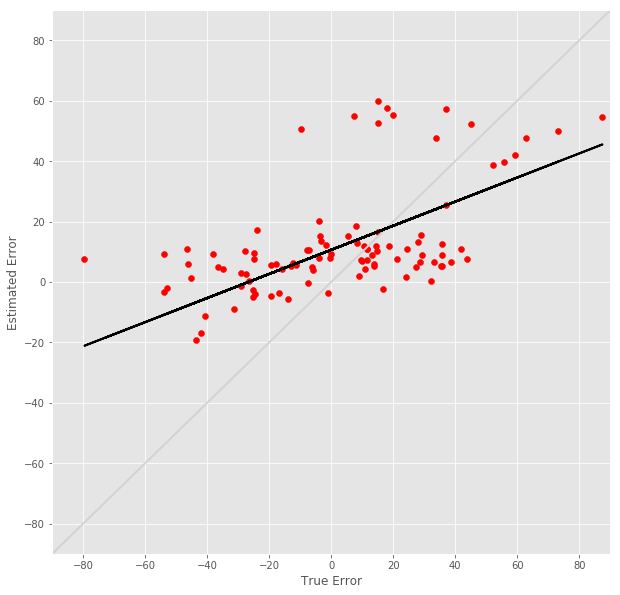

R^2 score for regression on RT: 0.0637
k = 0.2095


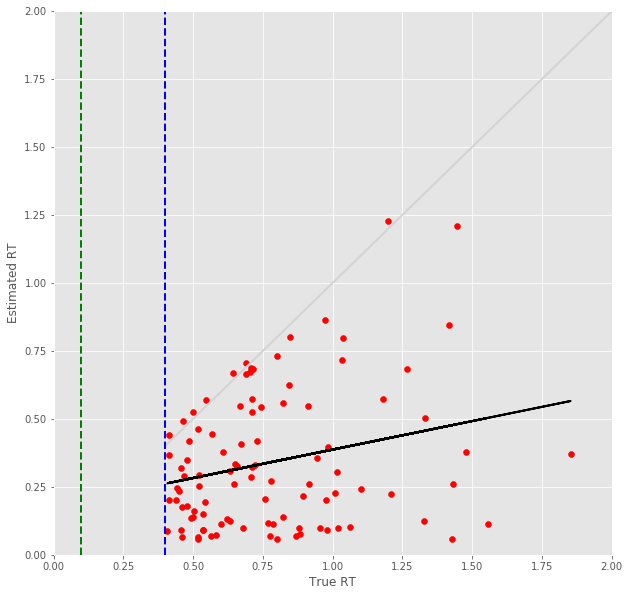

28 -step(s) forecast:
Test Score for 28 -steps forecast: 0.5741 RMSE
Predict Score for 28 -steps forecast: 0.5613 RMSE
Error Test Score for 28 -steps forecast: 0.5836 RMSE
RT Test Score for 28 -steps forecast: 0.6115 RMSE
Error Test Corr for 28 -steps forecast: 0.5544
RT Test Corr for 28 -steps forecast: 0.1482


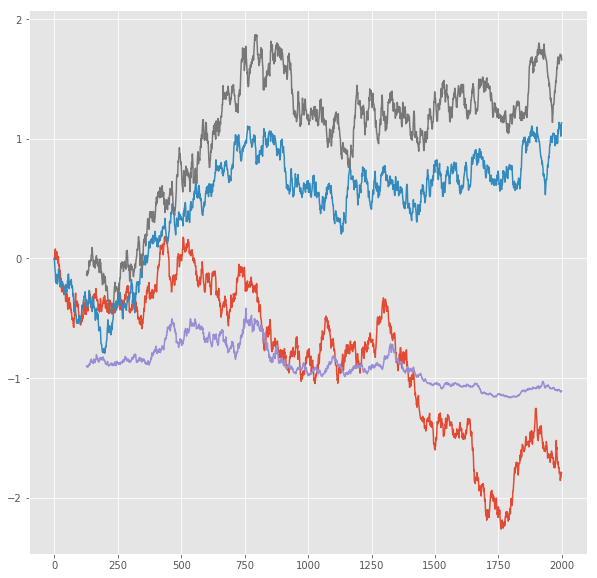

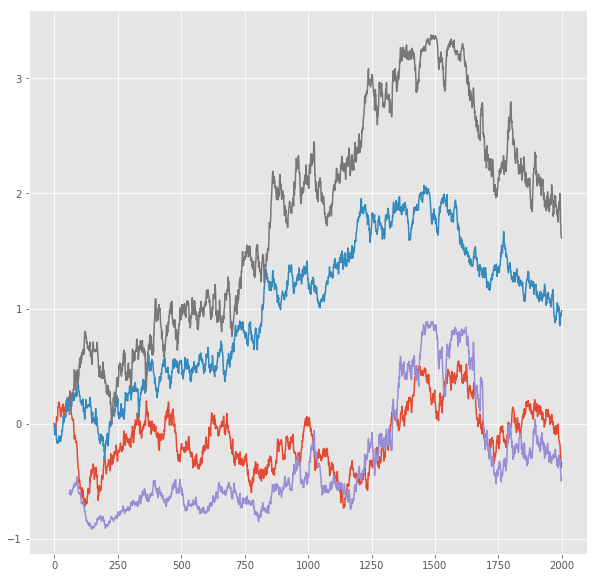

R^2 score for regression on Error: 0.3073
k = 0.5534


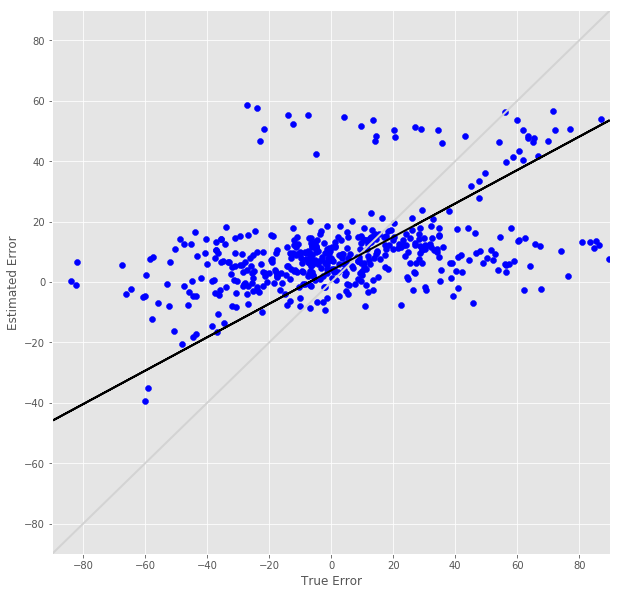

R^2 score for regression on RT: 0.0220
k = 0.0903


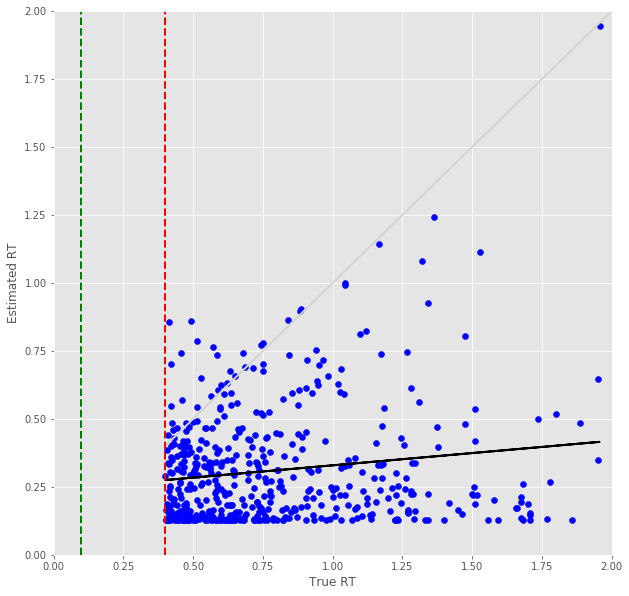

Error Prediction Score: 0.5023 RMSE
RT Prediction Score: 0.5828 RMSE
Error Prediction Corr: 0.5447
RT Prediction Corr: 0.1648
R^2 score for regression on Error: 0.2967
k = 0.3746


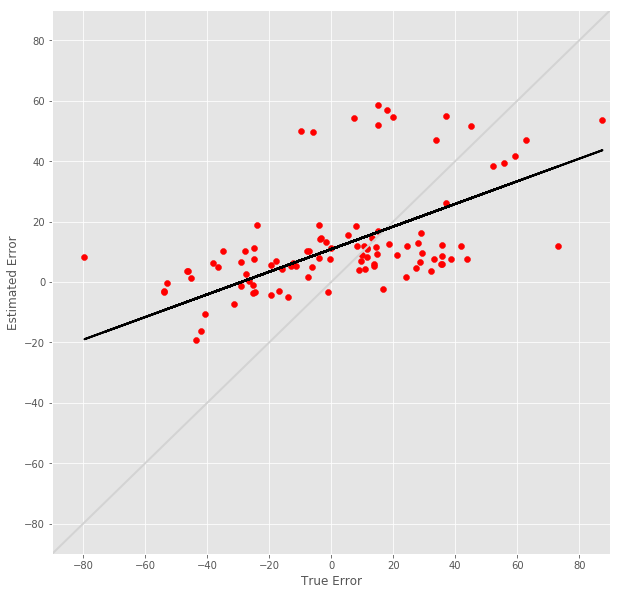

R^2 score for regression on RT: 0.0272
k = 0.1310


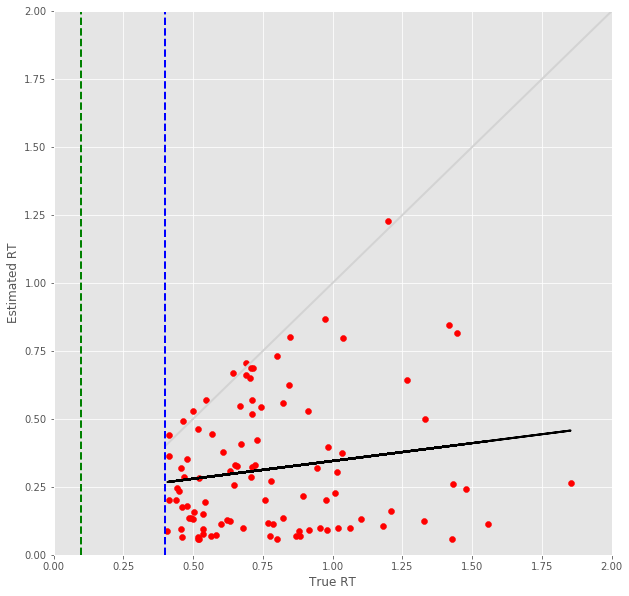

29 -step(s) forecast:
Test Score for 29 -steps forecast: 0.5922 RMSE
Predict Score for 29 -steps forecast: 0.5790 RMSE
Error Test Score for 29 -steps forecast: 0.5899 RMSE
RT Test Score for 29 -steps forecast: 0.6230 RMSE
Error Test Corr for 29 -steps forecast: 0.5107
RT Test Corr for 29 -steps forecast: 0.1182


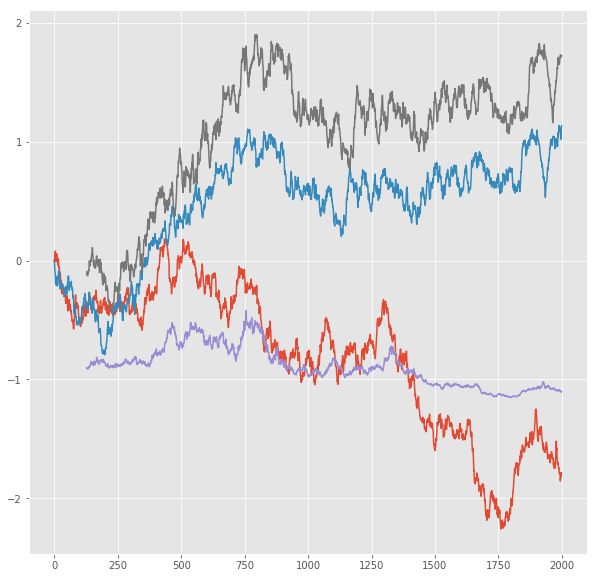

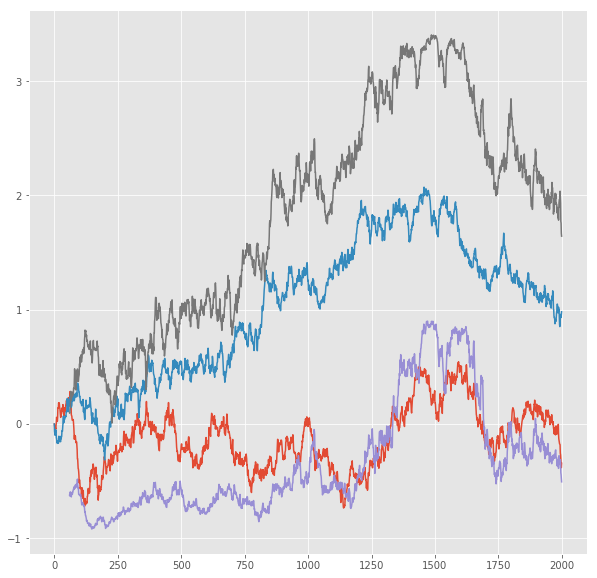

R^2 score for regression on Error: 0.2608
k = 0.4654


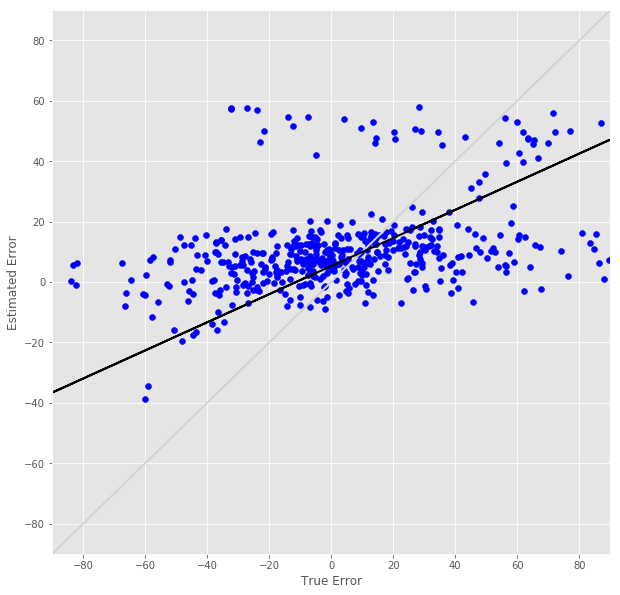

R^2 score for regression on RT: 0.0140
k = 0.0647


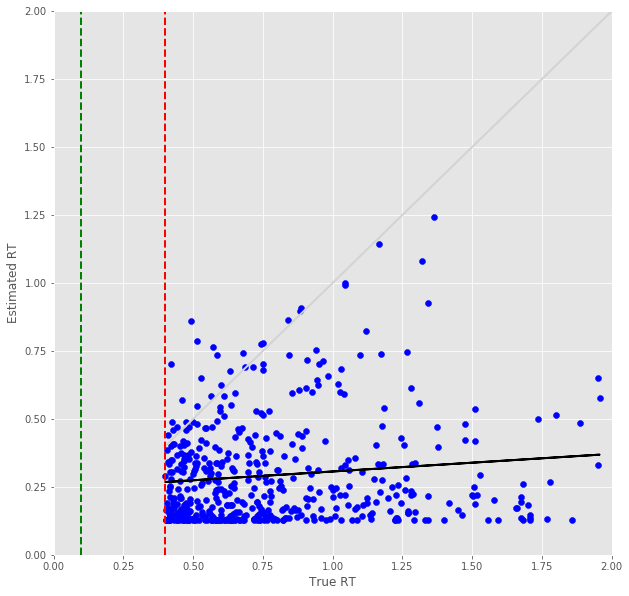

Error Prediction Score: 0.5062 RMSE
RT Prediction Score: 0.5937 RMSE
Error Prediction Corr: 0.5759
RT Prediction Corr: 0.1493
R^2 score for regression on Error: 0.3317
k = 0.5091


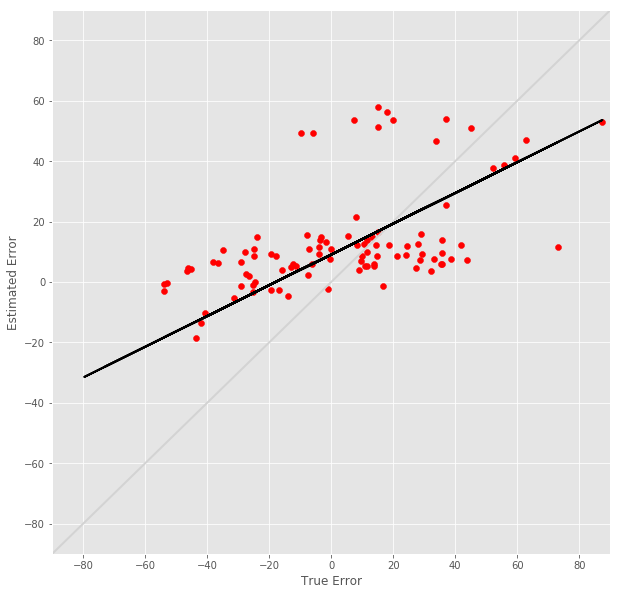

R^2 score for regression on RT: 0.0223
k = 0.1158


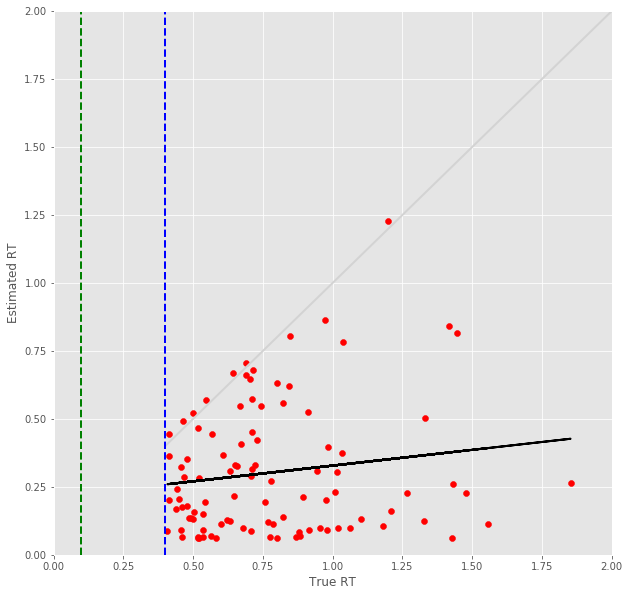

30 -step(s) forecast:
Test Score for 30 -steps forecast: 0.6102 RMSE
Predict Score for 30 -steps forecast: 0.5966 RMSE
Error Test Score for 30 -steps forecast: 0.5935 RMSE
RT Test Score for 30 -steps forecast: 0.6342 RMSE
Error Test Corr for 30 -steps forecast: 0.5061
RT Test Corr for 30 -steps forecast: 0.0854


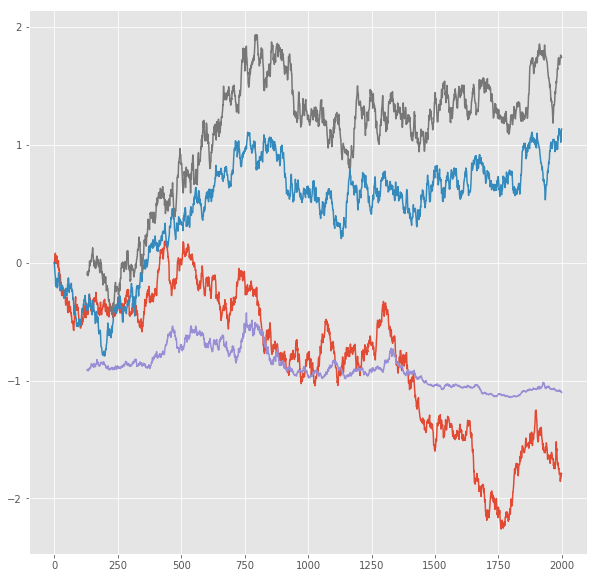

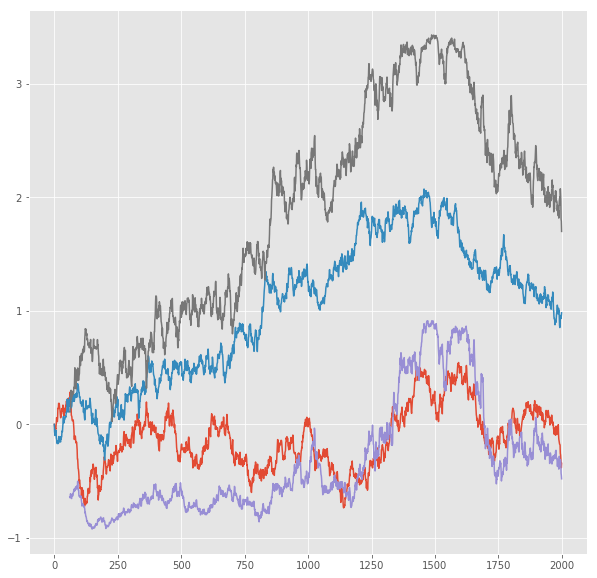

R^2 score for regression on Error: 0.2561
k = 0.4620


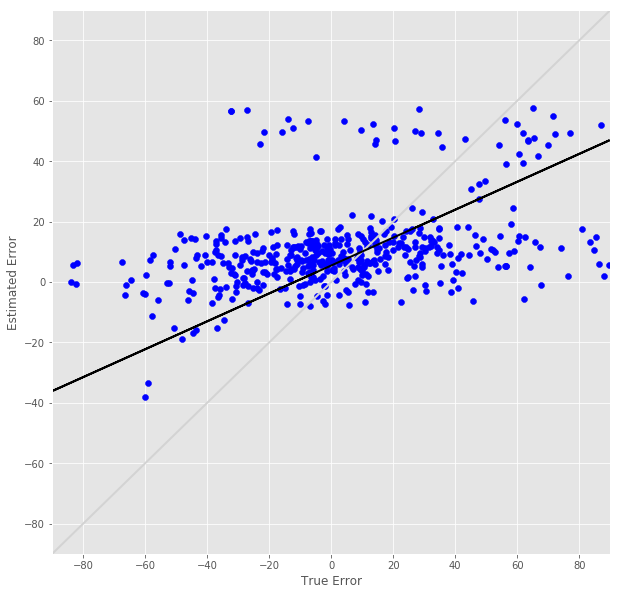

R^2 score for regression on RT: 0.0073
k = 0.0433


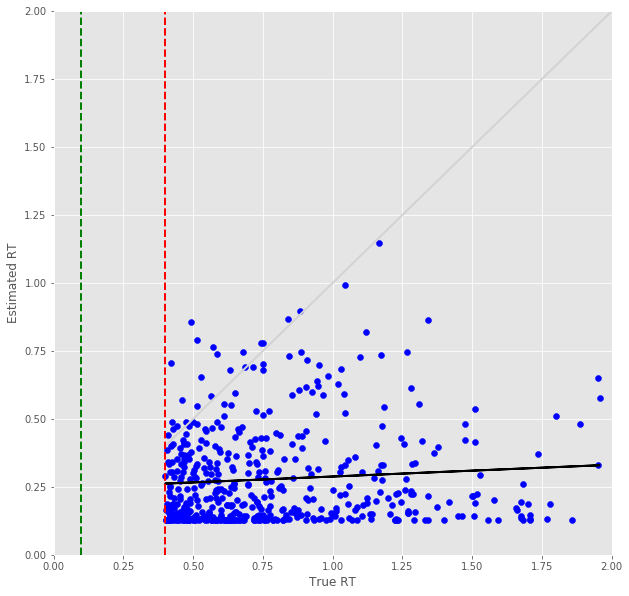

Error Prediction Score: 0.5092 RMSE
RT Prediction Score: 0.5985 RMSE
Error Prediction Corr: 0.5699
RT Prediction Corr: 0.1571
R^2 score for regression on Error: 0.3247
k = 0.4992


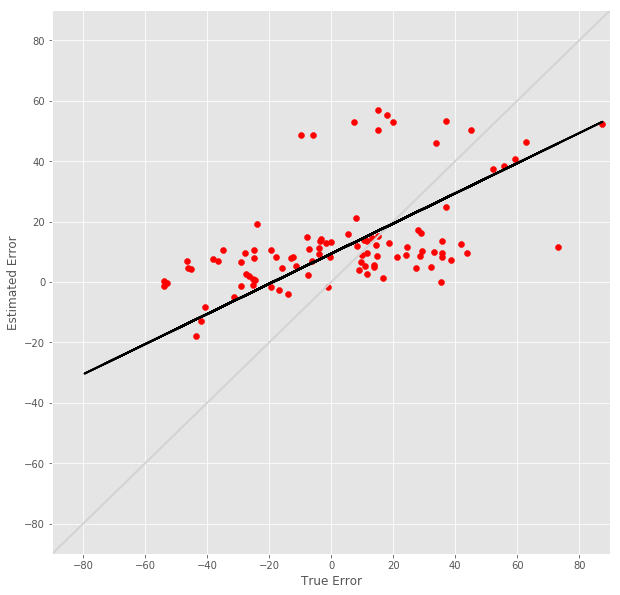

R^2 score for regression on RT: 0.0247
k = 0.1219


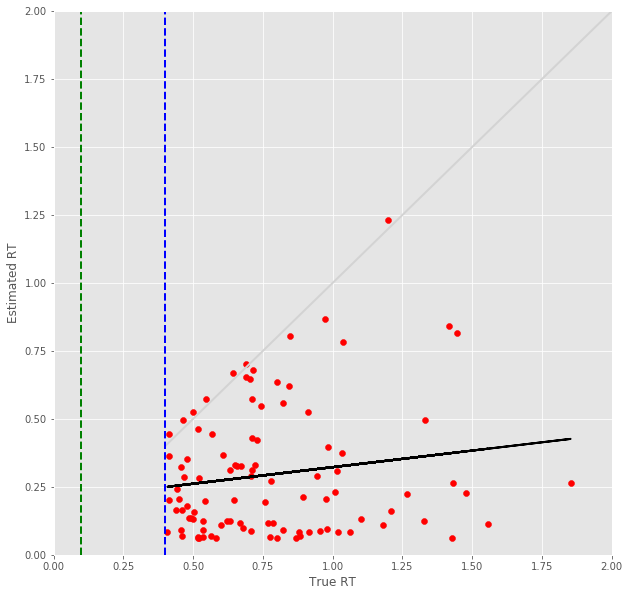

31 -step(s) forecast:
Test Score for 31 -steps forecast: 0.6282 RMSE
Predict Score for 31 -steps forecast: 0.6142 RMSE
Error Test Score for 31 -steps forecast: 0.5987 RMSE
RT Test Score for 31 -steps forecast: 0.6409 RMSE
Error Test Corr for 31 -steps forecast: 0.4965
RT Test Corr for 31 -steps forecast: 0.0723


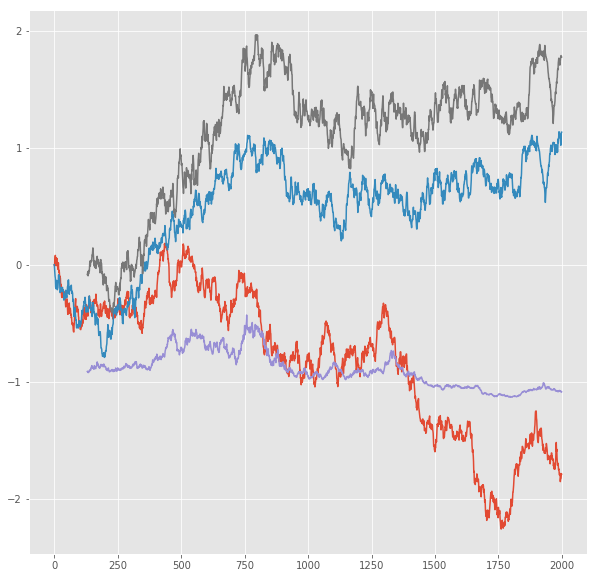

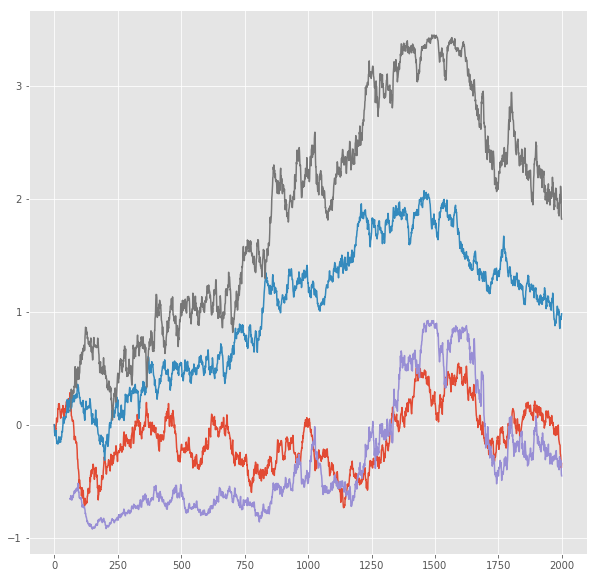

R^2 score for regression on Error: 0.2465
k = 0.4511


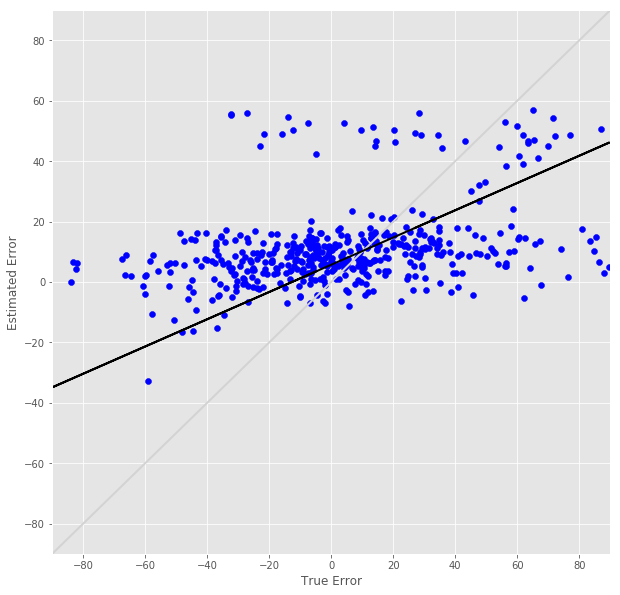

R^2 score for regression on RT: 0.0052
k = 0.0359


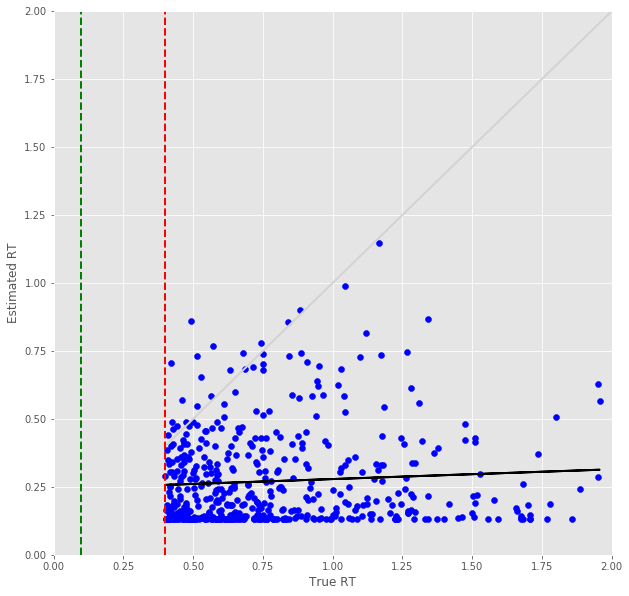

Error Prediction Score: 0.5400 RMSE
RT Prediction Score: 0.6070 RMSE
Error Prediction Corr: 0.4809
RT Prediction Corr: 0.1724
R^2 score for regression on Error: 0.2313
k = 0.3626


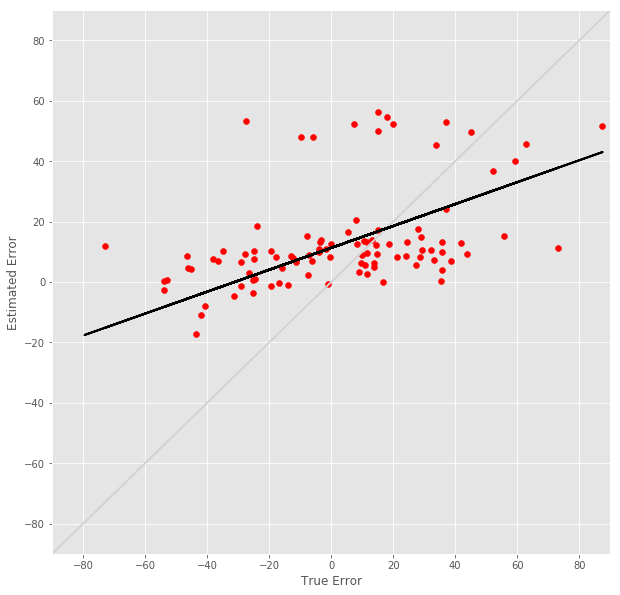

R^2 score for regression on RT: 0.0297
k = 0.1316


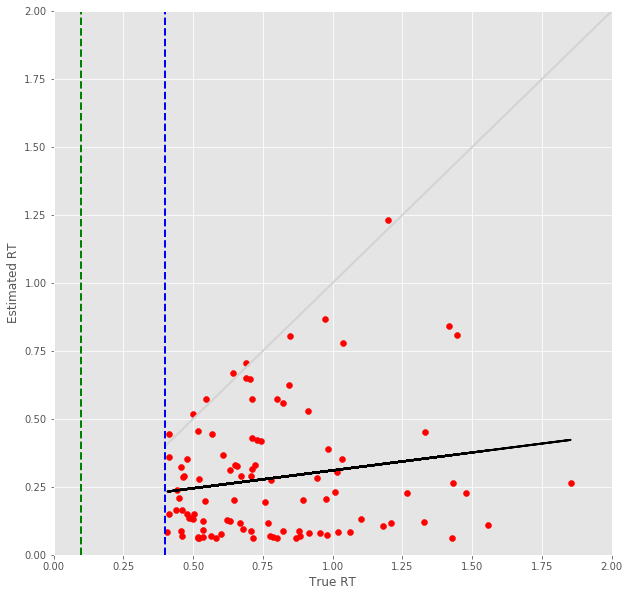

32 -step(s) forecast:
Test Score for 32 -steps forecast: 0.6461 RMSE
Predict Score for 32 -steps forecast: 0.6318 RMSE
Error Test Score for 32 -steps forecast: 0.6053 RMSE
RT Test Score for 32 -steps forecast: 0.6468 RMSE
Error Test Corr for 32 -steps forecast: 0.4960
RT Test Corr for 32 -steps forecast: 0.0770


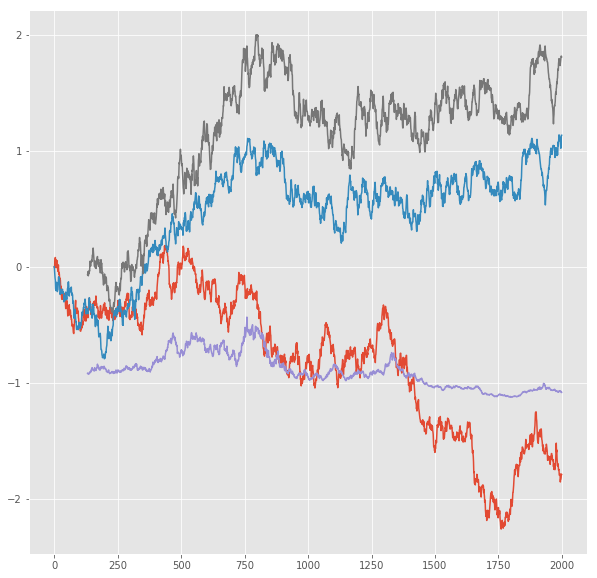

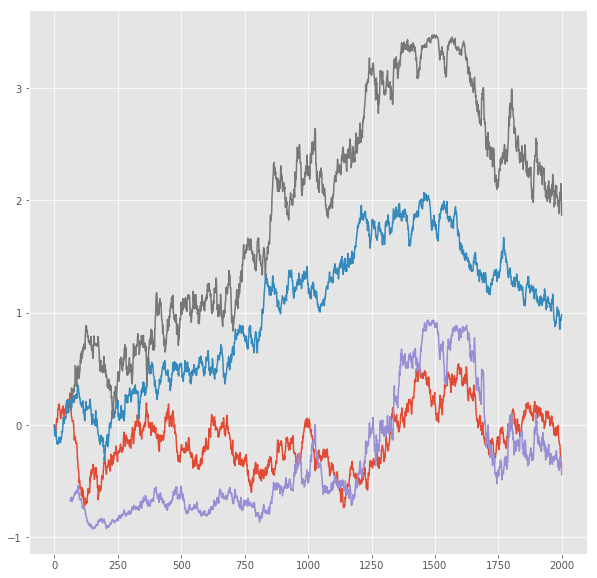

R^2 score for regression on Error: 0.2460
k = 0.4664


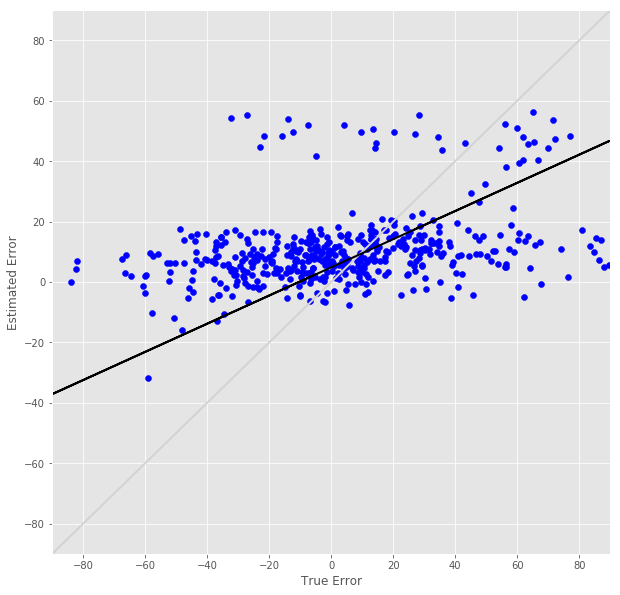

R^2 score for regression on RT: 0.0059
k = 0.0368


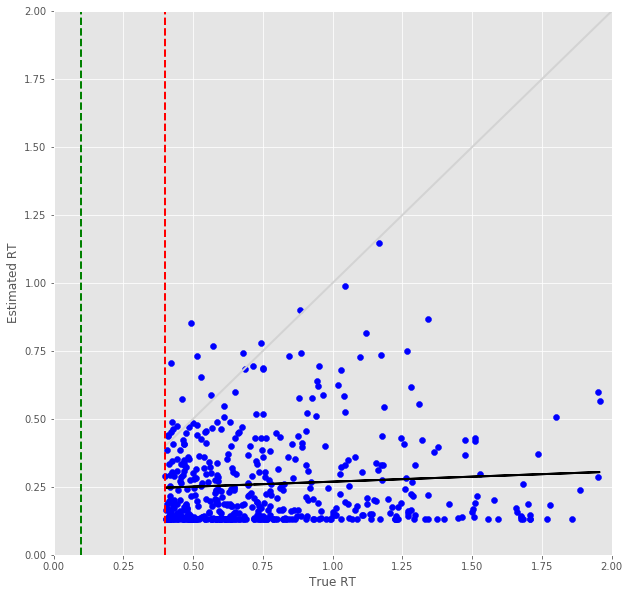

Error Prediction Score: 0.5361 RMSE
RT Prediction Score: 0.6191 RMSE
Error Prediction Corr: 0.4797
RT Prediction Corr: 0.1659
R^2 score for regression on Error: 0.2301
k = 0.3531


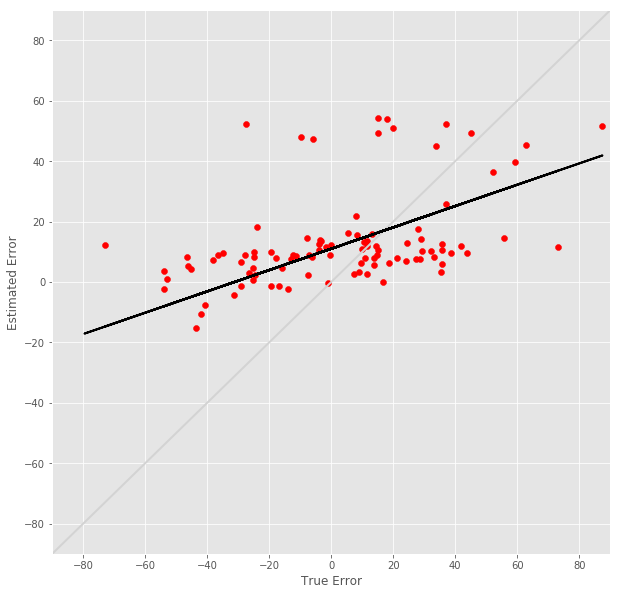

R^2 score for regression on RT: 0.0275
k = 0.1230


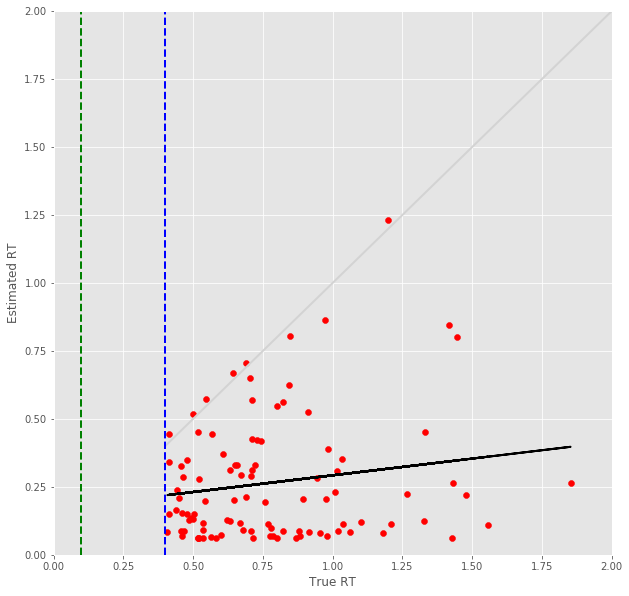

In [12]:
testScore, predictScore = [], []
NumEffectiveTest, ResponseTestScore, RTTestScore = [], [], []
NumEffectivePrediction, ResponsePredictionScore, RTPredictionScore = [], [], []
ResponseTestCorr, RTTestCorr, ResponsePredictionCorr, RTPredictionCorr = [], [], [], []

X_test_temp = testX
X_predict_temp = predictX

for FORECAST_STEP in range(1, FORECAST_MAX + 1):
    print('%d -step(s) forecast:' % (FORECAST_STEP))
    
    # use this function to prepare the train and test datasets for targeting
    
    testY, predictY = [], []
    for k in range(numSeries):
        kk = k * test_size
        for i in range(test_size - look_back - FORECAST_STEP + 1):
            testY.append(test[kk + i + look_back + FORECAST_STEP - 1, :])
    for k in range(numPredict):
        kk = k * lentmax
        for i in range(lentmax - look_back - FORECAST_STEP + 1):
            predictY.append(predict[kk + i + look_back + FORECAST_STEP - 1, :])
    testY = numpy.array(testY)
    predictY = numpy.array(predictY)

    # make predictions
    testPredict = model.predict(X_test_temp)
    predictPredict = model.predict(X_predict_temp)
    if FORECAST_STEP <= FORECAST_MAX:
        X_test_trouble = X_test_temp
        X_predict_trouble = X_predict_temp
        for l in range(look_back - 1):
            X_test_trouble[:, l, :] = X_test_trouble[:, l + 1, :]
            X_predict_trouble[:, l, :] = X_predict_trouble[:, l + 1, :]
        X_test_trouble[:, look_back - 1, :] = testPredict
        X_predict_trouble[:, look_back - 1, :] = predictPredict
        X_test_temp, X_predict_temp = [], []
        for i in range(numSeries):
            for j in range(test_size - look_back - FORECAST_STEP):
                k = i * (test_size - look_back - FORECAST_STEP + 1) + j
                X_test_temp.append(X_test_trouble[k])
        for i in range(numPredict):
            for j in range(lentmax - look_back - FORECAST_STEP):
                k = i * (lentmax - look_back - FORECAST_STEP + 1) + j
                X_predict_temp.append(X_predict_trouble[k])
        X_test_temp = numpy.array(X_test_temp)
        X_predict_temp = numpy.array(X_predict_temp)
        
    # invert predictions
    testPredict = scaler.inverse_transform(testPredict)
    testY = scaler.inverse_transform(testY)
    predictPredict = scaler.inverse_transform(predictPredict)
    predictY = scaler.inverse_transform(predictY)

    testScore.append(math.sqrt(mean_squared_error(testY, testPredict)))
    predictScore.append(math.sqrt(mean_squared_error(predictY, predictPredict)))
    print('Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, testScore[FORECAST_STEP - 1]))
    print('Predict Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, predictScore[FORECAST_STEP - 1]))
    
    # shift test predictions for plotting
    testPredictPlot = numpy.empty_like(Data)
    testPredictPlot[:, :, :] = numpy.nan
    for s in range(numSeries):
        for t in range(test_size - look_back - FORECAST_STEP + 1):
            testPredictPlot[s, t + TRAIN_SIZE + FORECAST_STEP - 1, :] = testPredict[t + s * (test_size - look_back - FORECAST_STEP + 1), :]

    # shift complete predictions for plotting
    predictPredictPlot = numpy.empty_like(Data_p)
    predictPredictPlot[:, :, :] = numpy.nan
    for s in range(numPredict):
        for t in range(TOTAL_TIME - look_back - FORECAST_STEP + 1):
            predictPredictPlot[s, t + look_back + FORECAST_STEP - 1, :] = predictPredict[t + s * (TOTAL_TIME - look_back - FORECAST_STEP + 1), :]
    
    # Output the estimation score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = trainPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break
            temp = testPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectiveTest.append(float(len(Err)) / numSeries)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponseTestScore.append(0)
        RTTestScore.append(0)
        ResponseTestCorr.append(0)
        RTTestCorr.append(0)
    else:
        ResponseTestScore.append(math.sqrt(sum(Err) / len(Err)))
        RTTestScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponseTestCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTTestCorr.append(S1.corr(S2))
    
    print('Error Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, ResponseTestScore[FORECAST_STEP - 1]))
    print('RT Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, RTTestScore[FORECAST_STEP - 1]))
    print('Error Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, ResponseTestCorr[FORECAST_STEP - 1]))
    print('RT Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, RTTestCorr[FORECAST_STEP - 1]))
    
    #lalala
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data[loc])
    plt.plot(testPredictPlot[loc])
    plt.show()
    
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data_p[loc])
    plt.plot(predictPredictPlot[loc])
    plt.show()
    #lalala
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'b')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'b')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='r')
        plt.show()
    
    # Output the prediction score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries, numSeries + numPredict):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = predictPredictPlot[s - numSeries, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectivePrediction.append(float(len(Err)) / numPredict)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponsePredictionScore.append(0)
        RTPredictionScore.append(0)
        ResponsePredictionCorr.append(0)
        RTPredictionCorr.append(0)
    else:
        ResponsePredictionScore.append(math.sqrt(sum(Err) / len(Err)))
        RTPredictionScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponsePredictionCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTPredictionCorr.append(S1.corr(S2))
            
    print('Error Prediction Score: %.4f RMSE' % (ResponsePredictionScore[FORECAST_STEP - 1]))
    print('RT Prediction Score: %.4f RMSE' % (RTPredictionScore[FORECAST_STEP - 1]))
    print('Error Prediction Corr: %.4f' % (ResponsePredictionCorr[FORECAST_STEP - 1]))
    print('RT Prediction Corr: %.4f' % (RTPredictionCorr[FORECAST_STEP - 1]))
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'r')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'r')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='b')
        plt.show()
    

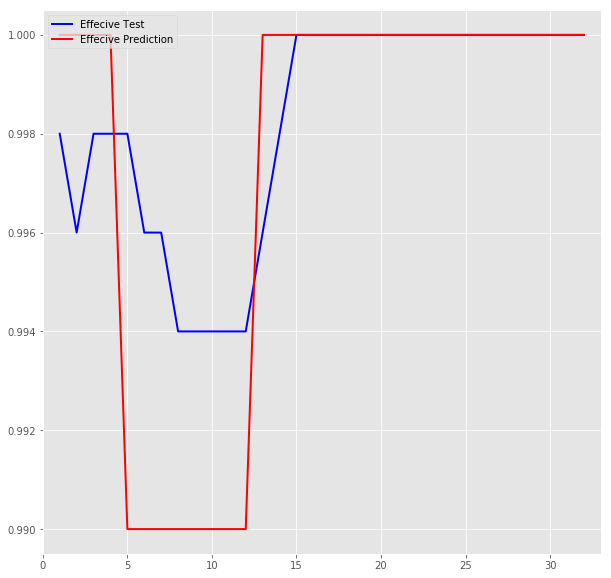

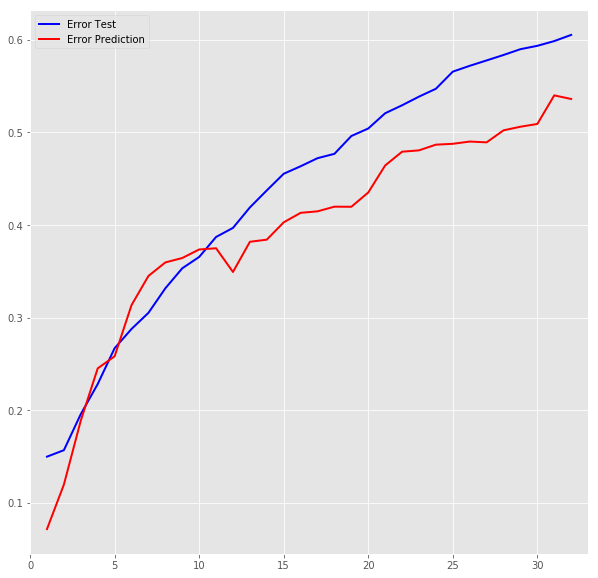

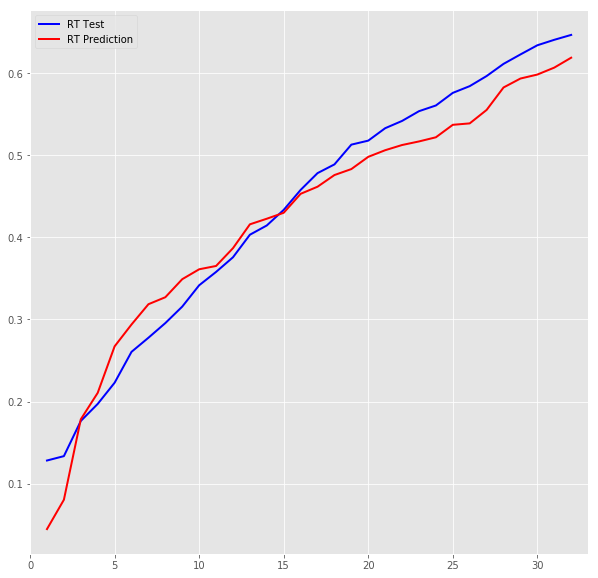

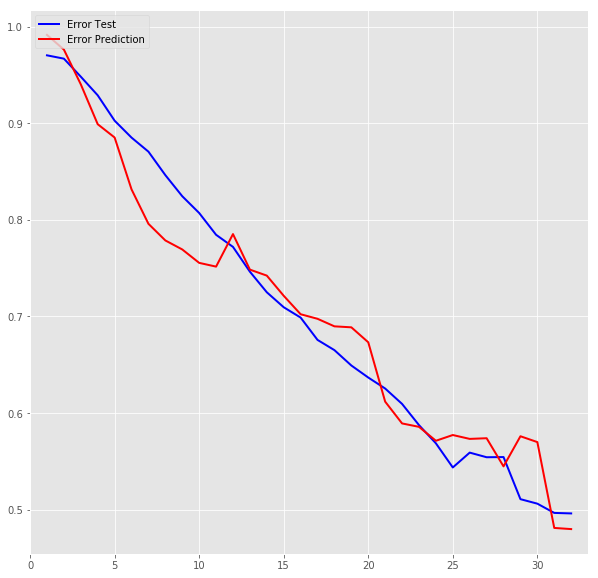

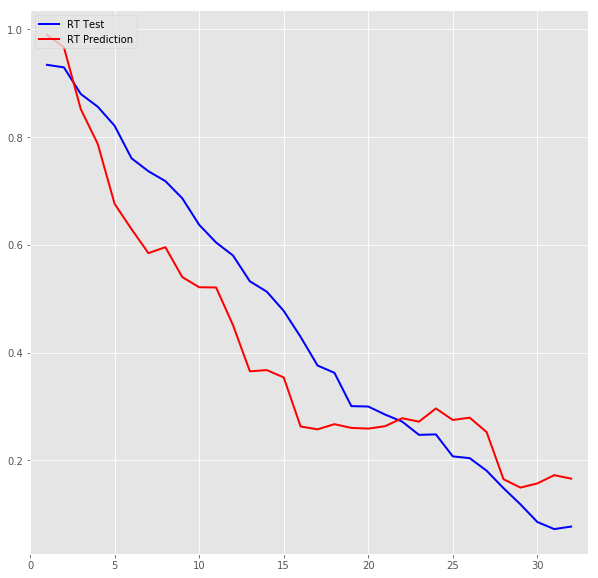

In [13]:
NumEffectiveTest = numpy.array(NumEffectiveTest)
ResponseTestScore = numpy.array(ResponseTestScore)
RTTestScore = numpy.array(RTTestScore)
ResponseTestCorr = numpy.array(ResponseTestCorr)
RTTestCorr = numpy.array(RTTestCorr)
NumEffectivePrediction = numpy.array(NumEffectivePrediction)
ResponsePredictionScore = numpy.array(ResponsePredictionScore)
RTPredictionScore = numpy.array(RTPredictionScore)
ResponsePredictionCorr = numpy.array(ResponsePredictionCorr)
RTPredictionCorr = numpy.array(RTPredictionCorr)

xx = numpy.arange(1, FORECAST_MAX + 1)

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
EffectiveTestPlot = plt.plot(xx, NumEffectiveTest, linewidth = 2, color = 'b', label = "Effecive Test")
EffectivePredictionPlot = plt.plot(xx, NumEffectivePrediction, linewidth = 2, color = 'r', label = "Effecive Prediction")
plt.legend(handles=[EffectiveTestPlot[0], EffectivePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestPlot = plt.plot(xx, ResponseTestScore, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionPlot = plt.plot(xx, ResponsePredictionScore, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestPlot[0], ResponsePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestPlot = plt.plot(xx, RTTestScore, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionPlot = plt.plot(xx, RTPredictionScore, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestPlot[0], RTPredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestCorrPlot = plt.plot(xx, ResponseTestCorr, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionCorrPlot = plt.plot(xx, ResponsePredictionCorr, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestCorrPlot[0], ResponsePredictionCorrPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestCorrPlot = plt.plot(xx, RTTestCorr, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionCorrPlot = plt.plot(xx, RTPredictionCorr, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestCorrPlot[0], RTPredictionCorrPlot[0]],loc="upper left")
plt.show()
